In [1]:
import pandas as pd
import numpy as np
from datetime import datetime

import matplotlib.pyplot as plt

import os
import pathlib
import re
import yaml
import seaborn as sns
import mplcursors

# NLP libraries
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
nltk.download('stopwords')
nltk.download('punkt')
from wordcloud import WordCloud

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\salto\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\salto\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Importing data

In [2]:
try:
    with open("../config.yaml", "r") as file:
        config = yaml.safe_load(file)
except:
    print("The configuration file was not found!")

In [3]:
filename = config['data']['clean']['clean_8']
data = pd.read_csv(filename)

In [4]:
data

,Unnamed: 0,video_id,title,channelId,channelTitle,trending_date,views,likes,comments,description,...,cleaned_title1,cleaned_title_lemmatized,final_title,cleaned_description,views_velocity,likes_velocity,comments_velocity,time_to_trend_hr,trending_duration_days,comments_polarity
0,0,hpMeCem6Hss,"I FOUGHT BRYCE HALL...Ft. Mike Majlak, Lana Rh...",UCWTQG2aMDYKGDqYEGqJb1FA,Life of Bradley Martyn,2020-08-12 00:00:00+00:00,1123529,39289,3626,It is what it is.... New drop coming this mont...,...,fought bryce hall mike majlak lana rhoades ste...,fought bryce hall mike majlak lana rhoades ste...,fought bryce hall mike majlak lana rhoades ste...,It is what it is New drop coming this month,1.605041e+05,5612.714286,518.000000,148.29,0.0,0.11
1,1,K_uCyxNsHpo,Brooklyn's 10 DATES in 10 DAYS | Meet Jorge (D...,UC6QWhGQqf0YDYdRb0n6ojWw,Brooklyn and Bailey,2020-08-12 00:00:00+00:00,1120675,41671,5282,Brooklyn is going on TEN DATES in TEN DAYS! (T...,...,brooklyn dates days meet jorge date,brooklyn date day meet jorge date,brooklyn date day meet jorge,Brooklyn is going on TEN DATES in TEN DAYS This,1.600964e+05,5953.000000,754.571429,146.88,0.0,0.10
2,2,v97FPN2US2o,Joji & Diplo - Daylight (Official Music Video),UCZW5lIUz93q_aZIkJPAC0IQ,88rising,2020-08-13 00:00:00+00:00,3363606,279004,13270,LISTEN TO DAYLIGHT: https://88rising.lnk.to/Da...,...,joji diplo daylight official music video,joji diplo daylight official music video,joji diplo daylight official music video,NaN,4.805151e+05,39857.714286,1895.714286,128.00,1.0,0.06
3,3,czwejgoH3zs,"Son, lemme teach you something new",UCw03U5DZGLqvv5elJvXvR0Q,Bread Boys,2020-08-12 00:00:00+00:00,1722152,169501,7263,badum tss *funny haha noises*YOU CAN FIND US H...,...,son lemme teach new,son lem me teach new,son lem teach new,NaN,2.870253e+05,28250.166667,1210.500000,124.21,0.0,0.21
4,4,kz7gHA2N6nQ,"World's Strongest Man vs $10,000 Safe! *unbrea...",UCXg4rJUbDP1IP3TmZ9KDpJg,Brianna,2020-08-13 00:00:00+00:00,2542951,55024,5796,"World's Strongest Man vs $10,000 Safe! *unbrea...",...,world strongest man safe unbreakable,world strong man safe unbreakable,world strong man safe unbreakable,Worlds Strongest Man vs Safe with Brianna,3.632787e+05,7860.571429,828.000000,123.06,1.0,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12359,12359,AYDICzSsjmY,I Built a LEGO WATER PARK,UC6889KWo5GDEqcYaym1lq9g,MasterBuilders,2024-04-15 00:00:00+00:00,296206,7914,581,"I built a GIANT Lego water park with pools, wa...",...,built lego water park,built lego water park,built lego water park,I built a GIANT Lego water park with pools water,1.481030e+05,3957.000000,290.500000,11.00,1.0,0.28
12360,12360,8Tt5hh7gVVw,I Tested 1-Star Hotels (again),UCnmGIkw-KdI0W5siakKPKog,Ryan Trahan,2024-04-15 00:00:00+00:00,4532769,175418,11464,jammy time,...,tested star hotels,test star hotel,test star hotel,NaN,2.266384e+06,87709.000000,5732.000000,9.00,1.0,0.11
12361,12361,8p9NPLvlrv0,I Tried Every Airline In America,UCyps-v4WNjWDnYRKmZ4BUGw,Airrack,2024-04-15 00:00:00+00:00,743605,38774,2897,Follow me on Instagram!INSTAGRAM ▶️ https://ur...,...,tried airline america,try airline america,try airline america,NaN,3.718025e+05,19387.000000,1448.500000,7.62,1.0,0.00
12362,12362,4MxNTXCRDOs,Family Photo Booth & Shopping In Town,UCnEn0EUV13IR-_TK7fiIp3g,Alfie Deyes Vlogs,2024-04-15 00:00:00+00:00,167147,11334,425,► Family Photo Booth & Shopping In Town• Ad • ...,...,family photo booth shopping town,family photo booth shopping town,family photo booth shopping town,Family Photo Booth Shopping In Town Ad,1.671470e+05,11334.000000,425.000000,16.98,0.0,0.29


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12364 entries, 0 to 12363
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                12364 non-null  int64  
 1   video_id                  12364 non-null  object 
 2   title                     12364 non-null  object 
 3   channelId                 12364 non-null  object 
 4   channelTitle              12364 non-null  object 
 5   trending_date             12364 non-null  object 
 6   views                     12364 non-null  int64  
 7   likes                     12364 non-null  int64  
 8   comments                  12364 non-null  int64  
 9   description               11929 non-null  object 
 10  categoryTitle             12364 non-null  object 
 11  TotalDuration(sec)        12364 non-null  float64
 12  channel_views_per_video   12357 non-null  float64
 13  LikeRatio1                12364 non-null  float64
 14  Commen

In [6]:
data.columns

Index(['Unnamed: 0', 'video_id', 'title', 'channelId', 'channelTitle',
       'trending_date', 'views', 'likes', 'comments', 'description',
       'categoryTitle', 'TotalDuration(sec)', 'channel_views_per_video',
       'LikeRatio1', 'CommentRatio1', 'DayOfWeek', 'TimeOfDay', 'TitleLength',
       'cleaned_title1', 'cleaned_title_lemmatized', 'final_title',
       'cleaned_description', 'views_velocity', 'likes_velocity',
       'comments_velocity', 'time_to_trend_hr', 'trending_duration_days',
       'comments_polarity'],
      dtype='object')

# DataFrame for modeling meta-data
- video_id: Youtube Video unique ID
- title: Youtube Video Title
- channelId: Youtube Channel unique ID
- channelTitle: Youtube Channel Title
- trending_date: Last trending Date
- views: Youtube Video Views at the last trending date
- likes: Youtube Video Likes at the last trending date
- comments: Youtube Video Comments at the last trending date
- categoryTitle: Youtube Video category
- TotalDuration(sec): Youtube Video Total duration in seconds
- channel_views_per_video: Channel average views per video
- LikeRatio1: Likes per 1000 Views at the last trending date - 1000*Likes/Views
- CommentRatio1: Comments per 1000 Views at the last trending date - 1000*Comments/Views
- DayOfWeek: Published day of week (0: Monday, ..., 6: Sunday)
- TimeOfDay: Published time of day (24 hrs format)
- TitleLength: Youtube Video title total length (in characters, max 100 characters for youtube regulations)
- final_title: Cleaned title with only words
- cleaned description (first 20 words, with extra constrains)
- views_velocity: Velocity of views from published date till last trending date
- likes_velocity: Velocity of likes from published date till last trending date
- comments_velocity: Velocity of Comments from published date till last trending date
- time_to_trend_hr: Time to trend from published date (in hrs)
- trending_duration_days: Trending duration (in days)
- comments_polarity: Average sentiment score of the top 10 comments 

selected features for clustering YouTube videos to analyze trends and audience preferences. 

In [7]:
# Keep only People & Blogs category
#data = data [data['categoryTitle'] == 'People & Blogs']
#data = data [data['categoryTitle'] == 'Entertainment']

In [8]:
data

,Unnamed: 0,video_id,title,channelId,channelTitle,trending_date,views,likes,comments,description,...,cleaned_title1,cleaned_title_lemmatized,final_title,cleaned_description,views_velocity,likes_velocity,comments_velocity,time_to_trend_hr,trending_duration_days,comments_polarity
0,0,hpMeCem6Hss,"I FOUGHT BRYCE HALL...Ft. Mike Majlak, Lana Rh...",UCWTQG2aMDYKGDqYEGqJb1FA,Life of Bradley Martyn,2020-08-12 00:00:00+00:00,1123529,39289,3626,It is what it is.... New drop coming this mont...,...,fought bryce hall mike majlak lana rhoades ste...,fought bryce hall mike majlak lana rhoades ste...,fought bryce hall mike majlak lana rhoades ste...,It is what it is New drop coming this month,1.605041e+05,5612.714286,518.000000,148.29,0.0,0.11
1,1,K_uCyxNsHpo,Brooklyn's 10 DATES in 10 DAYS | Meet Jorge (D...,UC6QWhGQqf0YDYdRb0n6ojWw,Brooklyn and Bailey,2020-08-12 00:00:00+00:00,1120675,41671,5282,Brooklyn is going on TEN DATES in TEN DAYS! (T...,...,brooklyn dates days meet jorge date,brooklyn date day meet jorge date,brooklyn date day meet jorge,Brooklyn is going on TEN DATES in TEN DAYS This,1.600964e+05,5953.000000,754.571429,146.88,0.0,0.10
2,2,v97FPN2US2o,Joji & Diplo - Daylight (Official Music Video),UCZW5lIUz93q_aZIkJPAC0IQ,88rising,2020-08-13 00:00:00+00:00,3363606,279004,13270,LISTEN TO DAYLIGHT: https://88rising.lnk.to/Da...,...,joji diplo daylight official music video,joji diplo daylight official music video,joji diplo daylight official music video,NaN,4.805151e+05,39857.714286,1895.714286,128.00,1.0,0.06
3,3,czwejgoH3zs,"Son, lemme teach you something new",UCw03U5DZGLqvv5elJvXvR0Q,Bread Boys,2020-08-12 00:00:00+00:00,1722152,169501,7263,badum tss *funny haha noises*YOU CAN FIND US H...,...,son lemme teach new,son lem me teach new,son lem teach new,NaN,2.870253e+05,28250.166667,1210.500000,124.21,0.0,0.21
4,4,kz7gHA2N6nQ,"World's Strongest Man vs $10,000 Safe! *unbrea...",UCXg4rJUbDP1IP3TmZ9KDpJg,Brianna,2020-08-13 00:00:00+00:00,2542951,55024,5796,"World's Strongest Man vs $10,000 Safe! *unbrea...",...,world strongest man safe unbreakable,world strong man safe unbreakable,world strong man safe unbreakable,Worlds Strongest Man vs Safe with Brianna,3.632787e+05,7860.571429,828.000000,123.06,1.0,0.12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12359,12359,AYDICzSsjmY,I Built a LEGO WATER PARK,UC6889KWo5GDEqcYaym1lq9g,MasterBuilders,2024-04-15 00:00:00+00:00,296206,7914,581,"I built a GIANT Lego water park with pools, wa...",...,built lego water park,built lego water park,built lego water park,I built a GIANT Lego water park with pools water,1.481030e+05,3957.000000,290.500000,11.00,1.0,0.28
12360,12360,8Tt5hh7gVVw,I Tested 1-Star Hotels (again),UCnmGIkw-KdI0W5siakKPKog,Ryan Trahan,2024-04-15 00:00:00+00:00,4532769,175418,11464,jammy time,...,tested star hotels,test star hotel,test star hotel,NaN,2.266384e+06,87709.000000,5732.000000,9.00,1.0,0.11
12361,12361,8p9NPLvlrv0,I Tried Every Airline In America,UCyps-v4WNjWDnYRKmZ4BUGw,Airrack,2024-04-15 00:00:00+00:00,743605,38774,2897,Follow me on Instagram!INSTAGRAM ▶️ https://ur...,...,tried airline america,try airline america,try airline america,NaN,3.718025e+05,19387.000000,1448.500000,7.62,1.0,0.00
12362,12362,4MxNTXCRDOs,Family Photo Booth & Shopping In Town,UCnEn0EUV13IR-_TK7fiIp3g,Alfie Deyes Vlogs,2024-04-15 00:00:00+00:00,167147,11334,425,► Family Photo Booth & Shopping In Town• Ad • ...,...,family photo booth shopping town,family photo booth shopping town,family photo booth shopping town,Family Photo Booth Shopping In Town Ad,1.671470e+05,11334.000000,425.000000,16.98,0.0,0.29


In [9]:
df = data[[ 'video_id', 'channelId', 'channelTitle',   # Identifiers and Metadata
           'trending_date', 'time_to_trend_hr', 'trending_duration_days',   # Temporal and Duration Features
           'views', 'LikeRatio1', 'CommentRatio1', 'views_velocity', 'comments_polarity', # Engagement Metrics:
           'final_title', 'cleaned_description'   #Textual Features - Title, Tags, Description
          ]]

In [10]:
#df['cleaned_text'] = df['cleaned_title'] + df['cleaned_tags'].fillna('')

In [11]:
df.isnull().sum()

video_id                     0
channelId                    0
channelTitle                 0
trending_date                0
time_to_trend_hr             0
trending_duration_days       0
views                        0
LikeRatio1                   0
CommentRatio1                0
views_velocity               0
comments_polarity           76
final_title                 77
cleaned_description       3405
dtype: int64

In [12]:
df.columns

Index(['video_id', 'channelId', 'channelTitle', 'trending_date',
       'time_to_trend_hr', 'trending_duration_days', 'views', 'LikeRatio1',
       'CommentRatio1', 'views_velocity', 'comments_polarity', 'final_title',
       'cleaned_description'],
      dtype='object')

In [13]:
df.reset_index(drop=True, inplace = True)
df['final_title']

0        fought bryce hall mike majlak lana rhoades ste...
1                             brooklyn date day meet jorge
2                 joji diplo daylight official music video
3                                        son lem teach new
4                        world strong man safe unbreakable
                               ...                        
12359                                built lego water park
12360                                      test star hotel
12361                                  try airline america
12362                     family photo booth shopping town
12363                                       power mountain
Name: final_title, Length: 12364, dtype: object

In [14]:
def remove_words(text):
    specific_words_to_remove = {'feat'}  #'news', 'days'
    if isinstance(text, str):
        return ' '.join([word for word in text.split() if len(word) > 2 and word.lower() not in specific_words_to_remove])
    else:
        return text  # Return the input unchanged if it's not a string

# Apply the function to the 'final_title' column
df['final_title'] = df['final_title'].apply(remove_words)
df['final_title']

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\805740439.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['final_title'] = df['final_title'].apply(remove_words)


0        fought bryce hall mike majlak lana rhoades ste...
1                             brooklyn date day meet jorge
2                 joji diplo daylight official music video
3                                        son lem teach new
4                        world strong man safe unbreakable
                               ...                        
12359                                built lego water park
12360                                      test star hotel
12361                                  try airline america
12362                     family photo booth shopping town
12363                                       power mountain
Name: final_title, Length: 12364, dtype: object

In [15]:
# Removing first & last month with fewer entries

df['trending_date'] = pd.to_datetime(df['trending_date'])

# Determine the latest date in the trending_date column
earliest_date = df['trending_date'].min()
latest_date = df['trending_date'].max()

# Calculate the first day of the first and last month relative to the latest 'trending_date'
first_day_of_first_month = earliest_date.replace(day=1)
first_day_of_last_month = latest_date.replace(day=1)

# Calculate the first day of the second month (i.e., the month after the first month)
first_day_of_second_month = (first_day_of_first_month + pd.DateOffset(months=1))

# Calculate the first day of the month after the last month
first_day_of_after_last_month = (first_day_of_last_month + pd.DateOffset(months=1))

# Filter the DataFrame to exclude entries from the first and last month
df_filtered = df[(df['trending_date'] >= first_day_of_second_month) & (df['trending_date'] < first_day_of_last_month)]

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\2070152740.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['trending_date'] = pd.to_datetime(df['trending_date'])


In [16]:
df_filtered

,video_id,channelId,channelTitle,trending_date,time_to_trend_hr,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,final_title,cleaned_description
209,N3XbZvD3lRo,UCsyBVa0eTR-lL0sRnKpIe8w,GHOSTEMANE,2020-09-01 00:00:00+00:00,8.01,5.0,1295131,118.99,7.02,2.158552e+05,0.24,ghostemane official video,GHOSTEMANE AI OFFICIAL VIDEO a Studio Linguini...
210,3AiDa3ZD20Y,UCsEukrAd64fqA7FjwkmZ_Dw,GQ,2020-09-01 00:00:00+00:00,8.00,5.0,3972340,53.79,2.57,6.620567e+05,0.22,rocky answer question rihanna,Watch Rihanna answer questions from AAP Rocky ...
211,EpGCCKB3Oag,UCRXiA3h1no_PFkb1JCP0yMA,Vogue,2020-09-01 00:00:00+00:00,8.00,5.0,2712156,55.36,2.08,4.520260e+05,0.33,rihanna answer question rocky,Watch AAP Rocky answer questions from Rihanna ...
216,8gXQsAea26I,UCCqEeDAUf4Mg0GgEN658tkA,Chris Stuckmann,2020-09-01 00:00:00+00:00,11.00,4.0,808443,49.90,6.86,1.616886e+05,0.12,tenet movie review,Chris Stuckmann reviews Tenet starring John Da...
217,HDduzIB8HjU,UCPD_bxCRGpmmeQcbe2kpPaA,First We Feast,2020-09-02 00:00:00+00:00,9.00,5.0,2572270,33.69,3.40,4.287117e+05,0.29,joseph gordon levitt cocky eat spicy wing hot,Joseph is an actor director and producer from ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12232,F78Wat58Cec,UCqwUnggBBct-AY2lAdI88jQ,BABYMONSTER,2024-03-30 00:00:00+00:00,9.00,7.0,8493952,35.12,1.10,1.061744e+06,0.32,babymonster teaser chiquita,BABYMONSER Title SHEESH MVTEASER CHIQUITA AM
12233,DQghiGQi6Lo,UCx-KWLTKlB83hDI6UKECtJQ,Max,2024-03-31 00:00:00+00:00,8.99,8.0,3004457,33.64,1.47,3.338286e+05,0.42,penguin official teaser,The next chapter in TheBatman saga from Matt R...
12234,DBfpm5FrsHI,UCYFyHJMMKd7C8M0_TsleUQA,Big Sean,2024-03-31 00:00:00+00:00,32.00,7.0,829147,62.00,4.25,9.212744e+04,0.04,big precision,NaN
12235,063FqEfBTns,UCyQ-DUV6lZgoL8wiPusYiUg,Amelia Dimoldenberg,2024-03-31 00:00:00+00:00,7.00,8.0,1961401,60.14,1.01,2.179334e+05,0.14,lando norris chicken shop date,Amelia meets Formula Driver Lando Norris for a...


In [17]:
df = df_filtered.copy()

# Textual Clustering

What are the main trends in YouTube over the last 4 years in categories: Entertainement and People & Blogs?

### Vectorizing content

In [18]:
df['final_title']

209                          ghostemane official video
210                      rocky answer question rihanna
211                      rihanna answer question rocky
216                                 tenet movie review
217      joseph gordon levitt cocky eat spicy wing hot
                             ...                      
12232                      babymonster teaser chiquita
12233                          penguin official teaser
12234                                    big precision
12235                   lando norris chicken shop date
12236                       tiktok shop makeup control
Name: final_title, Length: 12022, dtype: object

In [19]:
content_df = df.dropna(subset = 'final_title', inplace = True)

In [20]:
df.isnull().sum()

video_id                     0
channelId                    0
channelTitle                 0
trending_date                0
time_to_trend_hr             0
trending_duration_days       0
views                        0
LikeRatio1                   0
CommentRatio1                0
views_velocity               0
comments_polarity           74
final_title                  0
cleaned_description       3284
dtype: int64

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11948 entries, 209 to 12236
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   video_id                11948 non-null  object             
 1   channelId               11948 non-null  object             
 2   channelTitle            11948 non-null  object             
 3   trending_date           11948 non-null  datetime64[ns, UTC]
 4   time_to_trend_hr        11948 non-null  float64            
 5   trending_duration_days  11948 non-null  float64            
 6   views                   11948 non-null  int64              
 7   LikeRatio1              11948 non-null  float64            
 8   CommentRatio1           11948 non-null  float64            
 9   views_velocity          11948 non-null  float64            
 10  comments_polarity       11874 non-null  float64            
 11  final_title             11948 non-null  obje

In [22]:
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer(stop_words='english', ngram_range=(1,1))  # ngram

X = vectorizer.fit_transform(df['final_title'])

In [23]:
X

<Compressed Sparse Row sparse matrix of dtype 'float64'
	with 55958 stored elements and shape (11948, 9436)>

In [24]:
# Convert the sparse matrix to a DataFrame
pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

,aaron,aau,aaz,abajo,abandon,abante,abbey,abby,abc,abdul,...,zoey,zolita,zombie,zone,zongchang,zoo,zoom,zootopia,zsazsa,zuckerberg
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11943,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11944,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11945,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11946,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [25]:
from sklearn.decomposition import PCA

pca = PCA(n_components=10)  # ~ 1000 times dimension reductions
X_reduced = pca.fit_transform(X.toarray())


In [26]:
X_df=pd.DataFrame(X_reduced)

In [27]:
from sklearn.preprocessing import StandardScaler

# Initialize the scaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(X_df)
X_scaled = scaled_features
X_scaled

array([[ 3.01238535, -0.17281146,  1.11625926, ...,  1.23754416,
         0.66243631, -0.15692098],
       [-0.30840791, -0.16242829, -0.11380131, ..., -0.22418518,
        -0.56543252, -0.43825266],
       [-0.30840791, -0.16242829, -0.11380131, ..., -0.22418518,
        -0.56543252, -0.43825266],
       ...,
       [-0.28548201, -0.16173267, -0.02083101, ..., -0.18431446,
        -0.39894124,  0.2040256 ],
       [-0.31653174, -0.11288579, -0.10845666, ..., -0.22916476,
        -0.46565319, -0.38277583],
       [-0.36482131, -0.14210876, -0.19360622, ..., -0.31400655,
        -0.00919769, -0.07212039]])

In [28]:
X_scaled_df=pd.DataFrame(X_scaled)

<Figure size 1000x800 with 0 Axes>

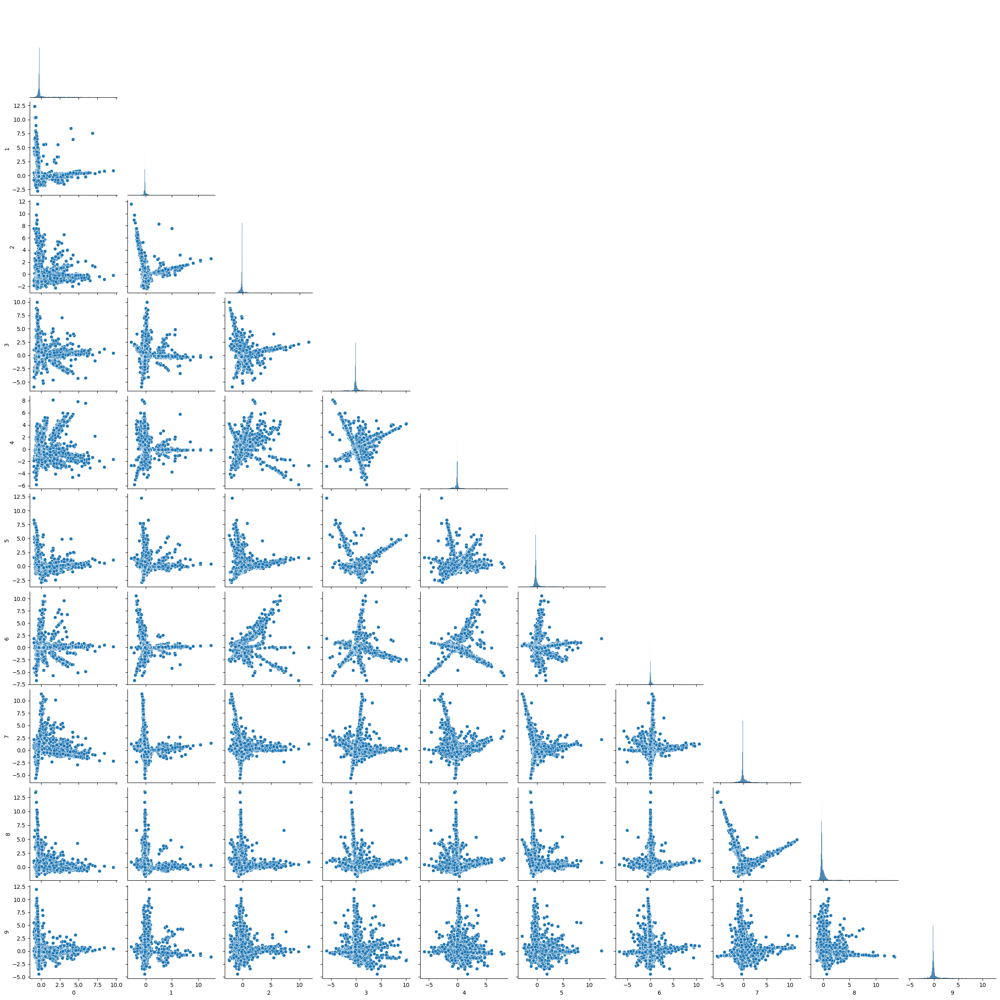

In [29]:
plt.figure(figsize=(10, 8))
sns.pairplot(X_scaled_df, corner = True)
plt.savefig('../images/Scaled_text_features_pairplot.png')

### Optimizing number of clusters

For n_clusters = 4, the inertia is : 92077.92029503627
For n_clusters = 4, the silhouette score is : 0.5466980056660827
For n_clusters = 5, the inertia is : 82355.04460484162
For n_clusters = 5, the silhouette score is : 0.5720778135995311
For n_clusters = 6, the inertia is : 71960.15787517381
For n_clusters = 6, the silhouette score is : 0.5875311372434046
For n_clusters = 7, the inertia is : 64095.64799614962
For n_clusters = 7, the silhouette score is : 0.6024140598764521
For n_clusters = 8, the inertia is : 57763.78092983437
For n_clusters = 8, the silhouette score is : 0.5752589328980914
For n_clusters = 9, the inertia is : 48342.877010002485
For n_clusters = 9, the silhouette score is : 0.6081132167905298
For n_clusters = 10, the inertia is : 41682.49494295218
For n_clusters = 10, the silhouette score is : 0.6078491801554989
For n_clusters = 11, the inertia is : 40002.47161938569
For n_clusters = 11, the silhouette score is : 0.6109613817633206
For n_clusters = 12, the inertia is

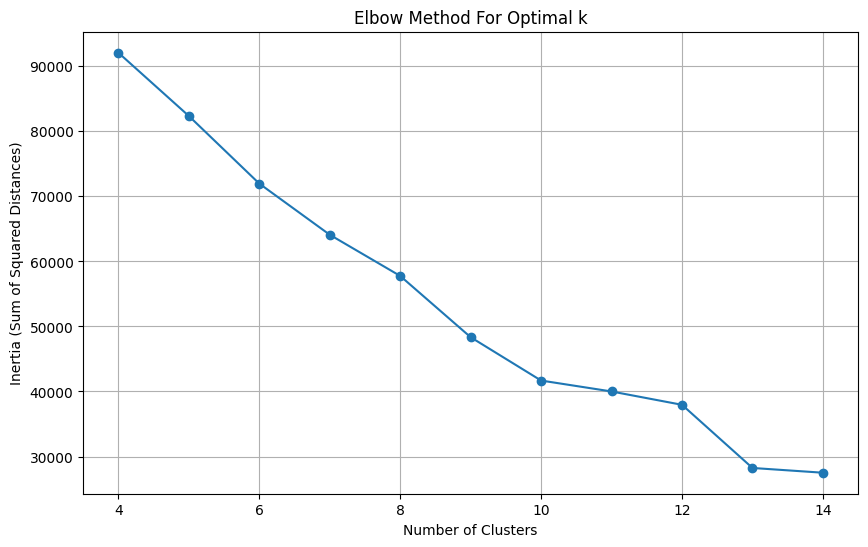

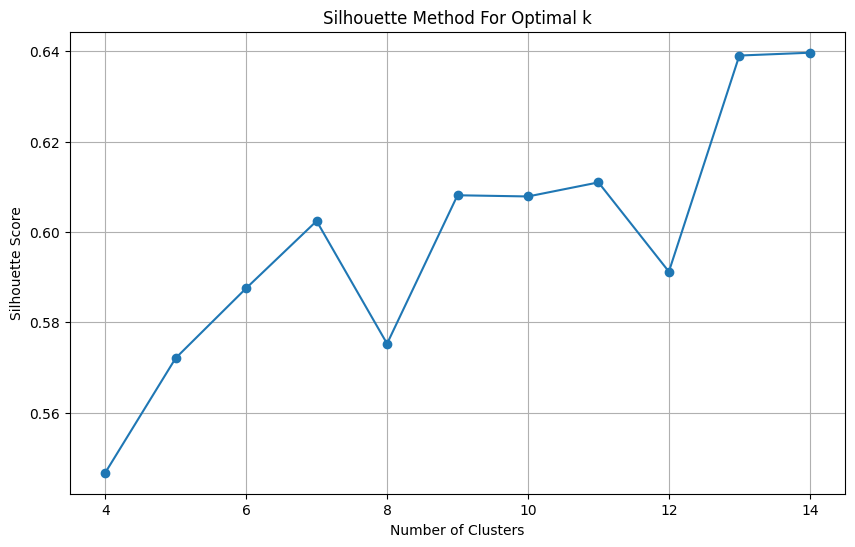

Optimal number of clusters based on the elbow method: 13
Optimal number of clusters based on the maximum drop in silhouette scores: 14


In [30]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import numpy as np

inertia_scores = []
silhouette_scores = []
range_n_clusters = range(4, 15)  # Range of clusters to try

# Compute inertia and silhouette scores for different numbers of clusters
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=1000, random_state=42)
    cluster_labels = kmeans.fit_predict(X_scaled)
    
    inertia = kmeans.inertia_
    inertia_scores.append(inertia)
    
    silhouette_avg = silhouette_score(X_scaled, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"For n_clusters = {n_clusters}, the inertia is : {inertia}")
    print(f"For n_clusters = {n_clusters}, the silhouette score is : {silhouette_avg}")

# Plotting the inertia scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, inertia_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Sum of Squared Distances)')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()

# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method For Optimal k')
plt.grid(True)
plt.show()

# Compute the second derivative of inertia scores
second_derivative = np.diff(inertia_scores, 2)

# Find the index of the maximum second derivative
elbow_point_index = np.argmax(second_derivative) + 1

# Optimal number of clusters based on the elbow method
optimal_n_clusters = range_n_clusters[elbow_point_index]

print(f"Optimal number of clusters based on the elbow method: {optimal_n_clusters}")


optimal_k_index_silhouette = np.argmax(silhouette_scores)

if optimal_k_index_silhouette == 0:
    second_next_optimal_k_index_silhouette = np.argsort(silhouette_scores)[-2]
    optimal_k_silhouette = range_n_clusters[second_next_optimal_k_index]
else:
    optimal_k_silhouette = range_n_clusters[optimal_k_index_silhouette]
    
print(f"Optimal number of clusters based on the maximum drop in silhouette scores: {optimal_k_silhouette}")


In [31]:
# Perform KMeans clustering
true_k = 11
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=1000, random_state=42)
labels = model.fit_predict(X_scaled)

# Add cluster labels to the DataFrame
X_scaled_df['cluster'] = labels

import pickle

filename = "kmeans_across_all_titles" + str(true_k) + ".pkl"
with open("../models/" + filename, "wb" ) as file:
    pickle.dump(model, file)

In [32]:
X_scaled_df

,0,1,2,3,4,5,6,7,8,9,cluster
0,3.012385,-0.172811,1.116259,-2.278939,4.039581,0.281712,-2.591159,1.237544,0.662436,-0.156921,8
1,-0.308408,-0.162428,-0.113801,-0.129870,-0.043188,-0.345211,-0.003979,-0.224185,-0.565433,-0.438253,10
2,-0.308408,-0.162428,-0.113801,-0.129870,-0.043188,-0.345211,-0.003979,-0.224185,-0.565433,-0.438253,10
3,-0.253069,-0.397592,-0.684491,0.236398,-0.816878,-1.325064,0.244676,2.975169,0.503404,-1.518476,10
4,-0.387205,-0.187788,-0.241220,-0.313819,-0.115918,-0.531505,0.013300,-0.627842,-0.031723,-1.085994,10
...,...,...,...,...,...,...,...,...,...,...,...
11943,0.327818,-0.092347,-0.246707,0.077092,-0.465569,-0.267533,0.031090,-0.414367,-0.631991,-0.131816,10
11944,2.848496,0.089786,0.163666,-0.217658,0.184582,0.209359,-0.188567,-0.714919,-0.476018,0.025375,4
11945,-0.285482,-0.161733,-0.020831,-0.077529,0.109701,-0.255540,0.162104,-0.184314,-0.398941,0.204026,10
11946,-0.316532,-0.112886,-0.108457,-0.106237,-0.085413,-0.282511,0.080585,-0.229165,-0.465653,-0.382776,10


<Figure size 1000x800 with 0 Axes>

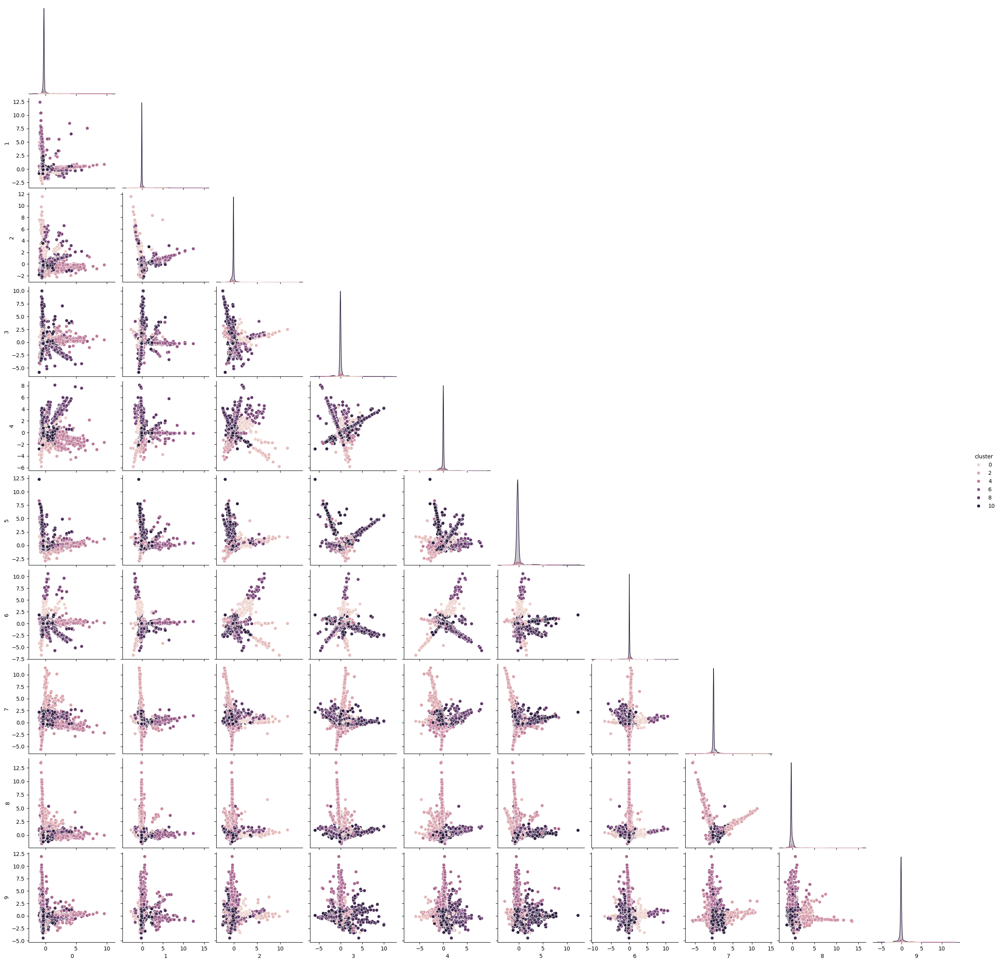

In [33]:
# Plot the pairplot with the clusters
plt.figure(figsize=(10, 8))
sns.pairplot(X_scaled_df, hue='cluster', corner=True)
plt.savefig('../images/Scaled_text_features_clusters_pairplot.png')
plt.show()

In [34]:

# Create content_cl dataframe with cleaned_title, cluster, and other part of df
contentC1 = pd.DataFrame({
    'video_id': df['video_id'],           
    'final_title': df['final_title'],
    'channelId': df['channelId'],
    'channelTitle': df['channelTitle'],
    'trending_date': df['trending_date'],
    'time_to_trend_hr': df['time_to_trend_hr'],
    'trending_duration_days': df['trending_duration_days'],
    'views': df['views'],
    'LikeRatio1': df['LikeRatio1'],
    'CommentRatio1': df['CommentRatio1'],
    'views_velocity': df['views_velocity'], 
    'comments_polarity': df['comments_polarity'], 
    'cluster': labels                    
})

In [35]:
contentC1

,video_id,final_title,channelId,channelTitle,trending_date,time_to_trend_hr,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,cluster
209,N3XbZvD3lRo,ghostemane official video,UCsyBVa0eTR-lL0sRnKpIe8w,GHOSTEMANE,2020-09-01 00:00:00+00:00,8.01,5.0,1295131,118.99,7.02,2.158552e+05,0.24,8
210,3AiDa3ZD20Y,rocky answer question rihanna,UCsEukrAd64fqA7FjwkmZ_Dw,GQ,2020-09-01 00:00:00+00:00,8.00,5.0,3972340,53.79,2.57,6.620567e+05,0.22,10
211,EpGCCKB3Oag,rihanna answer question rocky,UCRXiA3h1no_PFkb1JCP0yMA,Vogue,2020-09-01 00:00:00+00:00,8.00,5.0,2712156,55.36,2.08,4.520260e+05,0.33,10
216,8gXQsAea26I,tenet movie review,UCCqEeDAUf4Mg0GgEN658tkA,Chris Stuckmann,2020-09-01 00:00:00+00:00,11.00,4.0,808443,49.90,6.86,1.616886e+05,0.12,10
217,HDduzIB8HjU,joseph gordon levitt cocky eat spicy wing hot,UCPD_bxCRGpmmeQcbe2kpPaA,First We Feast,2020-09-02 00:00:00+00:00,9.00,5.0,2572270,33.69,3.40,4.287117e+05,0.29,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12232,F78Wat58Cec,babymonster teaser chiquita,UCqwUnggBBct-AY2lAdI88jQ,BABYMONSTER,2024-03-30 00:00:00+00:00,9.00,7.0,8493952,35.12,1.10,1.061744e+06,0.32,10
12233,DQghiGQi6Lo,penguin official teaser,UCx-KWLTKlB83hDI6UKECtJQ,Max,2024-03-31 00:00:00+00:00,8.99,8.0,3004457,33.64,1.47,3.338286e+05,0.42,4
12234,DBfpm5FrsHI,big precision,UCYFyHJMMKd7C8M0_TsleUQA,Big Sean,2024-03-31 00:00:00+00:00,32.00,7.0,829147,62.00,4.25,9.212744e+04,0.04,10
12235,063FqEfBTns,lando norris chicken shop date,UCyQ-DUV6lZgoL8wiPusYiUg,Amelia Dimoldenberg,2024-03-31 00:00:00+00:00,7.00,8.0,1961401,60.14,1.01,2.179334e+05,0.14,10


In [36]:
# Aggregate over 'cluster' to find mean and std
agg_result = contentC1.groupby('cluster').agg({
    'views': ['mean', 'std'],
    'LikeRatio1': ['mean', 'std'],
    'CommentRatio1': ['mean', 'std'],
    'trending_duration_days': ['mean', 'std'],
    'views_velocity': ['mean', 'std'],
    'comments_polarity': ['mean', 'std'],
    'video_id': 'count'
}).reset_index()

agg_result = agg_result.round(2)
agg_result.sort_values(by=('video_id', 'count'), ascending=False)


cluster       views              LikeRatio1        CommentRatio1        \
                  mean          std       mean    std          mean   std   
10      10  2831914.70   8343663.87      52.99  31.88          3.55  3.87   
4        4  6234154.98   7726843.89      29.69  32.81          2.13  2.80   
5        5  3080782.26   9591203.60      42.76  27.21          2.80  3.32   
3        3  2310957.72   5066050.98      51.99  25.01          2.82  2.60   
8        8  2962942.00   7673026.83      64.07  37.60          4.52  5.87   
6        6  5013437.37  17502234.08      51.75  27.34          3.38  3.60   
9        9  2784248.01   9210754.80      54.52  26.97          4.66  4.89   
0        0  1031786.41   1165986.03      47.41  24.18          4.61  5.33   
2        2  1531614.30   4030627.99      37.90  13.09          4.47  2.75   
1        1   876982.10    788933.91      66.02  25.34          7.43  7.10   
7        7   788395.29    770912.58      57.24  26.33          5.72  5.03   

   trending_duration_days       views_velocity             comments_polarity  \
                     mean   std           mean         std              mean   
10                   4.84  2.17      400729.18   843805.17              0.19   
4                    5.27  2.19      875349.17   901936.98              0.20   
5                    5.00  1.99      403390.33   956864.95              0.19   
3                    4.80  1.33      345790.38   608241.62              0.19   
8                    4.94  1.55      430121.68   893271.85              0.15   
6                    4.90  3.63      617656.80  1014095.35              0.21   
9                    5.02  2.51      326999.24   472246.43              0.23   
0                    4.63  1.44      164176.32   170206.28              0.28   
2                    4.42  1.30      266609.91   728413.59              0.15   
1                    4.90  1.55      142439.84   123782.81              0.32   
7                    4.42  1.17      130024.31   117446.53              0.40   

         video_id  
     std    count  
10  0.13     8933  
4   0.12      619  
5   0.13      524  
3   0.12      403  
8   0.14      390  
6   0.14      286  
9   0.13      255  
0   0.14      219  
2   0.11      161  
1   0.13       96  
7   0.14       62

### Leading Contents

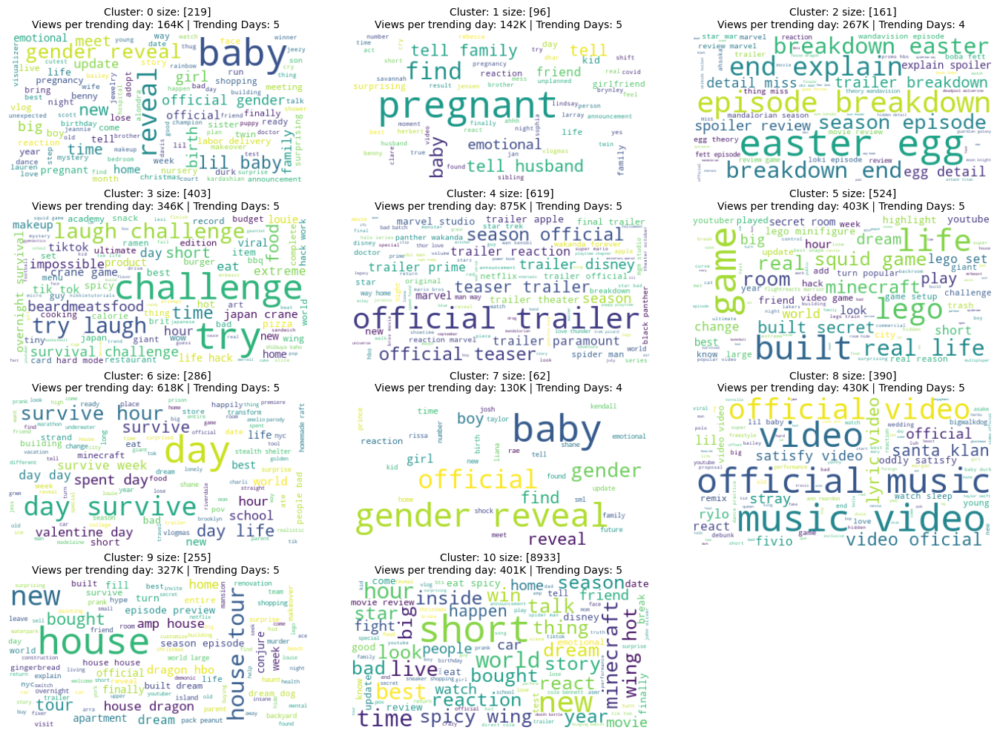

In [40]:
# Determine number of rows and columns dynamically
num_rows = (true_k - 1) // 3 + 1  # 3 columns per row
num_cols = min(true_k, 3)

# Create subplots
plt.figure(figsize=(14, 10))
for k in range(true_k):
    text = contentC1[contentC1.cluster == k]['final_title'].str.cat(sep=' ')
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)

    # Create subplot
    ax = plt.subplot(num_rows, num_cols, k + 1)
    ax.set_title("Cluster " + str(k))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")

    # Annotate with mean and std
    count = agg_result.loc[agg_result['cluster'] == k, 'video_id'].values[0]
    mean_views_vel = (agg_result.loc[agg_result['cluster'] == k, 'views_velocity'].values[0][0] / 10**3).round(0)
    std_views_vel = (agg_result.loc[agg_result['cluster'] == k, 'views_velocity'].values[0][1] / 10**3).round(0)
    mean_trending_days = (agg_result.loc[agg_result['cluster'] == k, 'trending_duration_days'].values[0][0]).round(0)
    std_trending_days = (agg_result.loc[agg_result['cluster'] == k, 'trending_duration_days'].values[0][1]).round(0)

    stats_text = f"Views per trending day: {mean_views_vel:.0f}K | Trending Days: {mean_trending_days:.0f} "
    ax.set_title("Cluster: " + str(k) + " size: " + str(count) + "\n" + stats_text, fontsize=10)

plt.tight_layout()

plt.savefig('../images/textual_clustering_leading_topics.png')

plt.show()

## DBSCAN

In [38]:
from sklearn.cluster import DBSCAN

# Perform DBSCAN clustering
dbscan_model = DBSCAN(eps=0.5, min_samples=20)  # Adjust parameters as needed
labels = dbscan_model.fit_predict(X_scaled)

# Add cluster labels to the DataFrame
X_scaled_df['cluster'] = labels



<Figure size 1000x800 with 0 Axes>

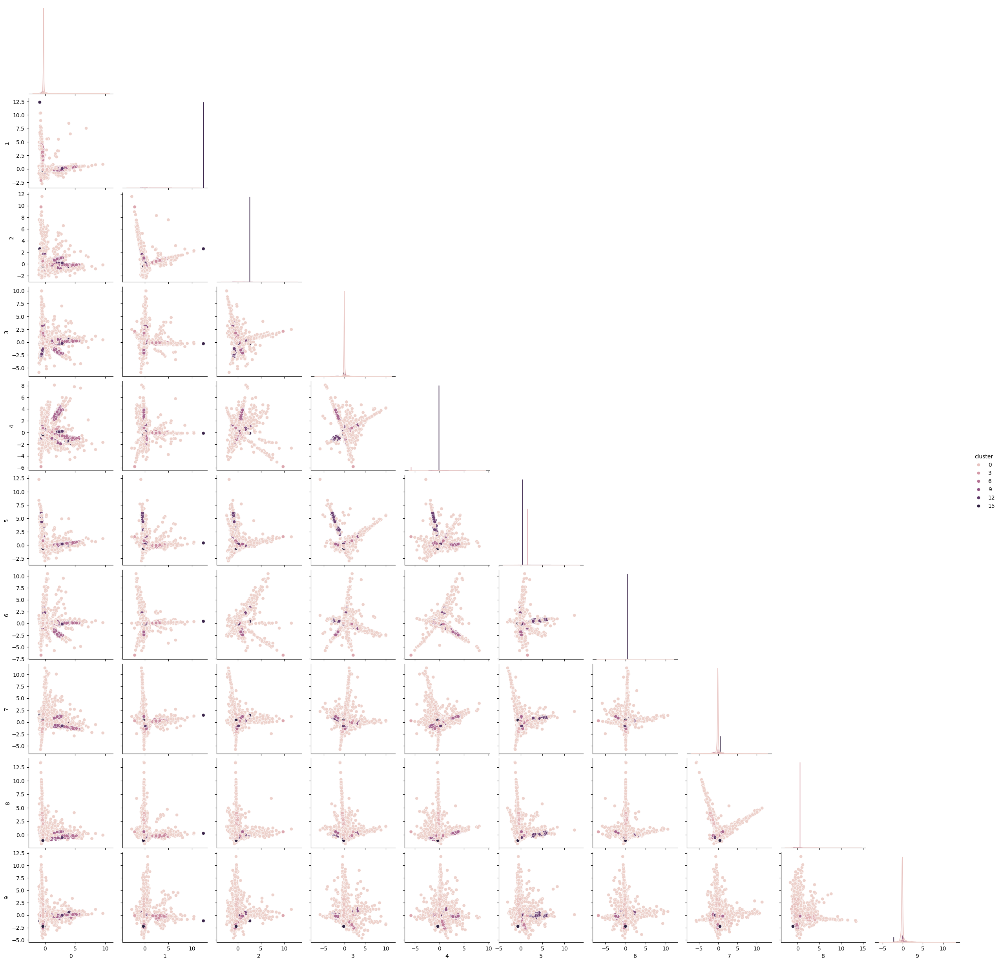

In [39]:
# Plot the pairplot with the clusters
plt.figure(figsize=(10, 8))
sns.pairplot(X_scaled_df, hue='cluster', corner=True)
plt.show()

In [40]:

# Create content_cl dataframe with cleaned_title, cluster, and other part of df
contentC1 = pd.DataFrame({
    'video_id': df['video_id'],           
    'final_title': df['final_title'],
    'channelId': df['channelId'],
    'channelTitle': df['channelTitle'],
    'trending_date': df['trending_date'],
    'time_to_trend_hr': df['time_to_trend_hr'],
    'trending_duration_days': df['trending_duration_days'],
    'views': df['views'],
    'LikeRatio1': df['LikeRatio1'],
    'CommentRatio1': df['CommentRatio1'],
    'views_velocity': df['views_velocity'], 
    'comments_polarity': df['comments_polarity'], 
    'cluster': labels                    
})

# Aggregate over 'cluster' to find mean and std
agg_result = contentC1.groupby('cluster').agg({
    'views': ['mean', 'std'],
    'LikeRatio1': ['mean', 'std'],
    'CommentRatio1': ['mean', 'std'],
    'trending_duration_days': ['mean', 'std'],
    'views_velocity': ['mean', 'std'],
    'comments_polarity': ['mean', 'std'],
    'video_id': 'count'
}).reset_index()

agg_result = agg_result.round(2)
agg_result.sort_values(by=('video_id', 'count'), ascending=False)


cluster        views              LikeRatio1        CommentRatio1        \
                   mean          std       mean    std          mean   std   
1        0   2573511.59   7433490.09      52.70  32.10          3.66  3.94   
0       -1   3247783.69   9614520.86      48.90  29.30          3.77  4.52   
12      11   6847091.08  18222944.02      64.89  29.49          0.87  1.10   
7        6   7536739.64   7865536.84      19.79  23.06          1.28  1.58   
2        1   1878167.33   2274155.44      49.73  23.85          3.04  2.91   
6        5   1140546.33   1172313.27      49.40  28.88          3.75  3.49   
5        4   3327507.03  14223127.28      53.94  33.02          3.16  2.90   
8        7   2416517.65   7273284.60      59.60  31.41          4.16  4.12   
9        8   3030998.80   4407708.92      44.45  41.66          3.55  3.62   
10       9   2298314.04   4076376.30      52.72  24.27          3.77  3.28   
11      10    930801.09    886963.27      42.75  19.93          3.52  3.33   
4        3   4215048.87  10338281.45      58.80  43.45          3.97  3.60   
3        2    834145.83    814752.10      75.16  26.36          9.52  8.75   
16      15  36614117.91  12789749.81      33.73   4.91          2.95  1.17   
15      14   5138632.07    566449.30      50.34   3.58          4.11  1.37   
14      13   3663014.33   2783554.92      15.08  16.81          1.09  1.35   
13      12   3777209.38   4667483.08      38.71  39.36          2.98  3.17   

   trending_duration_days       views_velocity             comments_polarity  \
                     mean   std           mean         std              mean   
1                    4.88  2.13      363716.75   706984.72              0.19   
0                    4.86  2.18      428521.83   859781.24              0.21   
12                   3.98  2.34      963380.38  1781891.64              0.12   
7                    5.23  1.59     1100181.63  1030309.92              0.21   
2                    4.91  1.22      286701.11   368204.42              0.20   
6                    4.80  1.53      177515.33   164967.68              0.22   
5                    4.99  2.93      364529.16   964357.85              0.22   
8                    4.99  1.70      356243.27   945246.56              0.14   
9                    4.73  1.58      508090.77   752126.58              0.17   
10                   4.82  1.66      296792.29   373951.14              0.20   
11                   4.32  1.18      150799.45   118723.22              0.25   
4                    5.16  4.37      590410.88  1432695.46              0.20   
3                    4.86  1.72      143409.51   134549.12              0.33   
16                   7.39  5.74     4876841.79  1813387.43              0.17   
15                   2.32  0.86     1604247.01   284186.52              0.23   
14                   5.22  1.63      556787.80   398295.28              0.22   
13                   5.23  1.45      550697.24   578105.35              0.21   

         video_id  
     std    count  
1   0.13     8348  
0   0.14     1859  
12  0.12      319  
7   0.11      273  
2   0.11      248  
6   0.13      172  
5   0.13      156  
8   0.12      153  
9   0.12       88  
10  0.12       71  
11  0.15       57  
4   0.15       55  
3   0.13       35  
16  0.09       33  
15  0.11       28  
14  0.12       27  
13  0.12       26

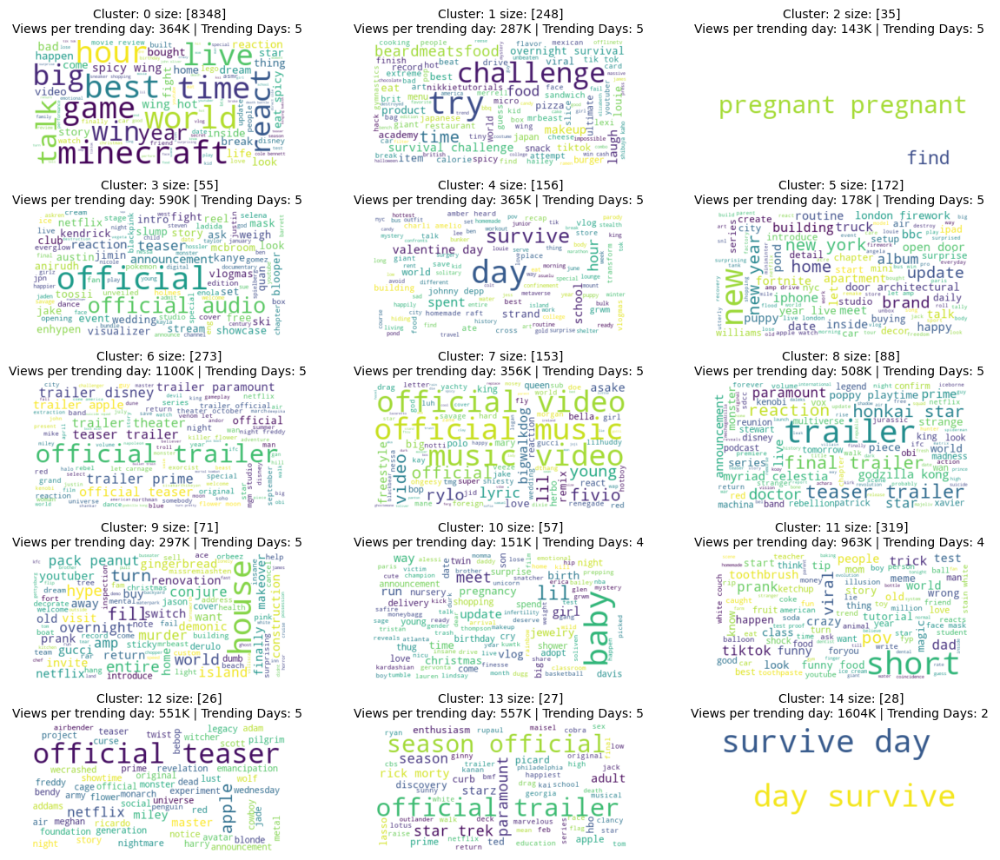

In [41]:
# Determine number of rows and columns dynamically
true_k = agg_result['cluster'].max()

if true_k <= 15:
    num_rows = (true_k - 1) // 3 + 1  # 3 columns per row
    num_cols = min(true_k, 3)
    
    # Create subplots
    plt.figure(figsize=(12, 10))
    for k in range(true_k):
        text = contentC1[contentC1.cluster == k]['final_title'].str.cat(sep=' ')
        wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
    
        # Create subplot
        ax = plt.subplot(num_rows, num_cols, k + 1)
        ax.set_title("Cluster " + str(k))
        plt.imshow(wordcloud, interpolation="bilinear")
        plt.axis("off")
    
        # Annotate with mean and std
        count = agg_result.loc[agg_result['cluster'] == k, 'video_id'].values[0]
        mean_views_vel = (agg_result.loc[agg_result['cluster'] == k, 'views_velocity'].values[0][0] / 10**3).round(0)
        std_views_vel = (agg_result.loc[agg_result['cluster'] == k, 'views_velocity'].values[0][1] / 10**3).round(0)
        mean_trending_days = (agg_result.loc[agg_result['cluster'] == k, 'trending_duration_days'].values[0][0]).round(0)
        std_trending_days = (agg_result.loc[agg_result['cluster'] == k, 'trending_duration_days'].values[0][1]).round(0)
    
        stats_text = f"Views per trending day: {mean_views_vel:.0f}K | Trending Days: {mean_trending_days:.0f} "
        ax.set_title("Cluster: " + str(k) + " size: " + str(count) + "\n" + stats_text, fontsize=10)
    
    plt.tight_layout()
    plt.show()

# Temporal - Textual Clustering

Aggregate Content over monthly Intervals

In [41]:
# Convert trending_date to datetime format
df['trending_date'] = pd.to_datetime(df['trending_date'])

# Extract month and year from trending_date
df['month_year'] = df['trending_date'].dt.to_period('M')

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\2534898922.py:5: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  df['month_year'] = df['trending_date'].dt.to_period('M')


In [42]:
def find_optimal_k(X, month):

    silhouette_scores = []
    range_n_clusters = range(4, 15)
    
    for n_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=1000, random_state=42)
        cluster_labels = kmeans.fit_predict(X)
        
        silhouette_avg = silhouette_score(X, cluster_labels)
        silhouette_scores.append(silhouette_avg)
        
    # Plotting the silhouette scores
    plt.figure(figsize=(5, 3))
    plt.plot(range_n_clusters, silhouette_scores, marker='o')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Method For Optimal k')
    plt.grid(True)
    plt.show()

    optimal_k_index = np.argmax(silhouette_scores)
    
    if optimal_k_index == 0:
        second_next_optimal_k_index = np.argsort(silhouette_scores)[-2]
        optimal_k = range_n_clusters[second_next_optimal_k_index]
    else:
        optimal_k = range_n_clusters[optimal_k_index]
    
    print(f"Optimal number of clusters based on silhouette scores: {optimal_k}")

    return optimal_k

# Function to apply clustering to a single monthly subset
def cluster_monthly_data(monthly_df, month):
    # Apply TF-IDF vectorization
    vectorizer = TfidfVectorizer(stop_words='english', ngram_range=(1,2))
    X = vectorizer.fit_transform(monthly_df['final_title'])

    # Reduce Dimensions
   # Tfidf_features = X.toarray().shape[1] 
   # components = int(Tfidf_features/150)
   # print (f"Reduced dimensions with PCA: from {Tfidf_features} to {components}")
   # pca = PCA(n_components=components)  # ~ 1000 times dimension reductions
   # X_reduced = pca.fit_transform(X.toarray())

    # scaling features
    X_df=pd.DataFrame(X.toarray())
    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(X_df)
    X_scaled = scaled_features

    
    # Determine optimal number of clusters using the elbow method
    optimal_k = find_optimal_k(X_scaled, month)
    
    # Perform KMeans clustering with the optimal number of clusters
    model = KMeans(n_clusters=optimal_k, init='k-means++', max_iter=1000, random_state=42)
    model.fit(X_scaled)
    
    filename = f"kmeans_{month}_k{optimal_k}.pkl"
    with open(f"../models/{filename}", "wb") as file:
        pickle.dump(model, file)
        
    # Get prediction/ labels
    labels = model.labels_
    
    # Create content_cl dataframe with cleaned_title, cluster, and other part of monthly_df
    contentC1 = monthly_df.copy()
    contentC1['cluster'] = labels


    # Aggregate over 'cluster' to find mean and std
    agg_result = contentC1.groupby('cluster').agg({
        'views': ['mean', 'std'],
        'LikeRatio1': ['mean', 'std'],
        'CommentRatio1': ['mean', 'std'],
        'trending_duration_days': ['mean', 'std'],
        'views_velocity': ['mean', 'std'],
        'comments_polarity': ['mean', 'std'],
        'video_id': 'count'
    }).reset_index()
        
    agg_result = agg_result.round(2)

    
    return contentC1, agg_result

Processing period: 2020-09


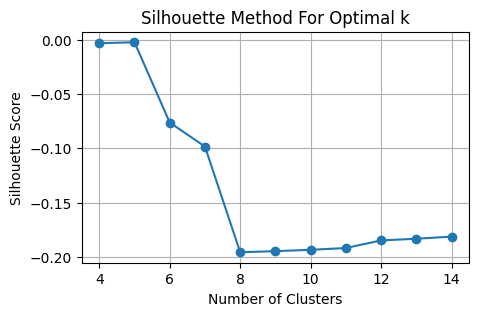

Optimal number of clusters based on silhouette scores: 5
Processing period: 2020-10


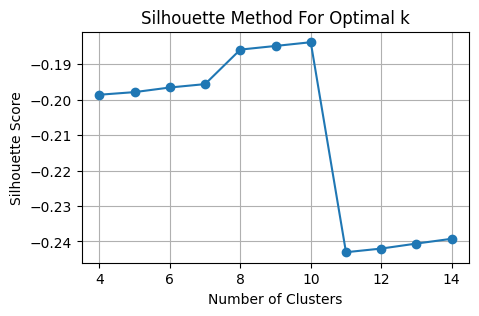

Optimal number of clusters based on silhouette scores: 10
Processing period: 2020-11


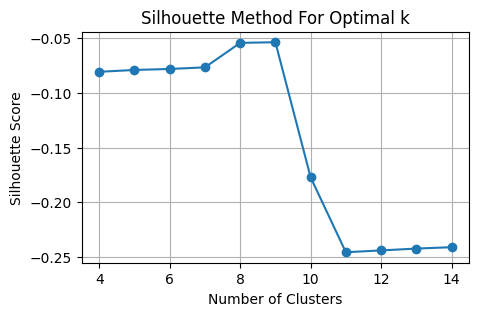

Optimal number of clusters based on silhouette scores: 9
Processing period: 2020-12


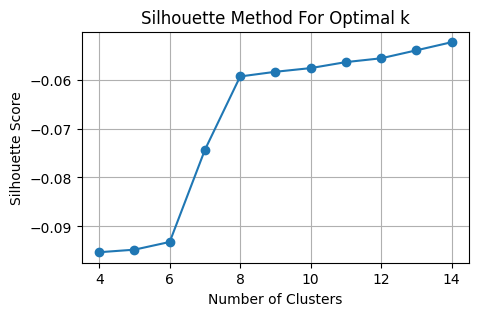

Optimal number of clusters based on silhouette scores: 14
Processing period: 2021-01


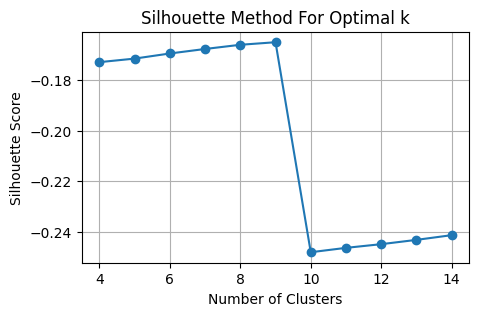

Optimal number of clusters based on silhouette scores: 9
Processing period: 2021-02


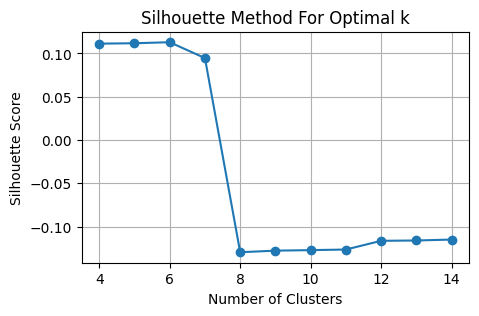

Optimal number of clusters based on silhouette scores: 6
Processing period: 2021-03


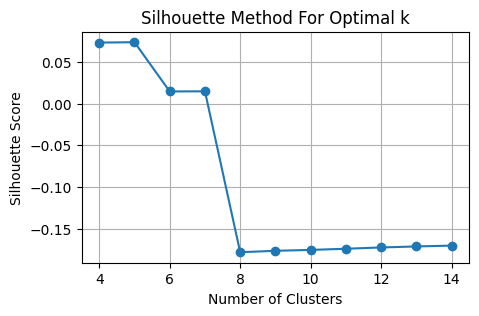

Optimal number of clusters based on silhouette scores: 5
Processing period: 2021-04


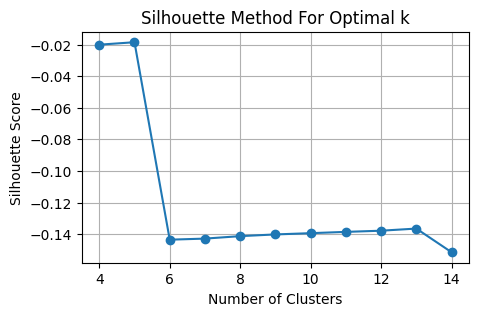

Optimal number of clusters based on silhouette scores: 5
Processing period: 2021-05


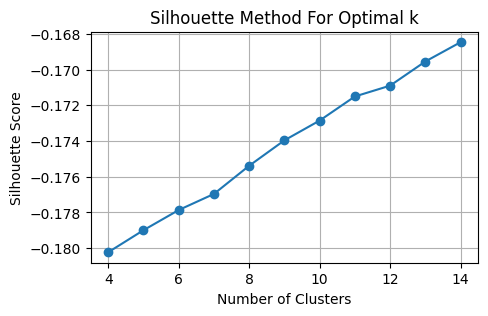

Optimal number of clusters based on silhouette scores: 14
Processing period: 2021-06


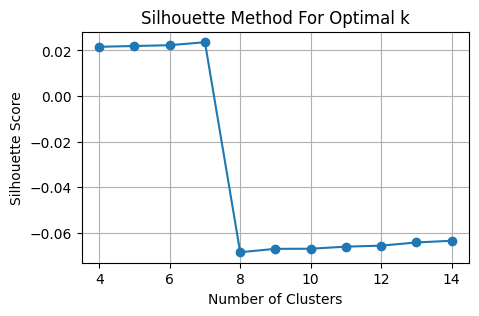

Optimal number of clusters based on silhouette scores: 7
Processing period: 2021-07


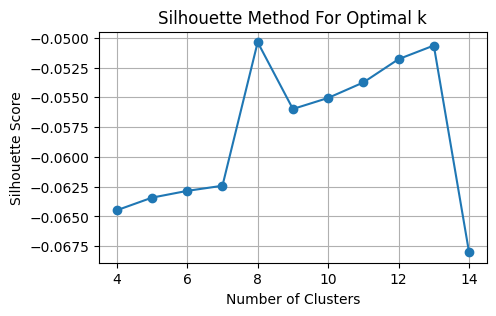

Optimal number of clusters based on silhouette scores: 8
Processing period: 2021-08


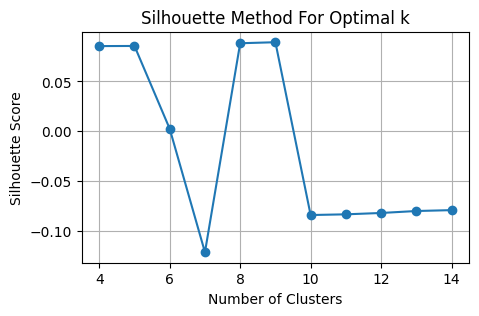

Optimal number of clusters based on silhouette scores: 9
Processing period: 2021-09


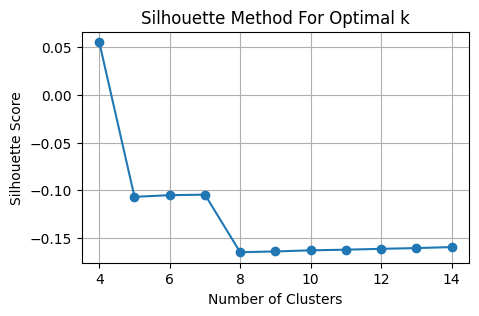

Optimal number of clusters based on silhouette scores: 7
Processing period: 2021-10


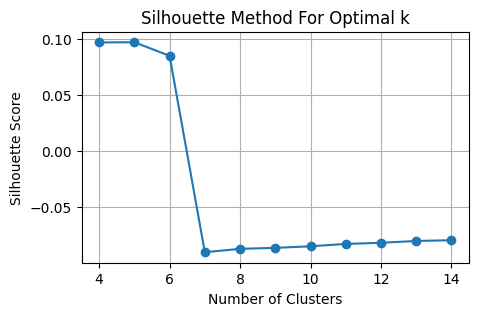

Optimal number of clusters based on silhouette scores: 5
Processing period: 2021-11


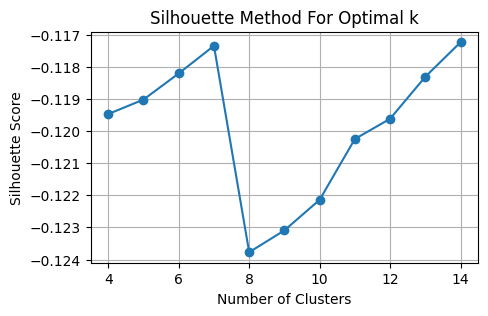

Optimal number of clusters based on silhouette scores: 14
Processing period: 2021-12


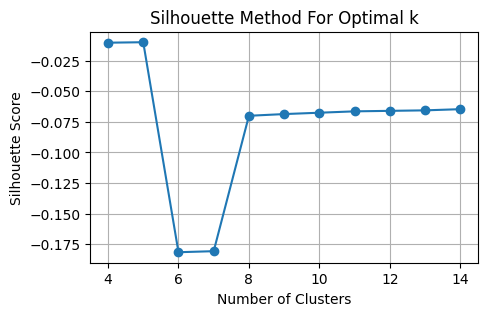

Optimal number of clusters based on silhouette scores: 5
Processing period: 2022-01


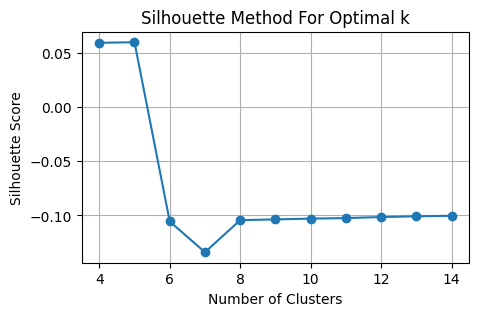

Optimal number of clusters based on silhouette scores: 5
Processing period: 2022-02


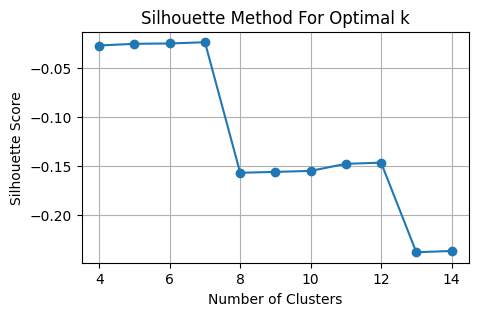

Optimal number of clusters based on silhouette scores: 7
Processing period: 2022-03


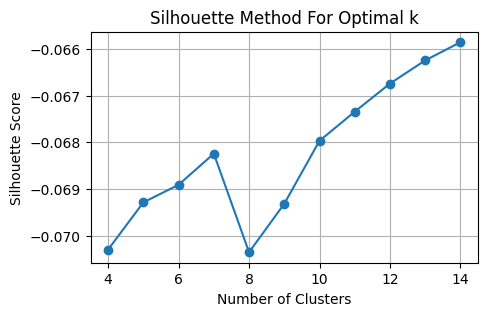

Optimal number of clusters based on silhouette scores: 14
Processing period: 2022-04


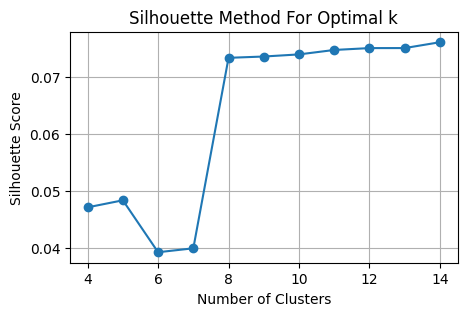

Optimal number of clusters based on silhouette scores: 14
Processing period: 2022-05


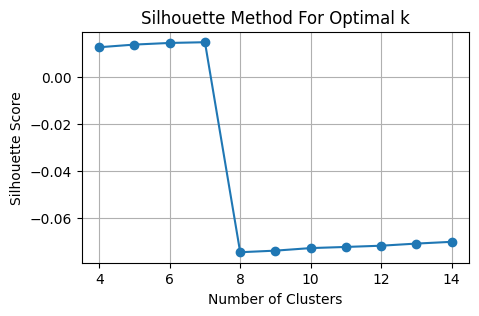

Optimal number of clusters based on silhouette scores: 7
Processing period: 2022-06


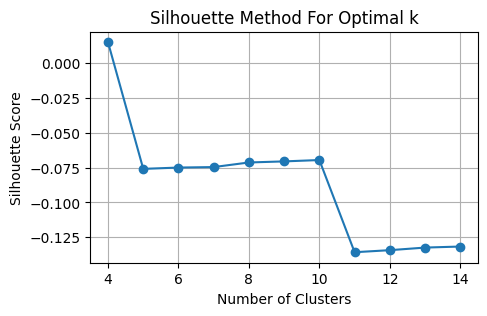

Optimal number of clusters based on silhouette scores: 10
Processing period: 2022-07


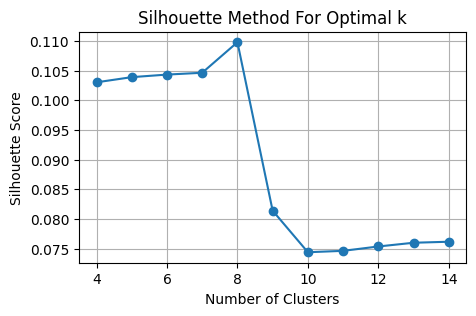

Optimal number of clusters based on silhouette scores: 8
Processing period: 2022-08


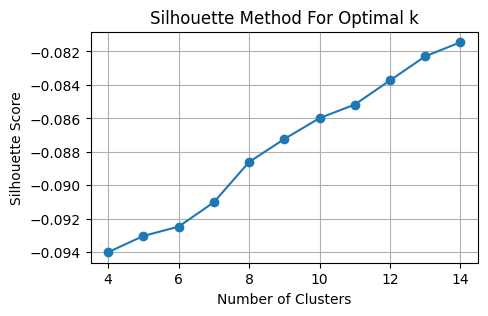

Optimal number of clusters based on silhouette scores: 14
Processing period: 2022-09


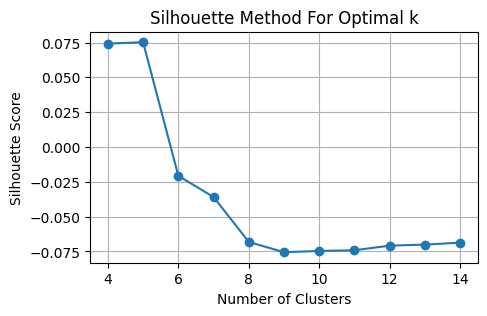

Optimal number of clusters based on silhouette scores: 5
Processing period: 2022-10


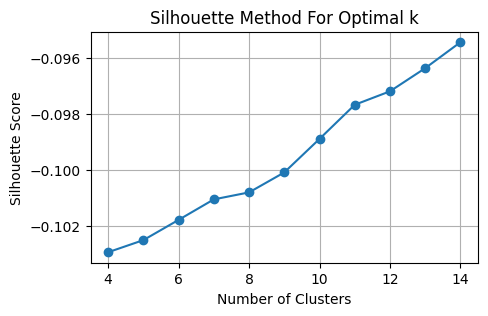

Optimal number of clusters based on silhouette scores: 14
Processing period: 2022-11


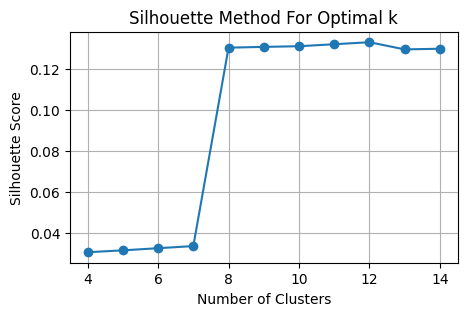

Optimal number of clusters based on silhouette scores: 12
Processing period: 2022-12


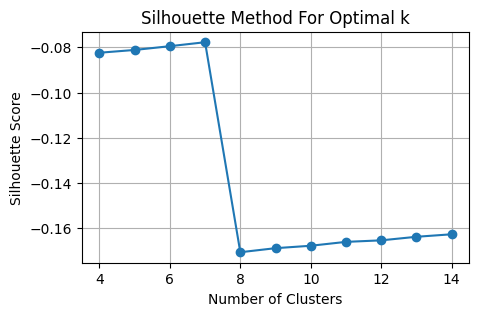

Optimal number of clusters based on silhouette scores: 7
Processing period: 2023-01


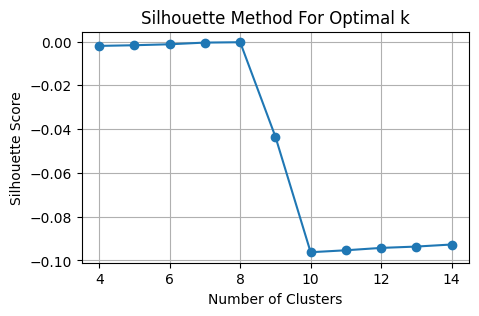

Optimal number of clusters based on silhouette scores: 8
Processing period: 2023-02


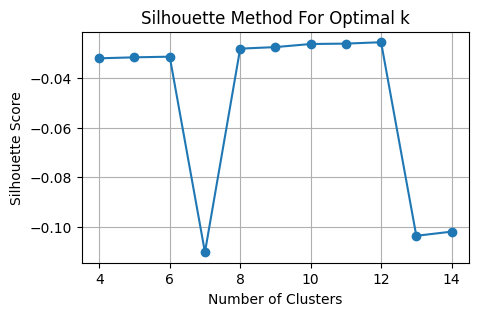

Optimal number of clusters based on silhouette scores: 12
Processing period: 2023-03


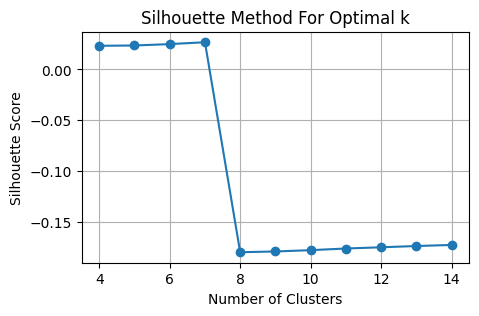

Optimal number of clusters based on silhouette scores: 7
Processing period: 2023-04


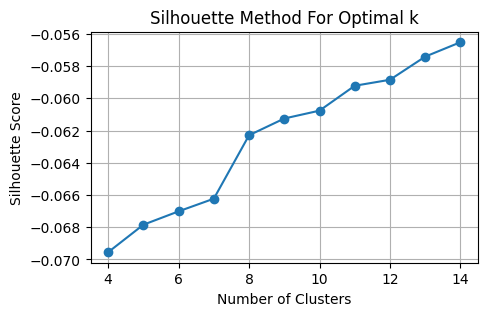

Optimal number of clusters based on silhouette scores: 14
Processing period: 2023-05


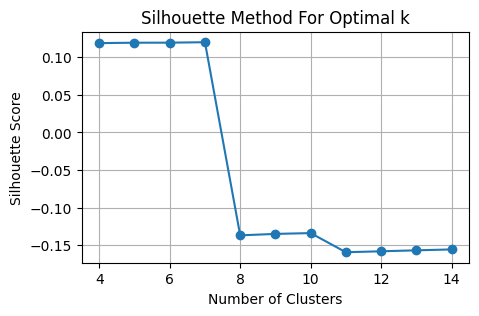

Optimal number of clusters based on silhouette scores: 7
Processing period: 2023-06


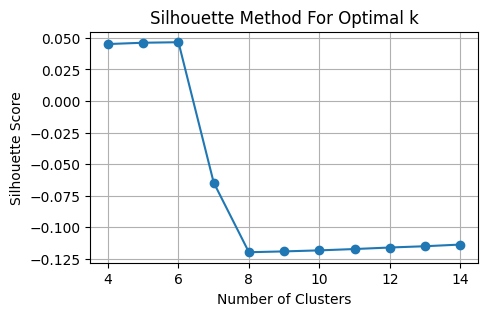

Optimal number of clusters based on silhouette scores: 6
Processing period: 2023-07


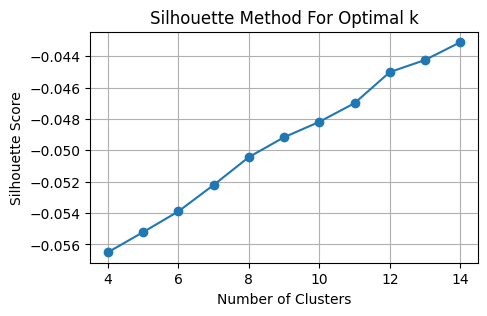

Optimal number of clusters based on silhouette scores: 14
Processing period: 2023-08


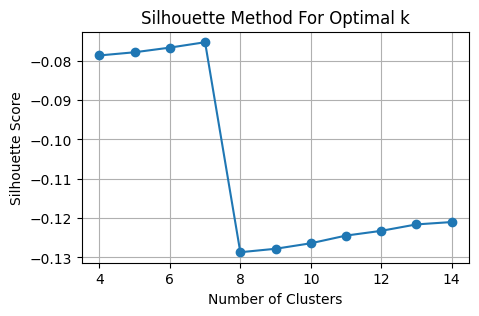

Optimal number of clusters based on silhouette scores: 7
Processing period: 2023-09


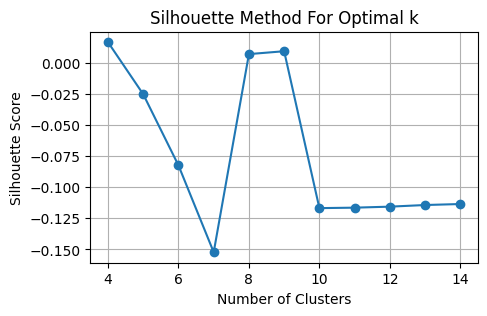

Optimal number of clusters based on silhouette scores: 9
Processing period: 2023-10


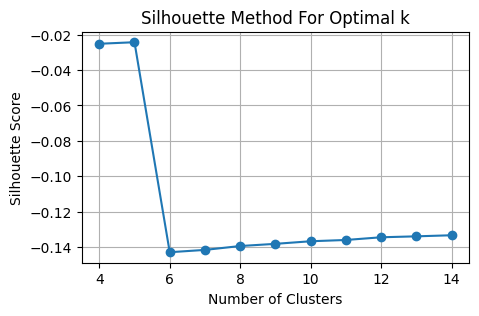

Optimal number of clusters based on silhouette scores: 5
Processing period: 2023-11


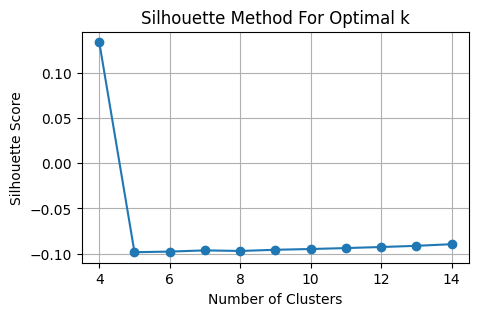

Optimal number of clusters based on silhouette scores: 14
Processing period: 2023-12


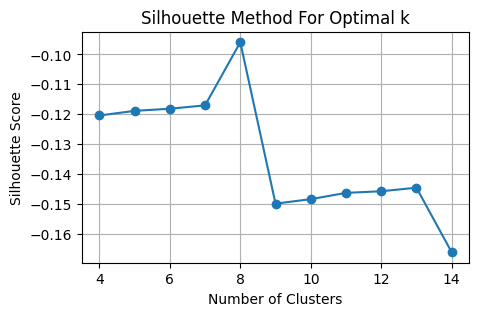

Optimal number of clusters based on silhouette scores: 8
Processing period: 2024-01


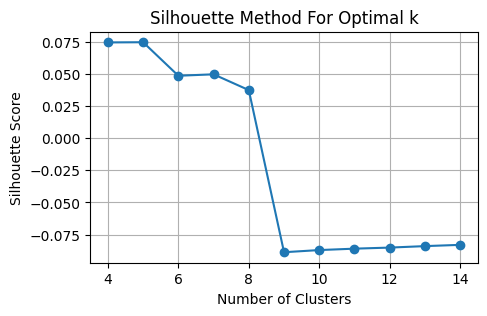

Optimal number of clusters based on silhouette scores: 5
Processing period: 2024-02


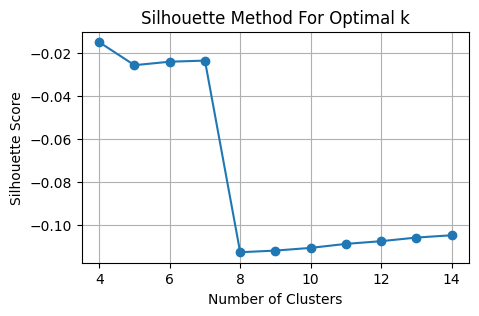

Optimal number of clusters based on silhouette scores: 7
Processing period: 2024-03


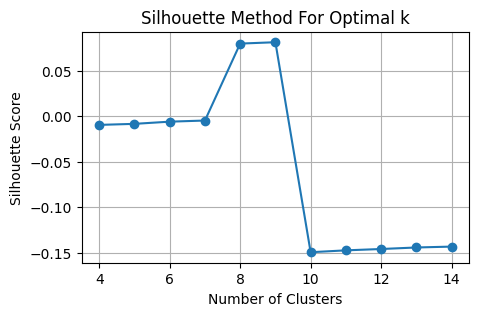

Optimal number of clusters based on silhouette scores: 9


In [43]:
# Group data by month and apply clustering
monthly_agg_results = []
all_contentC1 = []

for period, monthly_df in df.groupby('month_year'):
    print(f"Processing period: {period}")
    
    # Call the clustering function with the monthly data and period (month_year)
    contentC1, agg_result = cluster_monthly_data(monthly_df, period)  # Pass the period to the function
    
    # Append results as a dictionary
    monthly_agg_results.append({
        'month_year': period,
        'agg_result': agg_result
    })
    
    # Accumulate all contentC1 DataFrames
    all_contentC1.append(contentC1)

# Concatenate all the results
final_agg_results = pd.concat([result['agg_result'].assign(month_year=result['month_year']) for result in monthly_agg_results], ignore_index=True)

# Concatenate all the contentC1 DataFrames
final_contentC1 = pd.concat(all_contentC1, ignore_index=True)

# Sort results by month and cluster count
final_agg_results.sort_values(by=['month_year', ('video_id', 'count')], ascending=[True, False], inplace=True)

# Optionally, you can also sort final_contentC1 if needed
# final_contentC1.sort_values(by='month_year', ascending=True, inplace=True)

In [44]:
final_agg_results

cluster       views             LikeRatio1        CommentRatio1        \
                   mean         std       mean    std          mean   std   
1         1  2581625.87  3874390.61      60.49  38.84          5.50  4.47   
0         0  2147626.45  3649481.93      52.13  23.46          5.58  2.91   
2         2   276268.00         NaN      29.92    NaN          4.76   NaN   
3         3   686474.00         NaN      61.52    NaN          4.43   NaN   
4         4   738537.00         NaN      16.80    NaN          1.03   NaN   
..      ...         ...         ...        ...    ...           ...   ...   
376       4   655584.00         NaN      15.48    NaN          2.55   NaN   
377       5   834632.00         NaN      43.95    NaN          1.69   NaN   
378       6   477603.00         NaN      16.13    NaN          0.81   NaN   
379       7   620972.00         NaN      23.70    NaN          2.24   NaN   
380       8   969096.00         NaN      33.08    NaN          0.81   NaN   

    trending_duration_days       views_velocity            comments_polarity  \
                      mean   std           mean        std              mean   
1                     4.50  1.21      432112.85  598542.18              0.15   
0                     4.35  0.93      355024.07  534152.08              0.15   
2                     4.00   NaN       46044.67        NaN              0.23   
3                     2.00   NaN      137294.80        NaN              0.26   
4                     3.00   NaN      147707.40        NaN              0.26   
..                     ...   ...            ...        ...               ...   
376                   7.00   NaN       81948.00        NaN              0.06   
377                   8.00   NaN       92736.89        NaN              0.35   
378                   4.00   NaN       79600.50        NaN              0.27   
379                   7.00   NaN       68996.89        NaN              0.29   
380                   7.00   NaN      121137.00        NaN              0.11   

          video_id month_year  
      std    count             
1    0.13      222    2020-09  
0    0.09       20    2020-09  
2     NaN        1    2020-09  
3     NaN        1    2020-09  
4     NaN        1    2020-09  
..    ...      ...        ...  
376   NaN        1    2024-03  
377   NaN        1    2024-03  
378   NaN        1    2024-03  
379   NaN        1    2024-03  
380   NaN        1    2024-03  

[381 rows x 15 columns]

In [45]:
final_contentC1

,video_id,channelId,channelTitle,trending_date,time_to_trend_hr,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,final_title,cleaned_description,month_year,cluster
0,N3XbZvD3lRo,UCsyBVa0eTR-lL0sRnKpIe8w,GHOSTEMANE,2020-09-01 00:00:00+00:00,8.01,5.0,1295131,118.99,7.02,2.158552e+05,0.24,ghostemane official video,GHOSTEMANE AI OFFICIAL VIDEO a Studio Linguini...,2020-09,1
1,3AiDa3ZD20Y,UCsEukrAd64fqA7FjwkmZ_Dw,GQ,2020-09-01 00:00:00+00:00,8.00,5.0,3972340,53.79,2.57,6.620567e+05,0.22,rocky answer question rihanna,Watch Rihanna answer questions from AAP Rocky ...,2020-09,1
2,EpGCCKB3Oag,UCRXiA3h1no_PFkb1JCP0yMA,Vogue,2020-09-01 00:00:00+00:00,8.00,5.0,2712156,55.36,2.08,4.520260e+05,0.33,rihanna answer question rocky,Watch AAP Rocky answer questions from Rihanna ...,2020-09,1
3,8gXQsAea26I,UCCqEeDAUf4Mg0GgEN658tkA,Chris Stuckmann,2020-09-01 00:00:00+00:00,11.00,4.0,808443,49.90,6.86,1.616886e+05,0.12,tenet movie review,Chris Stuckmann reviews Tenet starring John Da...,2020-09,0
4,HDduzIB8HjU,UCPD_bxCRGpmmeQcbe2kpPaA,First We Feast,2020-09-02 00:00:00+00:00,9.00,5.0,2572270,33.69,3.40,4.287117e+05,0.29,joseph gordon levitt cocky eat spicy wing hot,Joseph is an actor director and producer from ...,2020-09,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11943,F78Wat58Cec,UCqwUnggBBct-AY2lAdI88jQ,BABYMONSTER,2024-03-30 00:00:00+00:00,9.00,7.0,8493952,35.12,1.10,1.061744e+06,0.32,babymonster teaser chiquita,BABYMONSER Title SHEESH MVTEASER CHIQUITA AM,2024-03,1
11944,DQghiGQi6Lo,UCx-KWLTKlB83hDI6UKECtJQ,Max,2024-03-31 00:00:00+00:00,8.99,8.0,3004457,33.64,1.47,3.338286e+05,0.42,penguin official teaser,The next chapter in TheBatman saga from Matt R...,2024-03,1
11945,DBfpm5FrsHI,UCYFyHJMMKd7C8M0_TsleUQA,Big Sean,2024-03-31 00:00:00+00:00,32.00,7.0,829147,62.00,4.25,9.212744e+04,0.04,big precision,NaN,2024-03,1
11946,063FqEfBTns,UCyQ-DUV6lZgoL8wiPusYiUg,Amelia Dimoldenberg,2024-03-31 00:00:00+00:00,7.00,8.0,1961401,60.14,1.01,2.179334e+05,0.14,lando norris chicken shop date,Amelia meets Formula Driver Lando Norris for a...,2024-03,1


### Number of Clusters per Month

In [46]:
# Extract month and year from trending_date
final_contentC1['month_year'] = final_contentC1['trending_date'].dt.to_period('M')

# Assuming 'month_year' is of PeriodDtype, convert it to datetime
final_contentC1['month_year'] = final_contentC1['month_year'].dt.to_timestamp()

# Count the number of unique clusters per month
clusters_per_month = final_contentC1.groupby('month_year')['cluster'].nunique().reset_index()

# Rename columns for clarity
clusters_per_month.columns = ['month_year', 'number_of_clusters']

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\192929618.py:2: UserWarning: Converting to PeriodArray/Index representation will drop timezone information.
  final_contentC1['month_year'] = final_contentC1['trending_date'].dt.to_period('M')


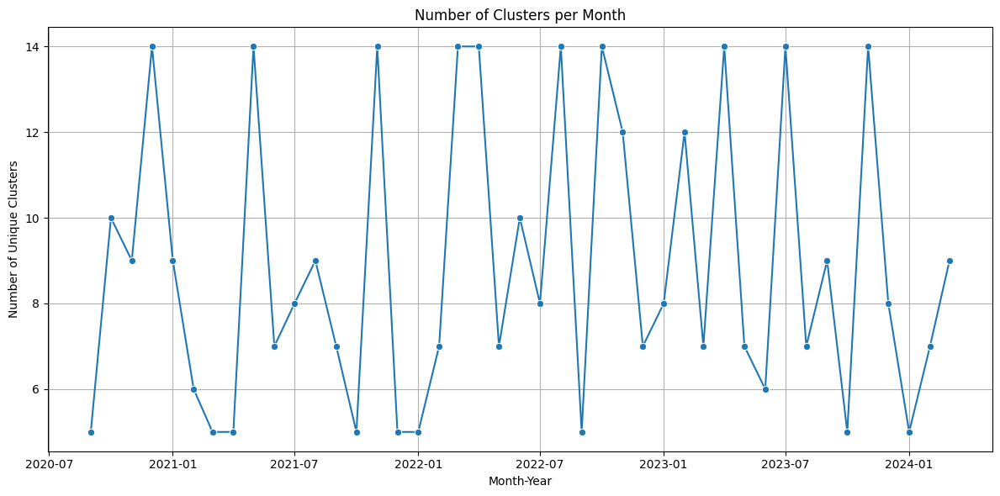

In [47]:
# Plot the number of unique clusters per month
plt.figure(figsize=(12, 6))
sns.lineplot(data=clusters_per_month, x='month_year', y='number_of_clusters', marker='o')
plt.title('Number of Clusters per Month')
plt.xlabel('Month-Year')
plt.ylabel('Number of Unique Clusters')
#plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.savefig('../images/textual_clustering_clusters_per_month.png')
plt.show()

In [48]:
final_agg_results

cluster       views             LikeRatio1        CommentRatio1        \
                   mean         std       mean    std          mean   std   
1         1  2581625.87  3874390.61      60.49  38.84          5.50  4.47   
0         0  2147626.45  3649481.93      52.13  23.46          5.58  2.91   
2         2   276268.00         NaN      29.92    NaN          4.76   NaN   
3         3   686474.00         NaN      61.52    NaN          4.43   NaN   
4         4   738537.00         NaN      16.80    NaN          1.03   NaN   
..      ...         ...         ...        ...    ...           ...   ...   
376       4   655584.00         NaN      15.48    NaN          2.55   NaN   
377       5   834632.00         NaN      43.95    NaN          1.69   NaN   
378       6   477603.00         NaN      16.13    NaN          0.81   NaN   
379       7   620972.00         NaN      23.70    NaN          2.24   NaN   
380       8   969096.00         NaN      33.08    NaN          0.81   NaN   

    trending_duration_days       views_velocity            comments_polarity  \
                      mean   std           mean        std              mean   
1                     4.50  1.21      432112.85  598542.18              0.15   
0                     4.35  0.93      355024.07  534152.08              0.15   
2                     4.00   NaN       46044.67        NaN              0.23   
3                     2.00   NaN      137294.80        NaN              0.26   
4                     3.00   NaN      147707.40        NaN              0.26   
..                     ...   ...            ...        ...               ...   
376                   7.00   NaN       81948.00        NaN              0.06   
377                   8.00   NaN       92736.89        NaN              0.35   
378                   4.00   NaN       79600.50        NaN              0.27   
379                   7.00   NaN       68996.89        NaN              0.29   
380                   7.00   NaN      121137.00        NaN              0.11   

          video_id month_year  
      std    count             
1    0.13      222    2020-09  
0    0.09       20    2020-09  
2     NaN        1    2020-09  
3     NaN        1    2020-09  
4     NaN        1    2020-09  
..    ...      ...        ...  
376   NaN        1    2024-03  
377   NaN        1    2024-03  
378   NaN        1    2024-03  
379   NaN        1    2024-03  
380   NaN        1    2024-03  

[381 rows x 15 columns]

In [49]:
#Flatten column names
final_agg_results.columns = ['_'.join(col).strip() if isinstance(col, tuple) else col for col in final_agg_results.columns]
# Convert 'month_year_' to standard datetime format
final_agg_results['month_year_'] = final_agg_results['month_year_'].dt.to_timestamp()

In [50]:
final_agg_results

,cluster_,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,video_id_count,month_year_
1,1,2581625.87,3874390.61,60.49,38.84,5.50,4.47,4.50,1.21,432112.85,598542.18,0.15,0.13,222,2020-09-01
0,0,2147626.45,3649481.93,52.13,23.46,5.58,2.91,4.35,0.93,355024.07,534152.08,0.15,0.09,20,2020-09-01
2,2,276268.00,NaN,29.92,NaN,4.76,NaN,4.00,NaN,46044.67,NaN,0.23,NaN,1,2020-09-01
3,3,686474.00,NaN,61.52,NaN,4.43,NaN,2.00,NaN,137294.80,NaN,0.26,NaN,1,2020-09-01
4,4,738537.00,NaN,16.80,NaN,1.03,NaN,3.00,NaN,147707.40,NaN,0.26,NaN,1,2020-09-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376,4,655584.00,NaN,15.48,NaN,2.55,NaN,7.00,NaN,81948.00,NaN,0.06,NaN,1,2024-03-01
377,5,834632.00,NaN,43.95,NaN,1.69,NaN,8.00,NaN,92736.89,NaN,0.35,NaN,1,2024-03-01
378,6,477603.00,NaN,16.13,NaN,0.81,NaN,4.00,NaN,79600.50,NaN,0.27,NaN,1,2024-03-01
379,7,620972.00,NaN,23.70,NaN,2.24,NaN,7.00,NaN,68996.89,NaN,0.29,NaN,1,2024-03-01


### Size of Clusters per Month

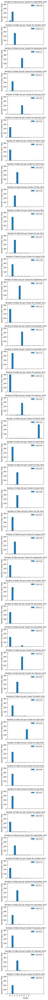

In [51]:
# Plotting bar plots for each month based on video_id_count
months = final_agg_results['month_year_'].unique()

fig, axs = plt.subplots(len(months), 1, figsize=(4, 2 * len(months)), sharex=True, sharey=True)

for i, month in enumerate(months):
    data_month = final_agg_results[final_agg_results['month_year_'] == month]
    data_month = data_month.sort_values(by='cluster_')  # Ensure clusters are sorted for consistent stacking
    
    num_clusters = data_month['cluster_'].nunique()
    xticks = range(num_clusters)
    
    axs[i].bar(xticks, data_month['video_id_count'], label=month.strftime('%Y-%m'))
    axs[i].set_title(f'Number of Video IDs per Cluster for {month.strftime("%B %Y")}', fontsize =10)
    axs[i].set_ylabel('Number of Video Titles')
    axs[i].legend()

    # Set x-axis ticks and labels
    axs[i].set_xticks(xticks)
    axs[i].set_xticklabels(data_month['cluster_'].unique(), rotation=0, ha='right')  # Ensure labels are readable

plt.xlabel('Cluster')
plt.tight_layout()
plt.show()

### Leading Contents per Month

In [52]:
final_contentC1

,video_id,channelId,channelTitle,trending_date,time_to_trend_hr,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,final_title,cleaned_description,month_year,cluster
0,N3XbZvD3lRo,UCsyBVa0eTR-lL0sRnKpIe8w,GHOSTEMANE,2020-09-01 00:00:00+00:00,8.01,5.0,1295131,118.99,7.02,2.158552e+05,0.24,ghostemane official video,GHOSTEMANE AI OFFICIAL VIDEO a Studio Linguini...,2020-09-01,1
1,3AiDa3ZD20Y,UCsEukrAd64fqA7FjwkmZ_Dw,GQ,2020-09-01 00:00:00+00:00,8.00,5.0,3972340,53.79,2.57,6.620567e+05,0.22,rocky answer question rihanna,Watch Rihanna answer questions from AAP Rocky ...,2020-09-01,1
2,EpGCCKB3Oag,UCRXiA3h1no_PFkb1JCP0yMA,Vogue,2020-09-01 00:00:00+00:00,8.00,5.0,2712156,55.36,2.08,4.520260e+05,0.33,rihanna answer question rocky,Watch AAP Rocky answer questions from Rihanna ...,2020-09-01,1
3,8gXQsAea26I,UCCqEeDAUf4Mg0GgEN658tkA,Chris Stuckmann,2020-09-01 00:00:00+00:00,11.00,4.0,808443,49.90,6.86,1.616886e+05,0.12,tenet movie review,Chris Stuckmann reviews Tenet starring John Da...,2020-09-01,0
4,HDduzIB8HjU,UCPD_bxCRGpmmeQcbe2kpPaA,First We Feast,2020-09-02 00:00:00+00:00,9.00,5.0,2572270,33.69,3.40,4.287117e+05,0.29,joseph gordon levitt cocky eat spicy wing hot,Joseph is an actor director and producer from ...,2020-09-01,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11943,F78Wat58Cec,UCqwUnggBBct-AY2lAdI88jQ,BABYMONSTER,2024-03-30 00:00:00+00:00,9.00,7.0,8493952,35.12,1.10,1.061744e+06,0.32,babymonster teaser chiquita,BABYMONSER Title SHEESH MVTEASER CHIQUITA AM,2024-03-01,1
11944,DQghiGQi6Lo,UCx-KWLTKlB83hDI6UKECtJQ,Max,2024-03-31 00:00:00+00:00,8.99,8.0,3004457,33.64,1.47,3.338286e+05,0.42,penguin official teaser,The next chapter in TheBatman saga from Matt R...,2024-03-01,1
11945,DBfpm5FrsHI,UCYFyHJMMKd7C8M0_TsleUQA,Big Sean,2024-03-31 00:00:00+00:00,32.00,7.0,829147,62.00,4.25,9.212744e+04,0.04,big precision,NaN,2024-03-01,1
11946,063FqEfBTns,UCyQ-DUV6lZgoL8wiPusYiUg,Amelia Dimoldenberg,2024-03-31 00:00:00+00:00,7.00,8.0,1961401,60.14,1.01,2.179334e+05,0.14,lando norris chicken shop date,Amelia meets Formula Driver Lando Norris for a...,2024-03-01,1


In [53]:
# Group by 'month_year' and 'cluster' to calculate the size of each cluster
cluster_sizes = final_contentC1.groupby(['month_year', 'cluster']).size().reset_index(name='size')

# Identify the largest cluster for each month
idx = cluster_sizes.groupby(['month_year'])['size'].idxmax()
largest_clusters = cluster_sizes.loc[idx].reset_index(drop=True)

In [54]:
largest_clusters

,month_year,cluster,size
0,2020-09-01,1,222
1,2020-10-01,2,267
2,2020-11-01,5,222
3,2020-12-01,1,222
4,2021-01-01,5,204
5,2021-02-01,0,232
6,2021-03-01,0,248
7,2021-04-01,3,261
8,2021-05-01,2,258
9,2021-06-01,1,298


In [55]:
# For each largest cluster, join the 'cleaned_title' values into a single string
joined_titles_per_month = final_contentC1.groupby(['month_year', 'cluster'])['final_title'].apply(lambda titles: ' '.join(titles)).reset_index()

In [56]:
largest_clusters_df1 = pd.merge(largest_clusters, joined_titles_per_month, on=['month_year','cluster'])

In [57]:
final_agg_results.rename(columns={
    'cluster_': 'cluster',
    'month_year_': 'month_year',
    'video_id_count': 'size'
}, inplace=True)

In [58]:
final_agg_results

,cluster,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,size,month_year
1,1,2581625.87,3874390.61,60.49,38.84,5.50,4.47,4.50,1.21,432112.85,598542.18,0.15,0.13,222,2020-09-01
0,0,2147626.45,3649481.93,52.13,23.46,5.58,2.91,4.35,0.93,355024.07,534152.08,0.15,0.09,20,2020-09-01
2,2,276268.00,NaN,29.92,NaN,4.76,NaN,4.00,NaN,46044.67,NaN,0.23,NaN,1,2020-09-01
3,3,686474.00,NaN,61.52,NaN,4.43,NaN,2.00,NaN,137294.80,NaN,0.26,NaN,1,2020-09-01
4,4,738537.00,NaN,16.80,NaN,1.03,NaN,3.00,NaN,147707.40,NaN,0.26,NaN,1,2020-09-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
376,4,655584.00,NaN,15.48,NaN,2.55,NaN,7.00,NaN,81948.00,NaN,0.06,NaN,1,2024-03-01
377,5,834632.00,NaN,43.95,NaN,1.69,NaN,8.00,NaN,92736.89,NaN,0.35,NaN,1,2024-03-01
378,6,477603.00,NaN,16.13,NaN,0.81,NaN,4.00,NaN,79600.50,NaN,0.27,NaN,1,2024-03-01
379,7,620972.00,NaN,23.70,NaN,2.24,NaN,7.00,NaN,68996.89,NaN,0.29,NaN,1,2024-03-01


In [59]:
largest_clusters_df = pd.merge(largest_clusters_df1, final_agg_results, on=['month_year','cluster', 'size'])

In [60]:
largest_clusters_df.head(5)

,month_year,cluster,size,final_title,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std
0,2020-09-01,1,222,ghostemane official video rocky answer questio...,2581625.87,3874390.61,60.49,38.84,5.50,4.47,4.50,1.21,432112.85,598542.18,0.15,0.13
1,2020-10-01,2,267,addison rae mom awkward conversation podcast j...,2659464.85,3807654.51,58.16,37.49,4.65,5.53,4.46,1.35,432688.71,548676.47,0.16,0.12
2,2020-11-01,5,222,new truth noah txt dance break ver tomorrow co...,2546722.70,3752086.00,53.12,34.10,5.05,5.99,5.60,2.00,339972.21,444826.15,0.16,0.12
3,2020-12-01,1,222,fortnite money war pwr tournament raise cane m...,2814882.37,4834819.00,59.69,35.17,5.22,5.33,5.27,1.48,399484.34,597909.85,0.16,0.13
4,2021-01-01,5,204,filipino food galore mukbang mom foodtruck rei...,3271608.72,5453500.34,51.40,34.39,5.04,5.56,7.11,2.04,393391.27,636701.20,0.15,0.13


In [61]:
largest_clusters_df.columns

Index(['month_year', 'cluster', 'size', 'final_title', 'views_mean',
       'views_std', 'LikeRatio1_mean', 'LikeRatio1_std', 'CommentRatio1_mean',
       'CommentRatio1_std', 'trending_duration_days_mean',
       'trending_duration_days_std', 'views_velocity_mean',
       'views_velocity_std', 'comments_polarity_mean',
       'comments_polarity_std'],
      dtype='object')

In [62]:
# Function to get top 5 words
def get_top_words(text):
    # Generate word cloud
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
    
    # Filter out words with 1-2 characters
    filtered_words = {word: freq for word, freq in wordcloud.words_.items() if len(word) > 2}
    
    # Get the top 10 words
    top_words = list(filtered_words.keys())[:10]
    
    return top_words

In [63]:
# Apply function to each month_year group
top_words_per_month = largest_clusters_df.groupby('month_year')['final_title'].apply(lambda x: get_top_words(' '.join(x))).reset_index()

# Rename the column
top_words_per_month.columns = ['month_year', 'top_10_words']

# Merge with largest_clusters_df
largest_clusters_df = pd.merge(largest_clusters_df, top_words_per_month, on='month_year')
largest_clusters_df.head(2)

,month_year,cluster,size,final_title,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,top_10_words
0,2020-09-01,1,222,ghostemane official video rocky answer questio...,2581625.87,3874390.61,60.49,38.84,5.50,4.47,4.50,1.21,432112.85,598542.18,0.15,0.13,"[official, video, chadwick boseman, challenge,..."
1,2020-10-01,2,267,addison rae mom awkward conversation podcast j...,2659464.85,3807654.51,58.16,37.49,4.65,5.53,4.46,1.35,432688.71,548676.47,0.16,0.12,"[official, video, official trailer, season, ne..."


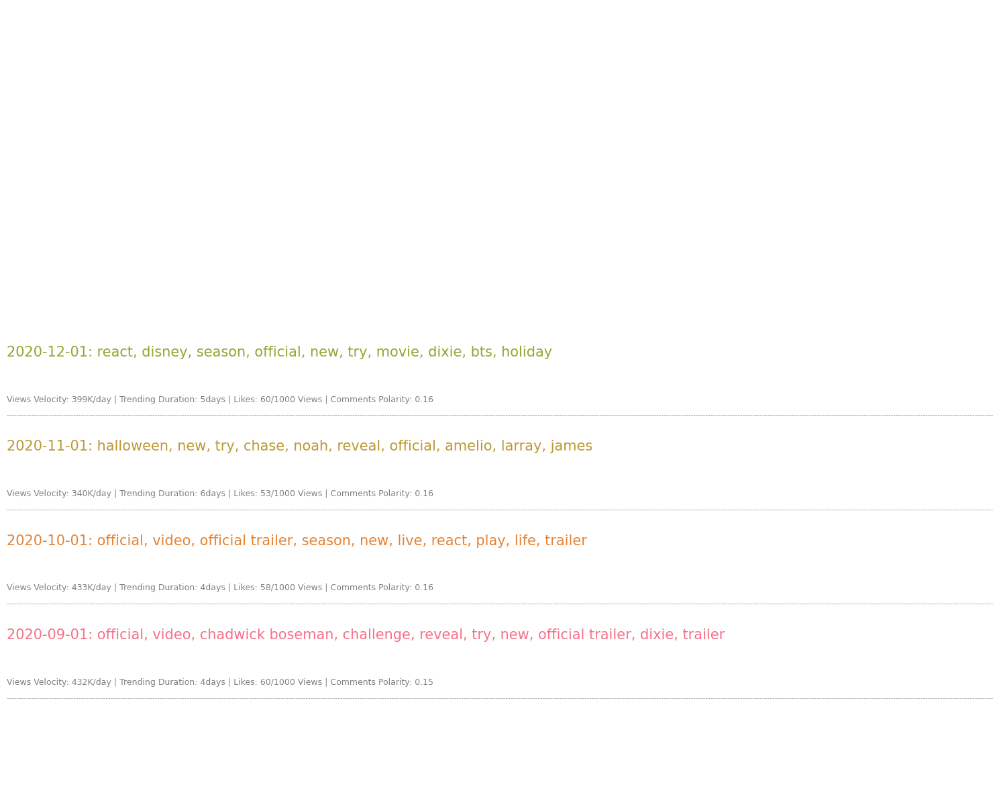

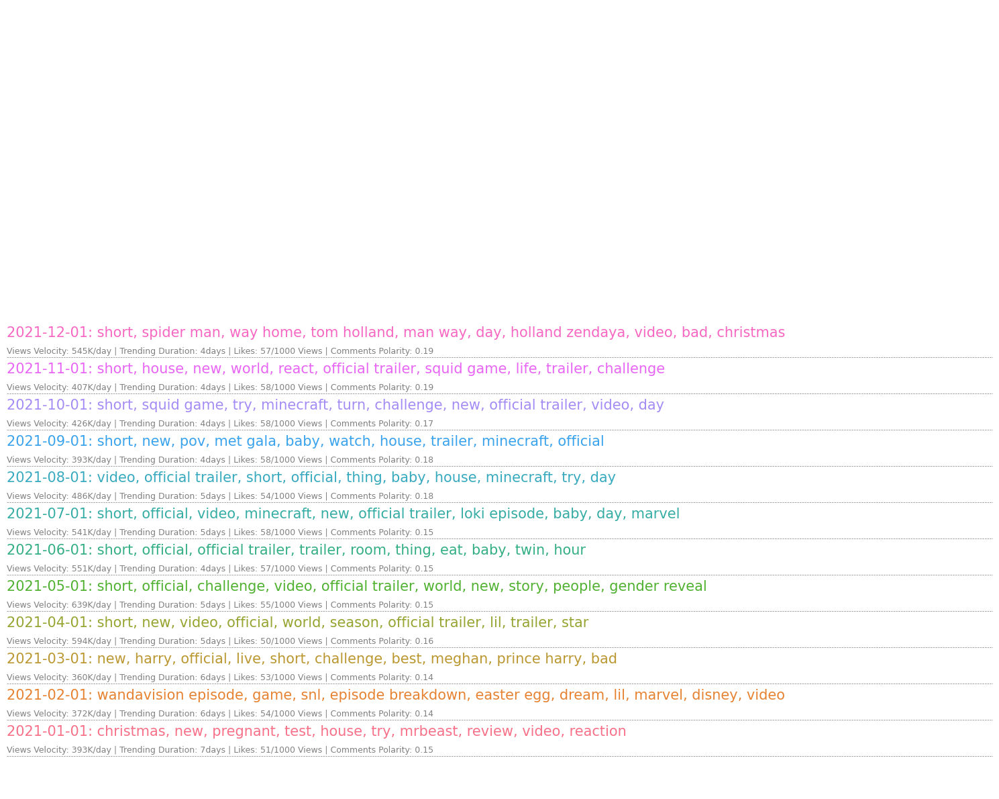

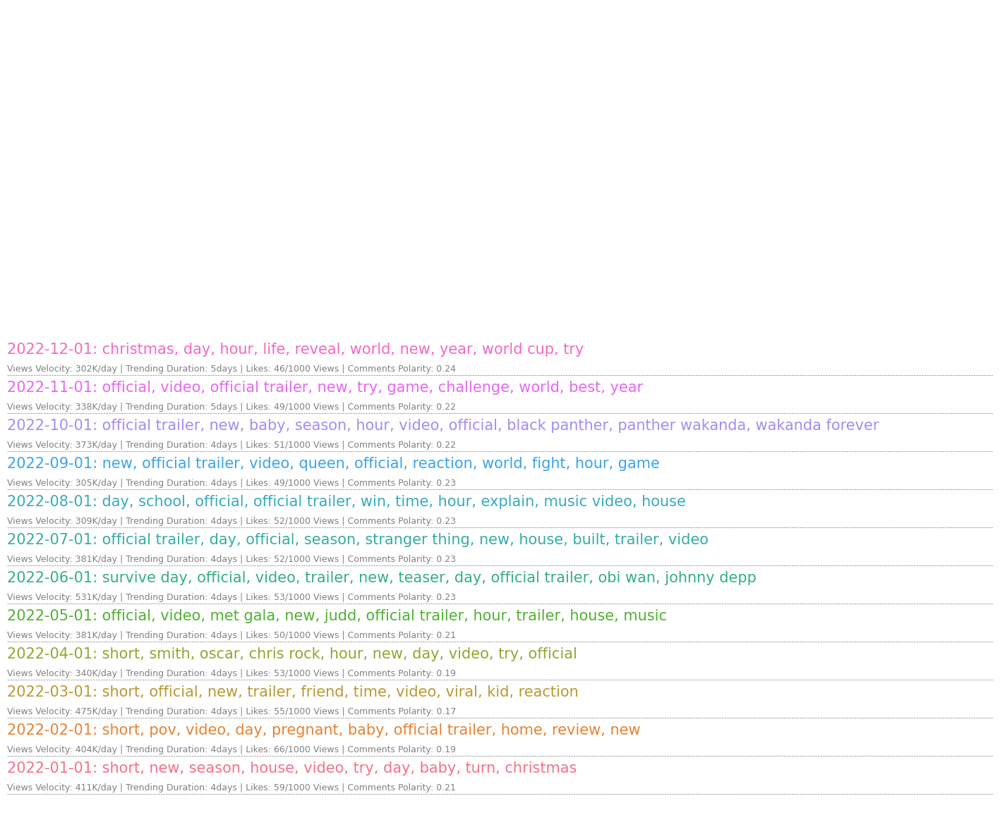

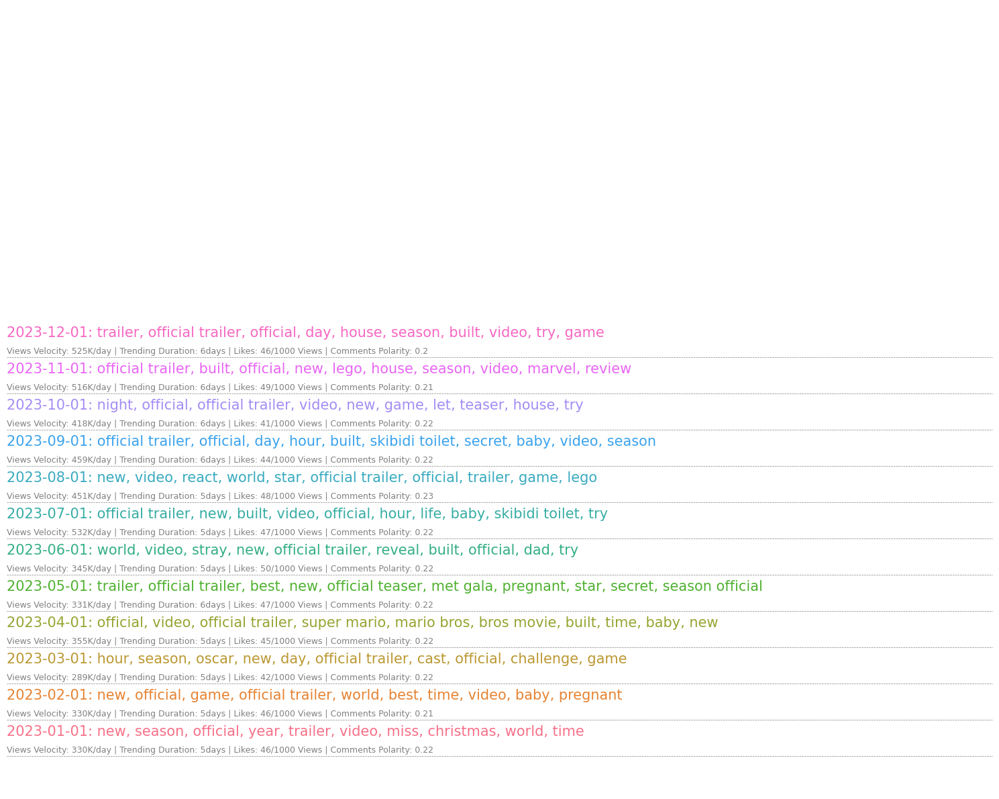

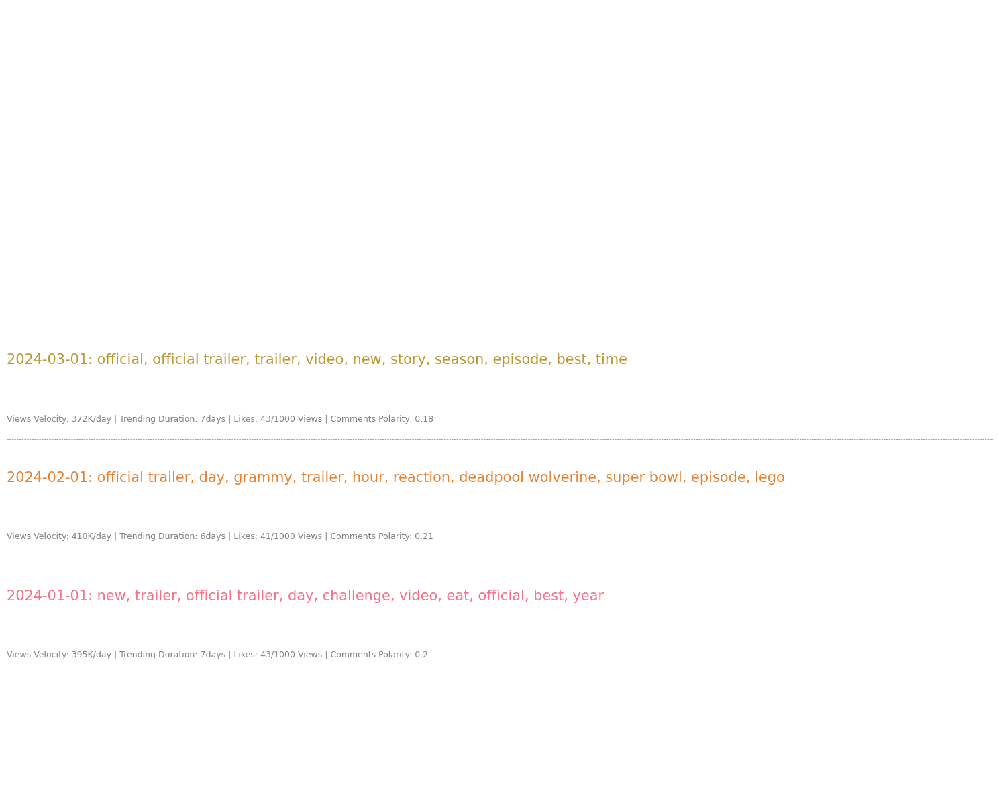

In [64]:
# Ensure 'month_year' column is treated as string
largest_clusters_df['month_year'] = largest_clusters_df['month_year'].astype(str)

# Generate a custom palette with 12 colors using seaborn
custom_palette = sns.color_palette("husl", 12)

# Iterate over each unique year in the DataFrame
unique_years = largest_clusters_df['month_year'].str[:4].unique()

for year in unique_years:
    # Filter data for the specific year
    df_year = largest_clusters_df[largest_clusters_df['month_year'].str.startswith(year)]
    
    # Prepare data for plotting
    months = df_year['month_year']
    top_words = df_year['top_10_words']
    sizes = df_year['size']
    views_velocity_mean = df_year['views_velocity_mean']/1000
    views_velocity_std = df_year['views_velocity_std']/1000
    like_ratio = df_year['LikeRatio1_mean']
    trending_duration_days_mean = df_year['trending_duration_days_mean']
    trending_duration_days_std = df_year['trending_duration_days_std']
    comments_polarity_mean = df_year['comments_polarity_mean']
    comments_polarity_std = df_year['comments_polarity_std']
    
    line_height = 0.6  # Adjust this value to increase/decrease space between lines
    
    # Plotting
    plt.figure(figsize=(15, 12))
    
    for i, (month, words) in enumerate(zip(months, top_words)):
        color = custom_palette[i % 12]  # Cycle through the custom palette
        plt.text(0, i*line_height, f'{month}: ' + ', '.join(words), fontsize=15, ha='left', va='center', color=color)
        # Add a blank line between entries
        plt.axhline(i*line_height -0.4, color='gray', linestyle='--', linewidth=0.5)
    
        info_str = (f'Views Velocity: {views_velocity_mean.iloc[i]:.0f}K/day | Trending Duration: {trending_duration_days_mean.iloc[i]:.0f}days | Likes: {like_ratio.iloc[i]:.0f}/1000 Views | Comments Polarity: {comments_polarity_mean.iloc[i]}')
        plt.text(0, i*line_height-0.3, info_str, fontsize=9, ha='left', va='center', color='gray')
    
    plt.xlim(0, 1)
    plt.ylim(-1, len(months))
    plt.axis('off')
    #plt.title(f'Top Words and Metrics for Each Month in {year}')
    plt.tight_layout()

    
    
    plt.show()

In [65]:
largest_clusters_df.head(2)

,month_year,cluster,size,final_title,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,top_10_words
0,2020-09-01,1,222,ghostemane official video rocky answer questio...,2581625.87,3874390.61,60.49,38.84,5.50,4.47,4.50,1.21,432112.85,598542.18,0.15,0.13,"[official, video, chadwick boseman, challenge,..."
1,2020-10-01,2,267,addison rae mom awkward conversation podcast j...,2659464.85,3807654.51,58.16,37.49,4.65,5.53,4.46,1.35,432688.71,548676.47,0.16,0.12,"[official, video, official trailer, season, ne..."


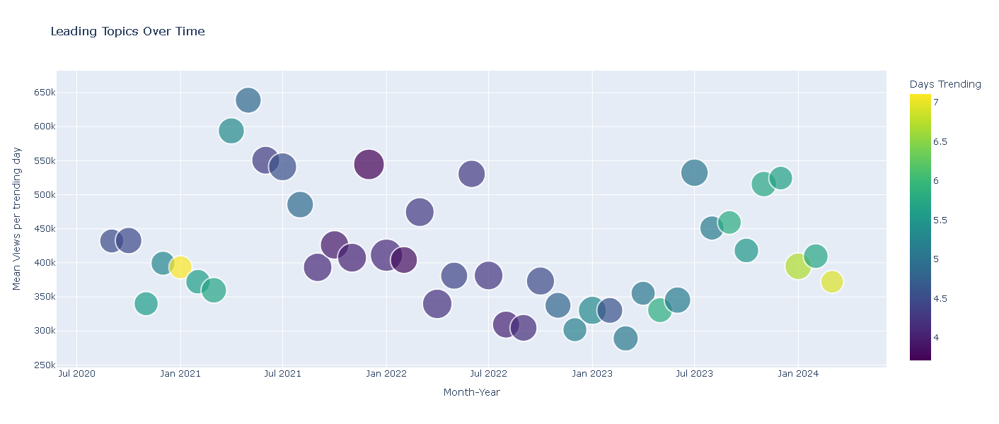

In [66]:
import plotly.express as px
import plotly.io as pio

# Assuming largest_clusters_df has 'month_year', 'size', and 'views_velocity_mean' columns

# Convert 'month_year' to datetime if it's not already in datetime format
largest_clusters_df['month_year'] = pd.to_datetime(largest_clusters_df['month_year'])
# Extracting the year
largest_clusters_df['year'] = largest_clusters_df['month_year'].dt.year

# Create a bubble plot
fig = px.scatter(
    largest_clusters_df,
    x='month_year',
    y='views_velocity_mean',
    size='size',
    color='trending_duration_days_mean', 
    hover_name='year',
    hover_data={'trending_duration_days_mean': ':.1f', 'size': True, 'top_10_words': True, 'views_velocity_mean': ':.0f'},
    title='Leading Topics Over Time',
    labels={'month_year': 'Month-Year', 'size': 'Titles', 'trending_duration_days_mean': 'Days Trending', 'top_10_words': 'Top 5 words', 'views_velocity_mean': 'Mean Views per trending day'}, 
    size_max=70,  # Max size of bubbles
    width=1300,  # Overall figure width
    height=600,  # Overall figure height
    color_continuous_scale='viridis'
)

# Customize layout
fig.update_traces(marker=dict(sizemode='area', sizeref=1.5*max(largest_clusters_df['size'])/(40.**2), line_width=2))

# Update x-axis title
fig.update_xaxes(title_text='Month-Year')

# Update legend title
fig.update_layout(
    legend_title_text='Year'
)

html_file_path = '../images/Leading_topics_month.html'
pio.write_html(fig, html_file_path, auto_open=False)

fig.show()



# Behavioral Clustering

In [67]:
engagement_df = df.copy()

In [68]:
# List of numerical features corresponding to engagement, content and video identifiers
features = df[['video_id', 'channelId', 'channelTitle', 'trending_date', 'trending_duration_days', 
               'final_title', 'views', 'views_velocity', 'LikeRatio1', 'CommentRatio1', 'comments_polarity']]

In [69]:
features.isnull().sum()

video_id                   0
channelId                  0
channelTitle               0
trending_date              0
trending_duration_days     0
final_title                0
views                      0
views_velocity             0
LikeRatio1                 0
CommentRatio1              0
comments_polarity         74
dtype: int64

In [70]:
features.dropna(subset='comments_polarity', inplace = True)

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\1914446357.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [71]:
features.reset_index(drop=True, inplace=True)

In [72]:
features

,video_id,channelId,channelTitle,trending_date,trending_duration_days,final_title,views,views_velocity,LikeRatio1,CommentRatio1,comments_polarity
0,N3XbZvD3lRo,UCsyBVa0eTR-lL0sRnKpIe8w,GHOSTEMANE,2020-09-01 00:00:00+00:00,5.0,ghostemane official video,1295131,2.158552e+05,118.99,7.02,0.24
1,3AiDa3ZD20Y,UCsEukrAd64fqA7FjwkmZ_Dw,GQ,2020-09-01 00:00:00+00:00,5.0,rocky answer question rihanna,3972340,6.620567e+05,53.79,2.57,0.22
2,EpGCCKB3Oag,UCRXiA3h1no_PFkb1JCP0yMA,Vogue,2020-09-01 00:00:00+00:00,5.0,rihanna answer question rocky,2712156,4.520260e+05,55.36,2.08,0.33
3,8gXQsAea26I,UCCqEeDAUf4Mg0GgEN658tkA,Chris Stuckmann,2020-09-01 00:00:00+00:00,4.0,tenet movie review,808443,1.616886e+05,49.90,6.86,0.12
4,HDduzIB8HjU,UCPD_bxCRGpmmeQcbe2kpPaA,First We Feast,2020-09-02 00:00:00+00:00,5.0,joseph gordon levitt cocky eat spicy wing hot,2572270,4.287117e+05,33.69,3.40,0.29
...,...,...,...,...,...,...,...,...,...,...,...
11869,F78Wat58Cec,UCqwUnggBBct-AY2lAdI88jQ,BABYMONSTER,2024-03-30 00:00:00+00:00,7.0,babymonster teaser chiquita,8493952,1.061744e+06,35.12,1.10,0.32
11870,DQghiGQi6Lo,UCx-KWLTKlB83hDI6UKECtJQ,Max,2024-03-31 00:00:00+00:00,8.0,penguin official teaser,3004457,3.338286e+05,33.64,1.47,0.42
11871,DBfpm5FrsHI,UCYFyHJMMKd7C8M0_TsleUQA,Big Sean,2024-03-31 00:00:00+00:00,7.0,big precision,829147,9.212744e+04,62.00,4.25,0.04
11872,063FqEfBTns,UCyQ-DUV6lZgoL8wiPusYiUg,Amelia Dimoldenberg,2024-03-31 00:00:00+00:00,8.0,lando norris chicken shop date,1961401,2.179334e+05,60.14,1.01,0.14


In [73]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11874 entries, 0 to 11873
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype              
---  ------                  --------------  -----              
 0   video_id                11874 non-null  object             
 1   channelId               11874 non-null  object             
 2   channelTitle            11874 non-null  object             
 3   trending_date           11874 non-null  datetime64[ns, UTC]
 4   trending_duration_days  11874 non-null  float64            
 5   final_title             11874 non-null  object             
 6   views                   11874 non-null  int64              
 7   views_velocity          11874 non-null  float64            
 8   LikeRatio1              11874 non-null  float64            
 9   CommentRatio1           11874 non-null  float64            
 10  comments_polarity       11874 non-null  float64            
dtypes: datetime64[ns, UTC](1), float64(5), in

In [74]:
features.columns

Index(['video_id', 'channelId', 'channelTitle', 'trending_date',
       'trending_duration_days', 'final_title', 'views', 'views_velocity',
       'LikeRatio1', 'CommentRatio1', 'comments_polarity'],
      dtype='object')

In [75]:
columns_to_drop = ['video_id', 'channelId', 'channelTitle', 'trending_date', 'final_title', 'views_velocity']
engagement_features = features.drop(columns=columns_to_drop)

In [76]:
engagement_features.columns

Index(['trending_duration_days', 'views', 'LikeRatio1', 'CommentRatio1',
       'comments_polarity'],
      dtype='object')

### Scaling Engagement Metrics

In [77]:
# Initialize the scaler
scaler = StandardScaler()
scaled_features = scaler.fit_transform(engagement_features)
X = scaled_features
X

array([[ 0.0642528 , -0.19746646,  2.12271357,  0.87125784,  0.34012109],
       [ 0.0642528 ,  0.11713697,  0.0681134 , -0.24929136,  0.19198633],
       [ 0.0642528 , -0.03094942,  0.11758767, -0.37267767,  1.00672747],
       ...,
       [ 0.99240086, -0.25222505,  0.32682916,  0.17374744, -1.14122644],
       [ 1.45647489, -0.11917193,  0.26821633, -0.6421131 , -0.40055268],
       [ 0.99240086, -0.22943294, -0.48461186, -0.60937795,  0.85859272]])

<Figure size 800x600 with 0 Axes>

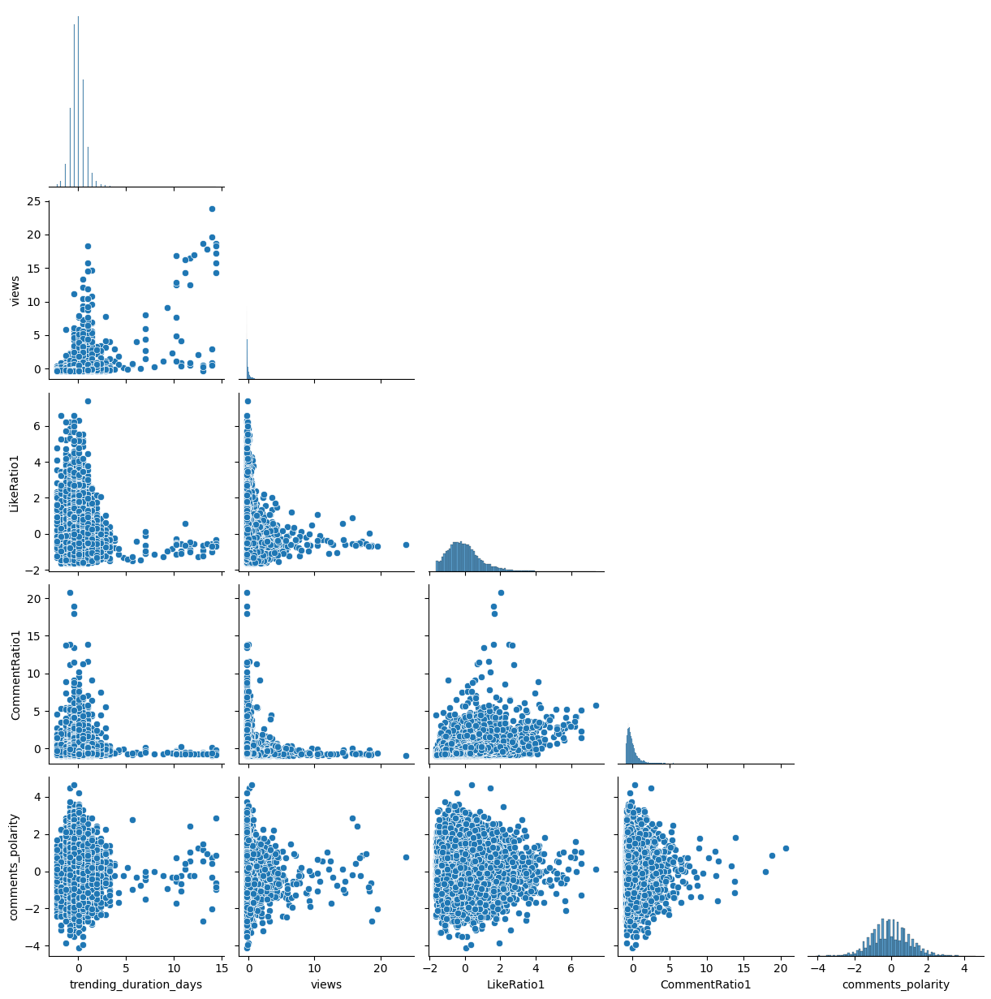

In [78]:
X_df = pd.DataFrame(X, columns = engagement_features.columns)
plt.figure(figsize=(8, 6))
sns.pairplot(X_df, corner = True)

### Optimizing number of clusters

For n_clusters = 4, the inertia is : 34587.39416267126
For n_clusters = 4, the silhouette score is : 0.21352704038728004
For n_clusters = 5, the inertia is : 30915.484192839584
For n_clusters = 5, the silhouette score is : 0.21202233759495023
For n_clusters = 6, the inertia is : 29239.383649431744
For n_clusters = 6, the silhouette score is : 0.20371914148982082
For n_clusters = 7, the inertia is : 26675.62235540133
For n_clusters = 7, the silhouette score is : 0.21211570440724897
For n_clusters = 8, the inertia is : 24409.384580943977
For n_clusters = 8, the silhouette score is : 0.18921593948594
For n_clusters = 9, the inertia is : 22863.884897565793
For n_clusters = 9, the silhouette score is : 0.18510279413226635
For n_clusters = 10, the inertia is : 21738.871699857995
For n_clusters = 10, the silhouette score is : 0.17175224978244336
For n_clusters = 11, the inertia is : 20363.773636740334
For n_clusters = 11, the silhouette score is : 0.1770178557290322
For n_clusters = 12, the i

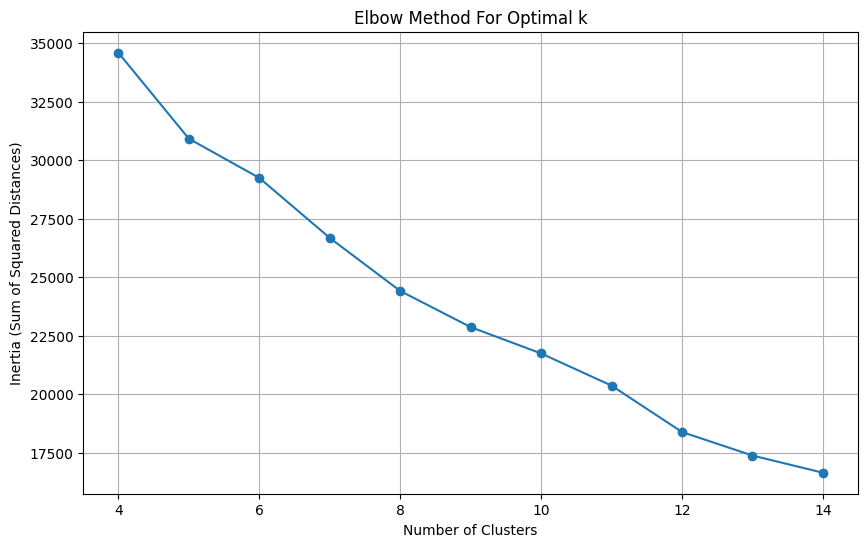

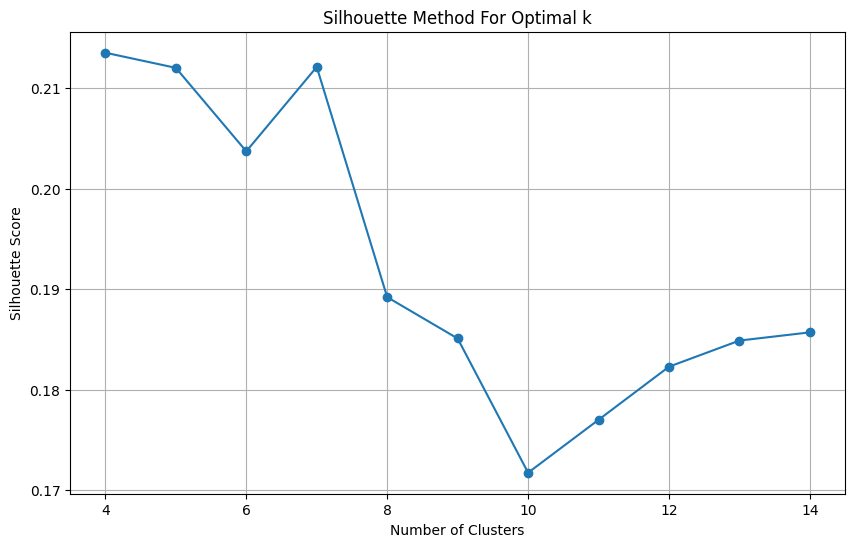

Optimal number of clusters based on the elbow method: 6
Optimal number of clusters based on the maximum drop in silhouette scores: 7


In [80]:
inertia_scores = []
silhouette_scores = []
range_n_clusters = range(4, 15)  # Range of clusters to try

# Compute inertia and silhouette scores for different numbers of clusters
for n_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=1000, random_state=42)
    cluster_labels = kmeans.fit_predict(X)
    
    inertia = kmeans.inertia_
    inertia_scores.append(inertia)
    
    silhouette_avg = silhouette_score(X, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    
    print(f"For n_clusters = {n_clusters}, the inertia is : {inertia}")
    print(f"For n_clusters = {n_clusters}, the silhouette score is : {silhouette_avg}")

# Plotting the inertia scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, inertia_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia (Sum of Squared Distances)')
plt.title('Elbow Method For Optimal k')
plt.grid(True)
plt.show()

# Plotting the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Method For Optimal k')
plt.grid(True)
plt.show()

# Compute the second derivative of inertia scores
second_derivative = np.diff(inertia_scores, 2)

# Find the index of the maximum second derivative
elbow_point_index = np.argmax(second_derivative) + 2

# Optimal number of clusters based on the elbow method
optimal_n_clusters = range_n_clusters[elbow_point_index]

print(f"Optimal number of clusters based on the elbow method: {optimal_n_clusters}")


optimal_k_index_silhouette = np.argmax(silhouette_scores)

if optimal_k_index_silhouette == 0:
    second_next_optimal_k_index_silhouette = np.argsort(silhouette_scores)[-2]
    optimal_k_silhouette = range_n_clusters[second_next_optimal_k_index_silhouette]
else:
    optimal_k_silhouette = range_n_clusters[optimal_k_index_silhouette]
    
print(f"Optimal number of clusters based on the maximum drop in silhouette scores: {optimal_k_silhouette}")

In [81]:
# Get clusters
true_k = 7

model = KMeans(n_clusters=true_k, init='k-means++', max_iter=1000,  n_init=10, random_state=42)
labels = model.fit_predict(X)

# Add cluster labels to the DataFrame
X_df['cluster'] = labels

import pickle

filename = "behavioral_kmeans_across_all_titles" + str(true_k) + ".pkl"
with open("../models/" + filename, "wb" ) as file:
    pickle.dump(model, file)


In [82]:
X_df

,trending_duration_days,views,LikeRatio1,CommentRatio1,comments_polarity,cluster
0,0.064253,-0.197466,2.122714,0.871258,0.340121,1
1,0.064253,0.117137,0.068113,-0.249291,0.191986,0
2,0.064253,-0.030949,0.117588,-0.372678,1.006727,6
3,-0.399821,-0.254658,-0.054469,0.830968,-0.548687,2
4,0.064253,-0.047388,-0.565283,-0.040290,0.710458,6
...,...,...,...,...,...,...
11869,0.992401,0.648479,-0.520221,-0.619450,0.932660,0
11870,1.456475,0.003399,-0.566859,-0.526281,1.673334,0
11871,0.992401,-0.252225,0.326829,0.173747,-1.141226,2
11872,1.456475,-0.119172,0.268216,-0.642113,-0.400553,0


<Figure size 800x600 with 0 Axes>

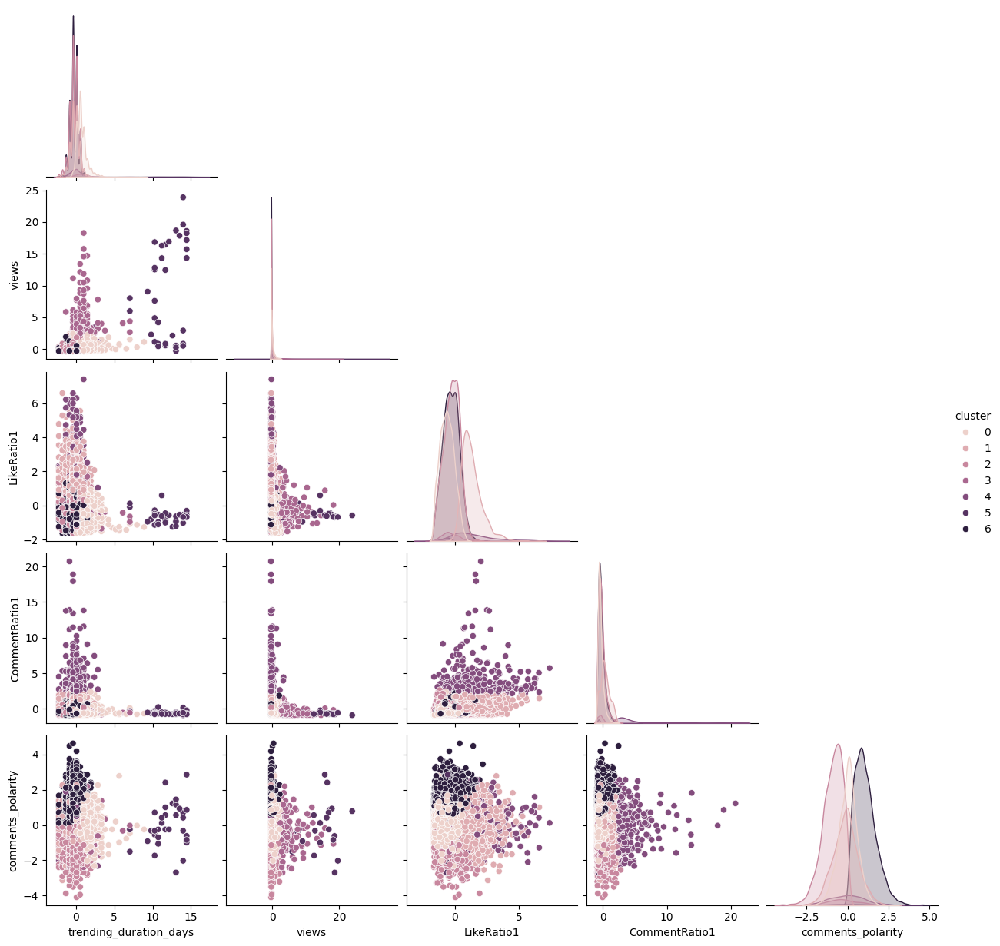

In [83]:
# Plot the pairplot with the clusters
plt.figure(figsize=(8, 6))
sns.pairplot(X_df, corner = True, hue = 'cluster')
plt.savefig('../images/engagement_features_clusters_pairplot.png')
plt.show()

In [84]:
engagement_clusters = pd.DataFrame({
    'video_id': features['video_id'],           
    'final_title': features['final_title'],
    'channelId': features['channelId'],
    'channelTitle': features['channelTitle'],
    'trending_date': features['trending_date'],
    'trending_duration_days': features['trending_duration_days'],
    'views': features['views'],
    'LikeRatio1': features['LikeRatio1'],
    'CommentRatio1': features['CommentRatio1'],
    'views_velocity': features['views_velocity'], 
    'comments_polarity': features['comments_polarity'], 
    'cluster': labels                    
})

engagement_clusters

,video_id,final_title,channelId,channelTitle,trending_date,trending_duration_days,views,LikeRatio1,CommentRatio1,views_velocity,comments_polarity,cluster
0,N3XbZvD3lRo,ghostemane official video,UCsyBVa0eTR-lL0sRnKpIe8w,GHOSTEMANE,2020-09-01 00:00:00+00:00,5.0,1295131,118.99,7.02,2.158552e+05,0.24,1
1,3AiDa3ZD20Y,rocky answer question rihanna,UCsEukrAd64fqA7FjwkmZ_Dw,GQ,2020-09-01 00:00:00+00:00,5.0,3972340,53.79,2.57,6.620567e+05,0.22,0
2,EpGCCKB3Oag,rihanna answer question rocky,UCRXiA3h1no_PFkb1JCP0yMA,Vogue,2020-09-01 00:00:00+00:00,5.0,2712156,55.36,2.08,4.520260e+05,0.33,6
3,8gXQsAea26I,tenet movie review,UCCqEeDAUf4Mg0GgEN658tkA,Chris Stuckmann,2020-09-01 00:00:00+00:00,4.0,808443,49.90,6.86,1.616886e+05,0.12,2
4,HDduzIB8HjU,joseph gordon levitt cocky eat spicy wing hot,UCPD_bxCRGpmmeQcbe2kpPaA,First We Feast,2020-09-02 00:00:00+00:00,5.0,2572270,33.69,3.40,4.287117e+05,0.29,6
...,...,...,...,...,...,...,...,...,...,...,...,...
11869,F78Wat58Cec,babymonster teaser chiquita,UCqwUnggBBct-AY2lAdI88jQ,BABYMONSTER,2024-03-30 00:00:00+00:00,7.0,8493952,35.12,1.10,1.061744e+06,0.32,0
11870,DQghiGQi6Lo,penguin official teaser,UCx-KWLTKlB83hDI6UKECtJQ,Max,2024-03-31 00:00:00+00:00,8.0,3004457,33.64,1.47,3.338286e+05,0.42,0
11871,DBfpm5FrsHI,big precision,UCYFyHJMMKd7C8M0_TsleUQA,Big Sean,2024-03-31 00:00:00+00:00,7.0,829147,62.00,4.25,9.212744e+04,0.04,2
11872,063FqEfBTns,lando norris chicken shop date,UCyQ-DUV6lZgoL8wiPusYiUg,Amelia Dimoldenberg,2024-03-31 00:00:00+00:00,8.0,1961401,60.14,1.01,2.179334e+05,0.14,0


## Engaged Content

In [87]:
engagement_clusters.columns

Index(['video_id', 'final_title', 'channelId', 'channelTitle', 'trending_date',
       'trending_duration_days', 'views', 'LikeRatio1', 'CommentRatio1',
       'views_velocity', 'comments_polarity', 'cluster'],
      dtype='object')

In [88]:
agg_result = engagement_clusters.groupby('cluster').agg({
    'views': ['mean', 'std'],
    'LikeRatio1': ['mean', 'std'],
    'CommentRatio1': ['mean', 'std'],
    'trending_duration_days': ['mean', 'std'],
    'views_velocity': ['mean', 'std'],
    'comments_polarity': ['mean', 'std'],
    'video_id': 'count',
    'final_title': lambda x: ' '.join(x)   
}).reset_index()



In [89]:
# Flatten the MultiIndex columns
agg_result.columns = ['_'.join(col).strip('_') for col in agg_result.columns.values]

# Rename the cleaned_title_ column to just cleaned_title
agg_result.rename(columns={'final_title_<lambda>': 'final_title'}, inplace=True)

agg_result

,cluster,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,video_id_count,final_title
0,0,3.753932e+06,4.285739e+06,32.018275,17.238580,2.154606,1.653153,6.419798,1.578302,5.003433e+05,5.955973e+05,0.194554,0.077348,2475,rocky answer question rihanna black panther st...
1,1,1.745901e+06,2.272850e+06,93.464677,25.495467,4.951289,2.863749,4.457772,1.326062,2.946753e+05,3.627687e+05,0.175162,0.101431,2226,ghostemane official video cordae gift roddy ri...
2,2,1.825657e+06,2.354142e+06,43.513772,19.254540,2.863426,2.146043,4.231871,1.243591,3.188686e+05,4.141124e+05,0.068973,0.083128,3351,tenet movie review fill charli room picture ch...
3,3,4.344985e+07,2.355328e+07,41.140520,20.638517,2.203699,1.659868,6.641618,2.339972,5.395776e+06,2.788913e+06,0.153468,0.121921,173,subscriber car fill house slime bought new sur...
4,4,1.756088e+06,3.209402e+06,98.562235,53.354340,19.100475,9.601530,4.684358,1.542427,2.784252e+05,4.750113e+05,0.187849,0.135057,358,wonho open mind teaser prince family official ...
5,5,8.220290e+07,6.450590e+07,31.396944,11.754301,1.371389,1.010384,30.527778,4.345678,2.571288e+06,1.898459e+06,0.193333,0.155729,36,golden buzzer jimmie herrod surprise judge tom...
6,6,1.515050e+06,2.036543e+06,41.902249,19.527138,2.781361,2.048844,4.242089,1.136265,2.678373e+05,3.842105e+05,0.338304,0.086651,3255,rihanna answer question rocky joseph gordon le...


In [90]:
agg_result.loc[agg_result['cluster'] == 0, 'views_velocity_mean'].values[0]

500343.2540609564

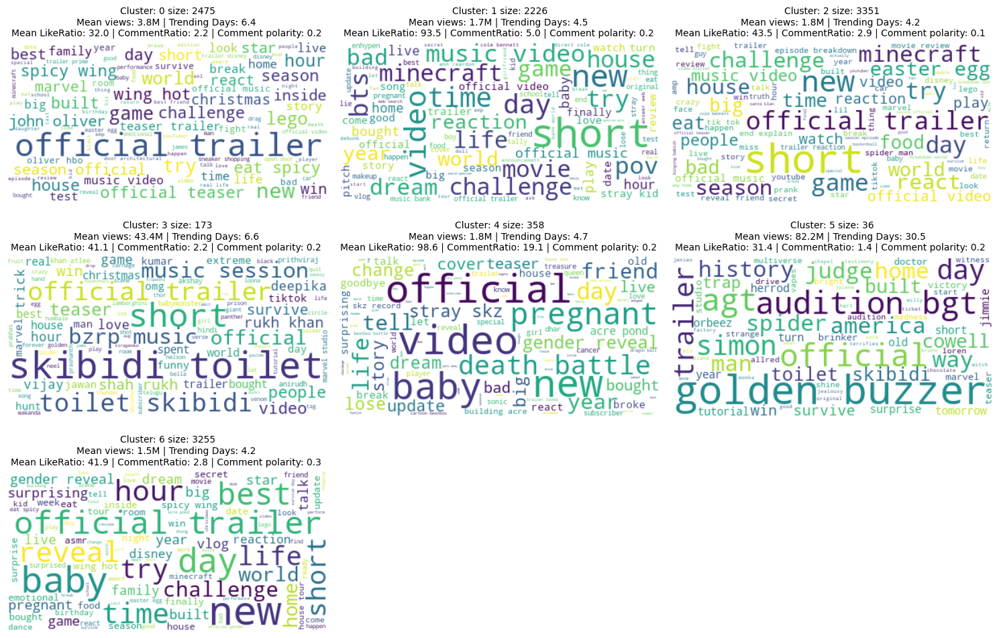

In [94]:
# Determine number of rows and columns dynamically
num_rows = (true_k - 1) // 3 + 1  # 3 columns per row
num_cols = min(true_k, 3)

# Create subplots
plt.figure(figsize=(15, 10))
for k in range(true_k):
    text = agg_result[agg_result.cluster == k]['final_title'].str.cat(sep=' ')
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)

    # Create subplot
    ax = plt.subplot(num_rows, num_cols, k + 1)
    ax.set_title("Cluster " + str(k))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")

    # Annotate with mean and std
    count = agg_result.loc[agg_result['cluster'] == k, 'video_id_count'].values[0]
    mean_views = agg_result.loc[agg_result['cluster'] == k, 'views_mean'].values[0] / 10**6
    mean_trending_days = agg_result.loc[agg_result['cluster'] == k, 'trending_duration_days_mean'].values[0]
    
    mean_likeratio = agg_result.loc[agg_result['cluster'] == k, 'LikeRatio1_mean'].values[0]
    mean_commentratio = agg_result.loc[agg_result['cluster'] == k, 'CommentRatio1_mean'].values[0]
    mean_commentpolarity = agg_result.loc[agg_result['cluster'] == k, 'comments_polarity_mean'].values[0]

    stats_text = f"Mean views: {mean_views:.1f}M | Trending Days: {mean_trending_days:.1f} \nMean LikeRatio: {mean_likeratio:.1f} | CommentRatio: {mean_commentratio:.1f} | Comment polarity: {mean_commentpolarity:.1f} "
    ax.set_title("Cluster: " + str(k) + " size: " + str(count) + "\n" + stats_text, fontsize=10)

plt.tight_layout()

plt.savefig('../images/behavioral_clustering_engaged_topics.png')

plt.show()

# Temporal - Behavioral Clustering

In [160]:
features.columns

Index(['video_id', 'channelId', 'channelTitle', 'trending_date',
       'trending_duration_days', 'final_title', 'views', 'views_velocity',
       'LikeRatio1', 'CommentRatio1', 'comments_polarity', 'month_year'],
      dtype='object')

In [161]:
columns_to_drop = ['video_id', 'channelId', 'channelTitle', 'trending_date', 'final_title', 'views_velocity']
engagement_features = features.drop(columns=columns_to_drop)
engagement_features

,trending_duration_days,views,LikeRatio1,CommentRatio1,comments_polarity,month_year
0,5.0,1295131,118.99,7.02,0.24,2020-09
1,5.0,3972340,53.79,2.57,0.22,2020-09
2,5.0,2712156,55.36,2.08,0.33,2020-09
3,4.0,808443,49.90,6.86,0.12,2020-09
4,5.0,2572270,33.69,3.40,0.29,2020-09
...,...,...,...,...,...,...
11869,7.0,8493952,35.12,1.10,0.32,2024-03
11870,8.0,3004457,33.64,1.47,0.42,2024-03
11871,7.0,829147,62.00,4.25,0.04,2024-03
11872,8.0,1961401,60.14,1.01,0.14,2024-03


In [162]:
# Convert trending_date to datetime format
features['trending_date'] = pd.to_datetime(features['trending_date'])

# Extract month and year from trending_date
features['month_year'] = features['trending_date'].dt.to_period('M')

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\1080157689.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\1080157689.py:5: UserWarning:

Converting to PeriodArray/Index representation will drop timezone information.

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\1080157689.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [163]:
def find_optimal_k(X):

    silhouette_scores = []
    range_n_clusters = range(4, 15)
    
    for n_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=n_clusters, init='k-means++', max_iter=1000, random_state=42)
        cluster_labels = kmeans.fit_predict(X)
        
        silhouette_avg = silhouette_score(X, cluster_labels)
        silhouette_scores.append(silhouette_avg)
        
    # Plotting the silhouette scores
    plt.figure(figsize=(5, 3))
    plt.plot(range_n_clusters, silhouette_scores, marker='o')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette Score')
    plt.title('Silhouette Method For Optimal k')
    plt.grid(True)
    plt.show()

    optimal_k_index = np.argmax(silhouette_scores)
    
    if optimal_k_index == 0:
        second_next_optimal_k_index = np.argsort(silhouette_scores)[-2]
        optimal_k = range_n_clusters[second_next_optimal_k_index]
    else:
        optimal_k = range_n_clusters[optimal_k_index]
    
    print(f"Optimal number of clusters based on silhouette scores: {optimal_k}")

    return optimal_k

# Function to apply clustering to a single monthly subset
def cluster_monthly_data(monthly_df, month):
    columns_to_drop = ['video_id', 'channelId', 'channelTitle', 'trending_date', 'final_title', 'views_velocity', 'month_year']
    engagement_features = monthly_df.drop(columns=columns_to_drop)
    
    scaler = StandardScaler()
    scaled_features = scaler.fit_transform(engagement_features)
    X = scaled_features
      
    # Determine optimal number of clusters using the elbow method
    optimal_k = find_optimal_k(X)
    
    # Perform KMeans clustering with the optimal number of clusters
    model = KMeans(n_clusters=optimal_k, init='k-means++', max_iter=1000, random_state=42)
    model.fit(X)
    
    filename = f"kmeans_textual_behavioral{month}_k{optimal_k}.pkl"
    with open(f"../models/{filename}", "wb") as file:
        pickle.dump(model, file)
        
    # Get predictions/labels
    labels = model.labels_
    
    # Assuming features is a DataFrame containing relevant columns
    engagement_clusters = pd.DataFrame({
        'video_id': monthly_df['video_id'],           
        'final_title': monthly_df['final_title'],
        'channelId': monthly_df['channelId'],
        'channelTitle': monthly_df['channelTitle'],
        'trending_date': monthly_df['trending_date'],
        'views': monthly_df['views'],
        'LikeRatio1': monthly_df['LikeRatio1'],
        'CommentRatio1': monthly_df['CommentRatio1'],
        'views_velocity': monthly_df['views_velocity'], 
        'comments_polarity': monthly_df['comments_polarity'], 
        'trending_duration_days': monthly_df['trending_duration_days'], 
        'cluster': labels                    
    })

    agg_result = engagement_clusters.groupby('cluster').agg({ 
        'views': ['mean', 'std'],
        'LikeRatio1': ['mean', 'std'],
        'CommentRatio1': ['mean', 'std'],
        'trending_duration_days': ['mean', 'std'],
        'views_velocity': ['mean', 'std'],
        'comments_polarity': ['mean', 'std'],
        'video_id': 'count',
        'final_title': lambda x: ' '.join(x)   
    }).reset_index()
    
    # Flatten the MultiIndex columns
    agg_result.columns = ['_'.join(col).strip('_') for col in agg_result.columns.values]
    
    # Rename the cleaned_title_ column to just cleaned_title
    agg_result.rename(columns={'final_title_<lambda>': 'final_title'}, inplace=True)
    
    return agg_result

Processing period: 2020-09


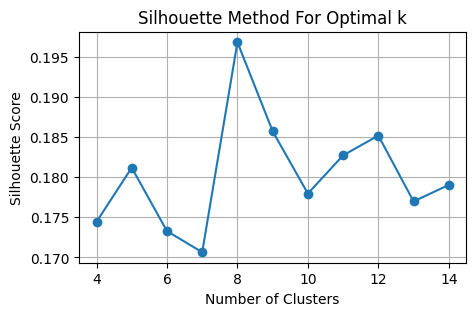

Optimal number of clusters based on silhouette scores: 8
Processing period: 2020-10


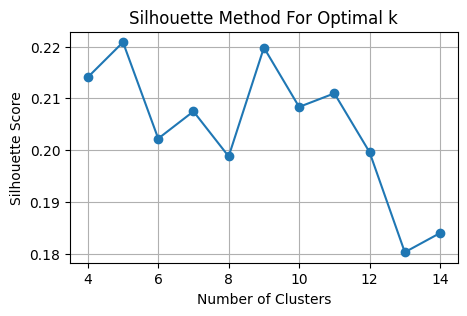

Optimal number of clusters based on silhouette scores: 5
Processing period: 2020-11


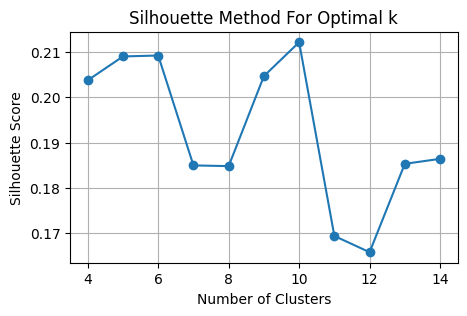

Optimal number of clusters based on silhouette scores: 10
Processing period: 2020-12


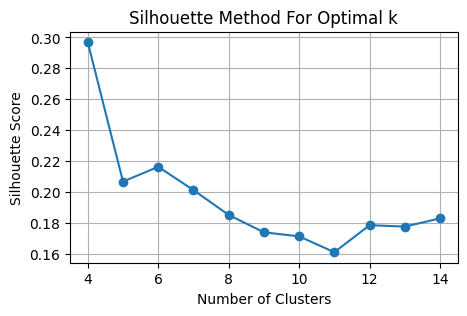

Optimal number of clusters based on silhouette scores: 6
Processing period: 2021-01


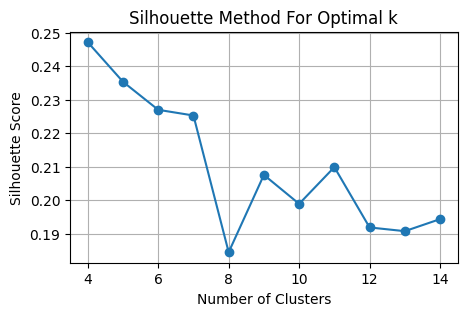

Optimal number of clusters based on silhouette scores: 5
Processing period: 2021-02


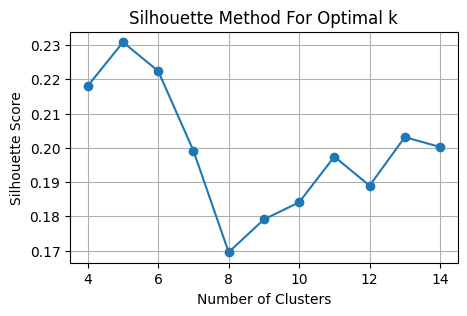

Optimal number of clusters based on silhouette scores: 5
Processing period: 2021-03


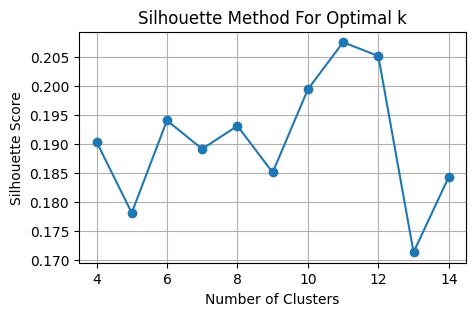

Optimal number of clusters based on silhouette scores: 11
Processing period: 2021-04


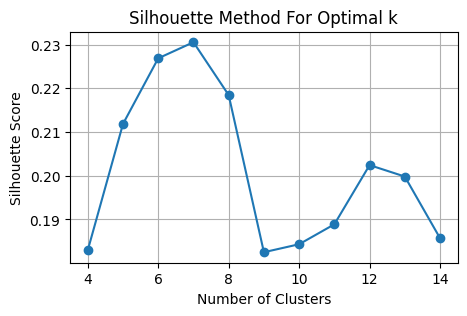

Optimal number of clusters based on silhouette scores: 7
Processing period: 2021-05


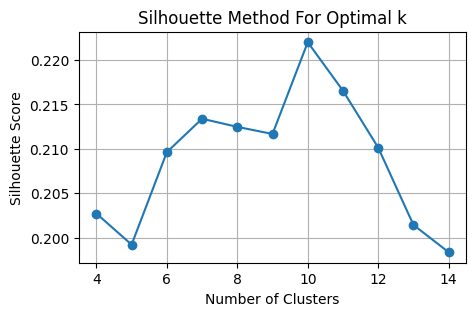

Optimal number of clusters based on silhouette scores: 10
Processing period: 2021-06


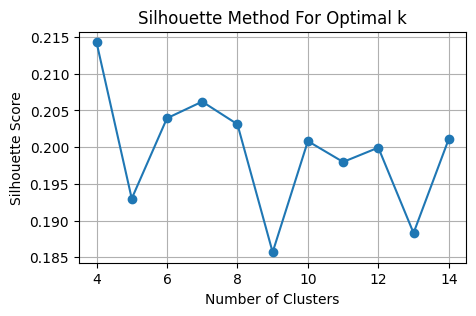

Optimal number of clusters based on silhouette scores: 7
Processing period: 2021-07


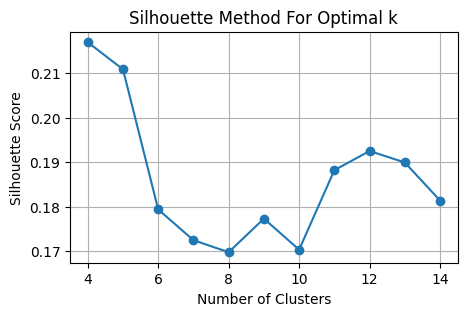

Optimal number of clusters based on silhouette scores: 5
Processing period: 2021-08


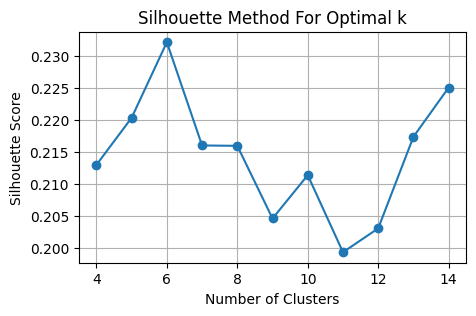

Optimal number of clusters based on silhouette scores: 6
Processing period: 2021-09


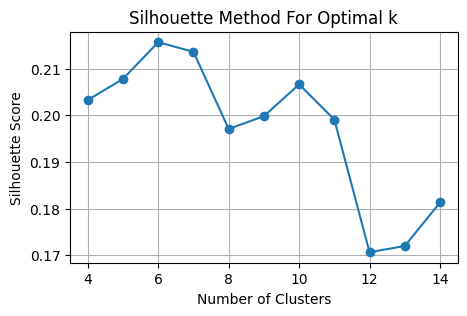

Optimal number of clusters based on silhouette scores: 6
Processing period: 2021-10


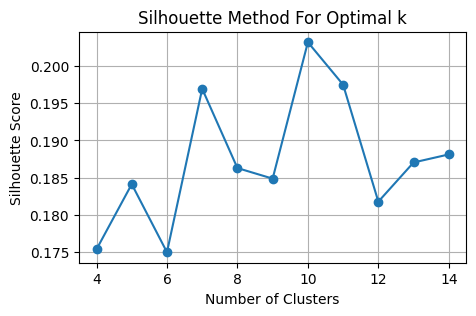

Optimal number of clusters based on silhouette scores: 10
Processing period: 2021-11


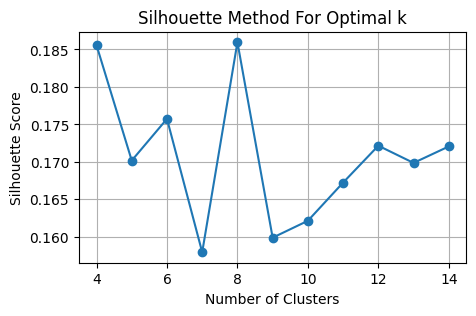

Optimal number of clusters based on silhouette scores: 8
Processing period: 2021-12


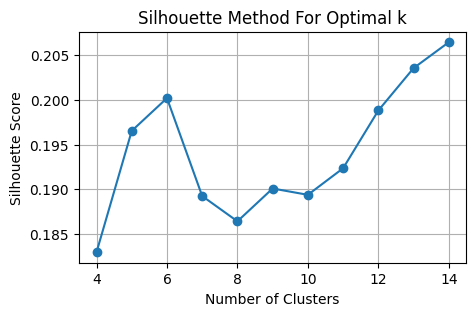

Optimal number of clusters based on silhouette scores: 14
Processing period: 2022-01


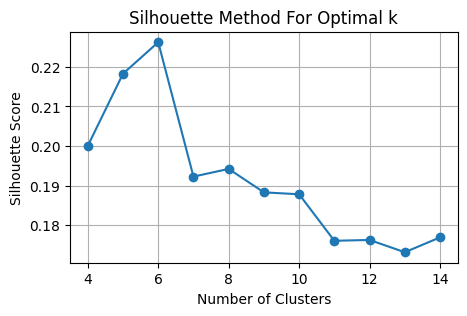

Optimal number of clusters based on silhouette scores: 6
Processing period: 2022-02


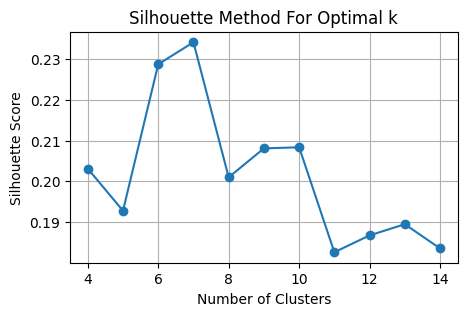

Optimal number of clusters based on silhouette scores: 7
Processing period: 2022-03


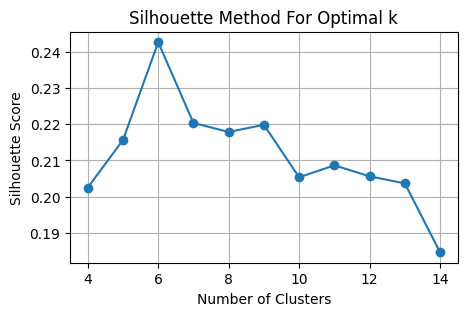

Optimal number of clusters based on silhouette scores: 6
Processing period: 2022-04


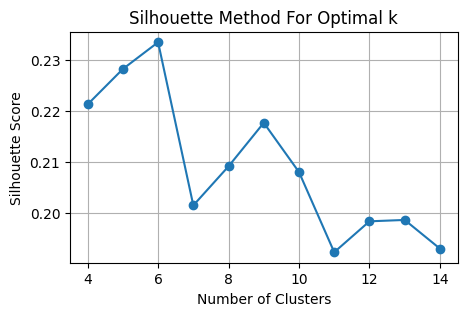

Optimal number of clusters based on silhouette scores: 6
Processing period: 2022-05


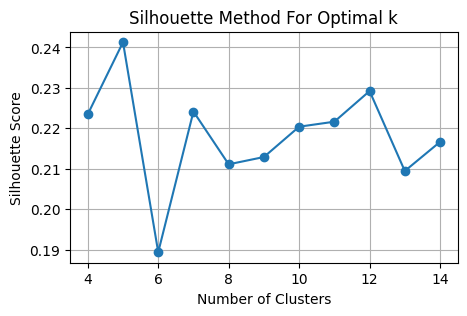

Optimal number of clusters based on silhouette scores: 5
Processing period: 2022-06


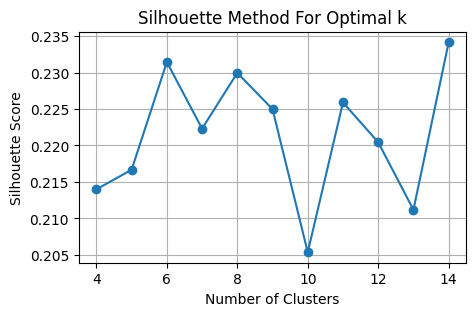

Optimal number of clusters based on silhouette scores: 14
Processing period: 2022-07


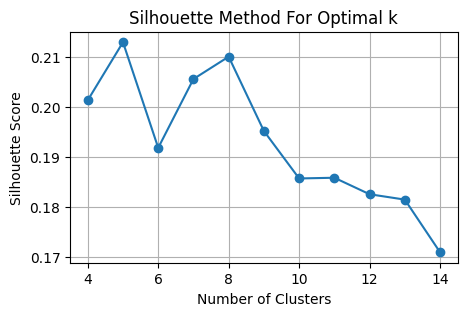

Optimal number of clusters based on silhouette scores: 5
Processing period: 2022-08


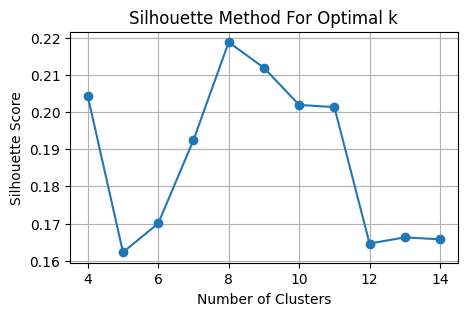

Optimal number of clusters based on silhouette scores: 8
Processing period: 2022-09


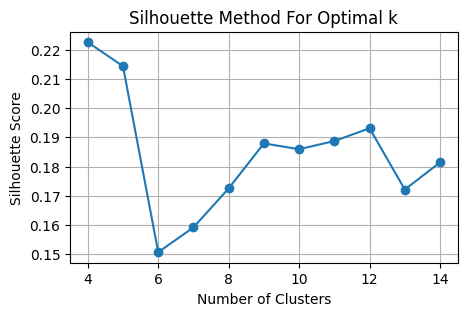

Optimal number of clusters based on silhouette scores: 5
Processing period: 2022-10


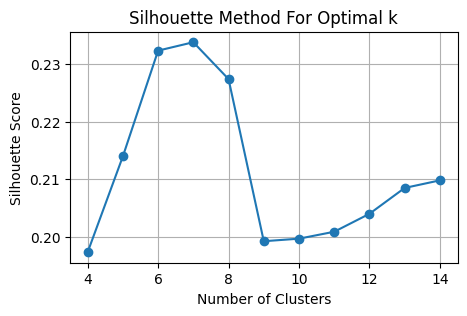

Optimal number of clusters based on silhouette scores: 7
Processing period: 2022-11


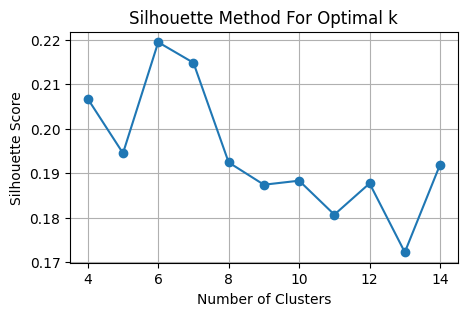

Optimal number of clusters based on silhouette scores: 6
Processing period: 2022-12


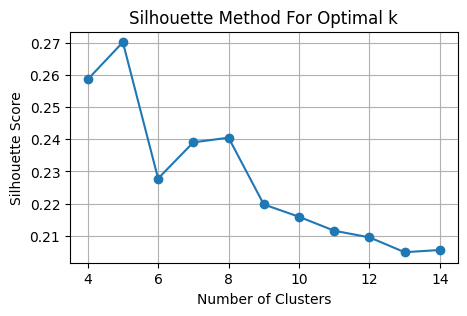

Optimal number of clusters based on silhouette scores: 5
Processing period: 2023-01


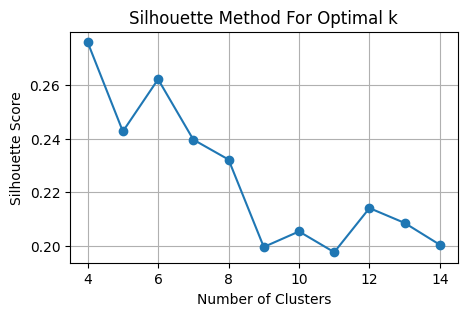

Optimal number of clusters based on silhouette scores: 6
Processing period: 2023-02


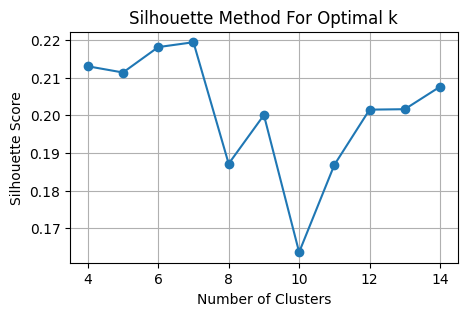

Optimal number of clusters based on silhouette scores: 7
Processing period: 2023-03


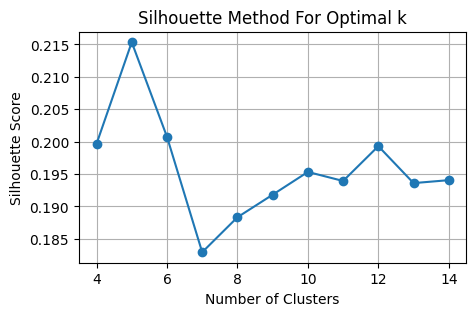

Optimal number of clusters based on silhouette scores: 5
Processing period: 2023-04


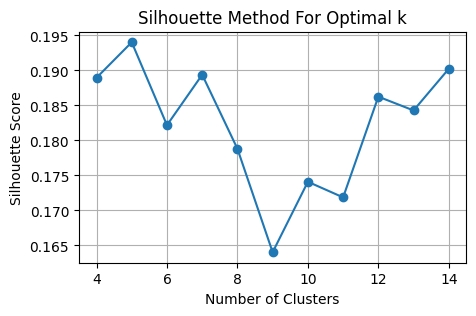

Optimal number of clusters based on silhouette scores: 5
Processing period: 2023-05


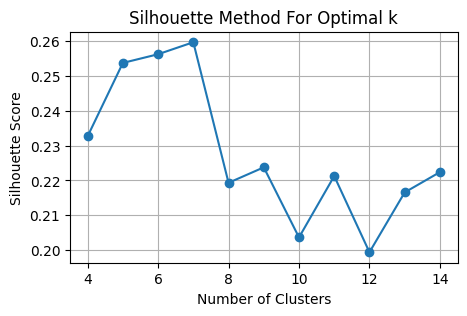

Optimal number of clusters based on silhouette scores: 7
Processing period: 2023-06


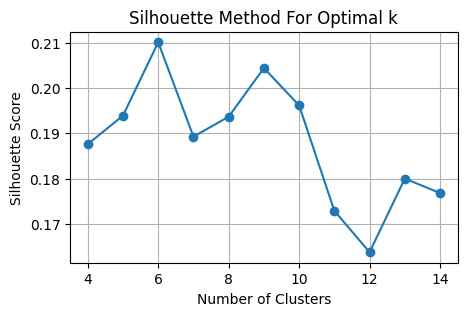

Optimal number of clusters based on silhouette scores: 6
Processing period: 2023-07


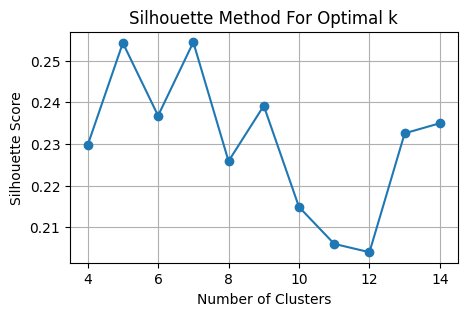

Optimal number of clusters based on silhouette scores: 7
Processing period: 2023-08


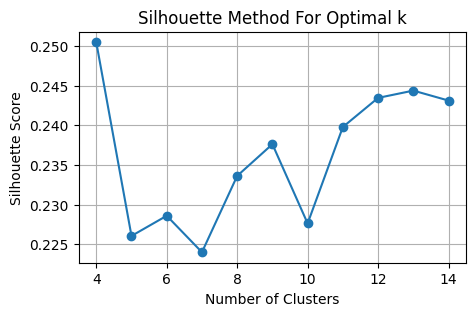

Optimal number of clusters based on silhouette scores: 13
Processing period: 2023-09


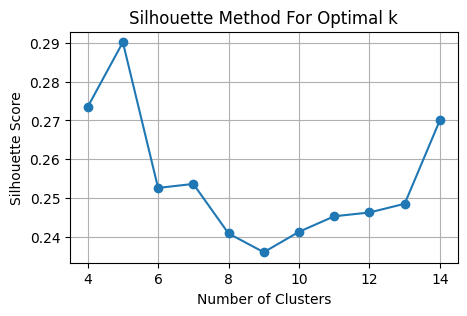

Optimal number of clusters based on silhouette scores: 5
Processing period: 2023-10


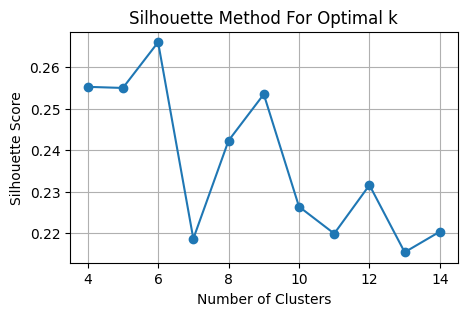

Optimal number of clusters based on silhouette scores: 6
Processing period: 2023-11


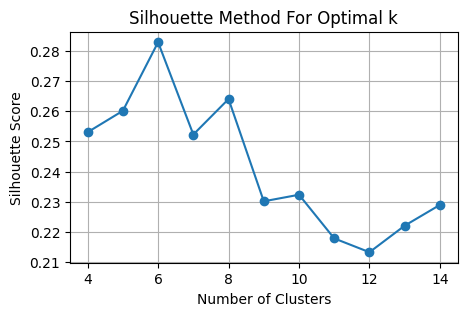

Optimal number of clusters based on silhouette scores: 6
Processing period: 2023-12


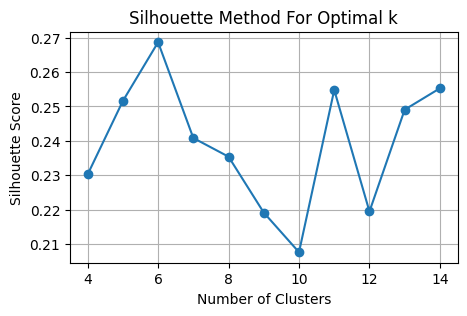

Optimal number of clusters based on silhouette scores: 6
Processing period: 2024-01


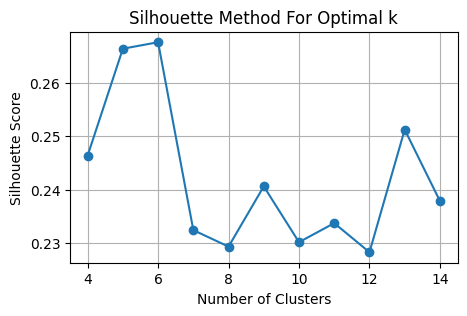

Optimal number of clusters based on silhouette scores: 6
Processing period: 2024-02


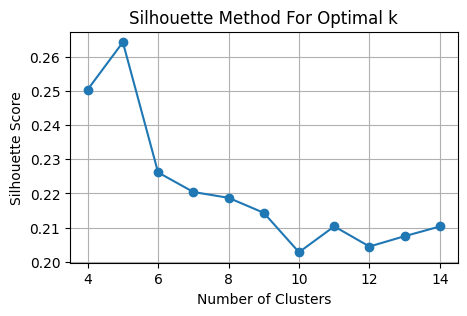

Optimal number of clusters based on silhouette scores: 5
Processing period: 2024-03


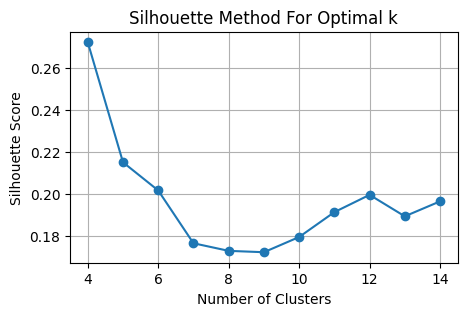

Optimal number of clusters based on silhouette scores: 5


In [164]:
# Group data by month and apply clustering
monthly_agg_results = []

for period, monthly_df in features.groupby('month_year'):
    print(f"Processing period: {period}")
    
    # Call the clustering function with the monthly data and period (month_year)
    agg_result1 = cluster_monthly_data(monthly_df, period)  # Pass the entire dataframe
    
    # Append results as a dictionary
    monthly_agg_results.append({
        'month_year': period,
        'agg_result': agg_result1
    })
    


In [165]:
# Concatenate all the results
final_agg_results = pd.concat([result['agg_result'].assign(month_year=result['month_year']) for result in monthly_agg_results], ignore_index=True)


In [166]:
final_agg_results

,cluster,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,video_id_count,final_title,month_year
0,0,2.014916e+06,1.669649e+06,44.261724,19.685324,3.282931,2.182552,4.965517,0.674485,3.297353e+05,259725.197810,0.290690,0.085673,58,rocky answer question rihanna rihanna answer q...,2020-09
1,1,1.689308e+06,2.278745e+06,93.456905,24.234987,7.342143,2.528783,3.785714,0.781984,3.641475e+05,620615.309174,0.166429,0.079136,42,ghostemane official video blackpink ice cream ...,2020-09
2,2,1.827435e+07,5.234274e+06,57.415556,29.330546,3.972222,1.449369,6.222222,0.833333,2.555440e+06,579037.961208,0.061111,0.101912,9,chadwick boseman tribute random person subscri...,2020-09
3,3,2.826700e+06,2.346177e+06,66.333913,22.561711,6.493913,3.522116,5.630435,0.609506,4.193833e+05,337213.094445,0.090652,0.077986,46,fill charli room picture chase cordae gift rod...,2020-09
4,4,1.193067e+06,9.426677e+05,52.445217,26.996760,5.542609,2.007971,3.782609,0.998022,2.320124e+05,185170.572132,-0.053478,0.094080,23,hit rock chic fil crunchwrap tenet movie revie...,2020-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
293,0,1.404800e+06,1.866480e+06,48.435306,24.190208,3.057959,1.655970,6.102041,1.597458,1.779121e+05,246282.015467,0.331224,0.082250,49,secretly bought customize shock tally bowsprit...,2024-03
294,1,2.604098e+06,4.207079e+06,47.446316,18.330866,3.187895,1.874033,7.092105,1.190828,2.945800e+05,478441.998601,0.063158,0.073398,76,santa klan duki peso pluma son klle video ofic...,2024-03
295,2,1.696493e+08,NaN,29.970000,NaN,1.340000,NaN,35.000000,NaN,4.585117e+06,NaN,-0.080000,NaN,1,face big fear win,2024-03
296,3,5.014929e+06,6.170719e+06,21.666912,11.264270,1.232500,0.842270,7.058824,1.131402,5.871658e+05,736365.025973,0.206471,0.076055,68,country best school lunch kia surprisingly goo...,2024-03


### Number of Clusters per Month

In [167]:
# Assuming 'month_year' is of PeriodDtype, convert it to datetime
final_agg_results['month_year'] = final_agg_results['month_year'].dt.to_timestamp()

# Count the number of unique clusters per month
clusters_per_month = final_agg_results.groupby('month_year')['cluster'].nunique().reset_index()

# Rename columns for clarity
clusters_per_month.columns = ['month_year', 'number_of_clusters']

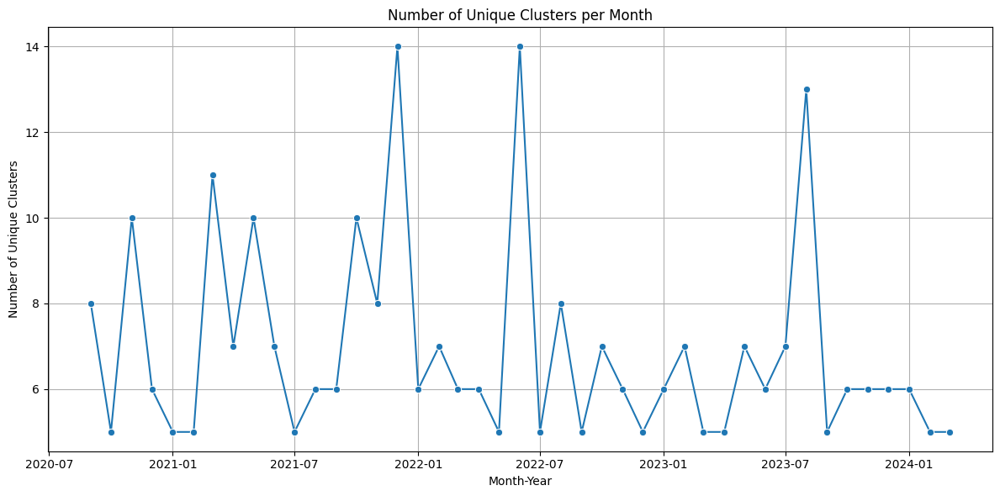

In [168]:
# Plot the number of unique clusters per month
plt.figure(figsize=(12, 6))
sns.lineplot(data=clusters_per_month, x='month_year', y='number_of_clusters', marker='o')
plt.title('Number of Unique Clusters per Month')
plt.xlabel('Month-Year')
plt.ylabel('Number of Unique Clusters')
#plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

### Size of Clusters per Month

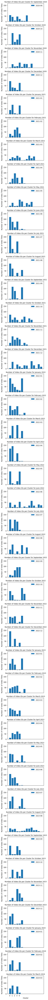

In [169]:
# Plotting bar plots for each month based on video_id_count
months = final_agg_results['month_year'].unique()

fig, axs = plt.subplots(len(months), 1, figsize=(4, 2 * len(months)), sharex=True, sharey=True)

for i, month in enumerate(months):
    data_month = final_agg_results[final_agg_results['month_year'] == month]
    data_month = data_month.sort_values(by='cluster')  # Ensure clusters are sorted for consistent stacking
    
    num_clusters = data_month['cluster'].nunique()
    xticks = range(num_clusters)
    
    axs[i].bar(xticks, data_month['video_id_count'], label=month.strftime('%Y-%m'))
    axs[i].set_title(f'Number of Video IDs per Cluster for {month.strftime("%B %Y")}', fontsize =10)
    axs[i].set_ylabel('Number of Video Titles')
    axs[i].legend()

    # Set x-axis ticks and labels
    axs[i].set_xticks(xticks)
    axs[i].set_xticklabels(data_month['cluster'].unique(), rotation=0, ha='right')  # Ensure labels are readable

plt.xlabel('Cluster')
plt.tight_layout()
plt.show()

In [170]:
final_agg_results.rename(columns={'video_id_count': 'size'}, inplace=True)

In [171]:
final_agg_results.columns

Index(['cluster', 'views_mean', 'views_std', 'LikeRatio1_mean',
       'LikeRatio1_std', 'CommentRatio1_mean', 'CommentRatio1_std',
       'trending_duration_days_mean', 'trending_duration_days_std',
       'views_velocity_mean', 'views_velocity_std', 'comments_polarity_mean',
       'comments_polarity_std', 'size', 'final_title', 'month_year'],
      dtype='object')

In [172]:
large_clusters = final_agg_results[final_agg_results['size'] > 20]

In [173]:
large_clusters

,cluster,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,size,final_title,month_year
0,0,2.014916e+06,1.669649e+06,44.261724,19.685324,3.282931,2.182552,4.965517,0.674485,329735.290189,259725.197810,0.290690,0.085673,58,rocky answer question rihanna rihanna answer q...,2020-09-01
1,1,1.689308e+06,2.278745e+06,93.456905,24.234987,7.342143,2.528783,3.785714,0.781984,364147.484864,620615.309174,0.166429,0.079136,42,ghostemane official video blackpink ice cream ...,2020-09-01
3,3,2.826700e+06,2.346177e+06,66.333913,22.561711,6.493913,3.522116,5.630435,0.609506,419383.254529,337213.094445,0.090652,0.077986,46,fill charli room picture chase cordae gift rod...,2020-09-01
4,4,1.193067e+06,9.426677e+05,52.445217,26.996760,5.542609,2.007971,3.782609,0.998022,232012.443168,185170.572132,-0.053478,0.094080,23,hit rock chic fil crunchwrap tenet movie revie...,2020-09-01
7,7,1.387597e+06,1.834404e+06,32.526964,19.303014,3.137679,1.902550,3.607143,0.966316,275344.747321,359998.908604,0.140357,0.072813,56,tenet movie review blackpink ice cream selena ...,2020-09-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,1,3.326008e+06,5.827435e+06,35.094526,15.478355,2.192632,1.303655,5.621053,1.221953,436999.771115,718575.003105,0.089579,0.080621,95,john cena interview impaulsive big change come...,2024-02-01
292,4,2.927426e+06,4.855245e+06,20.048571,12.351439,1.297532,0.874091,5.467532,1.198512,385697.726987,639305.858919,0.322078,0.101364,77,road house official trailer prime survive hour...,2024-02-01
293,0,1.404800e+06,1.866480e+06,48.435306,24.190208,3.057959,1.655970,6.102041,1.597458,177912.124388,246282.015467,0.331224,0.082250,49,secretly bought customize shock tally bowsprit...,2024-03-01
294,1,2.604098e+06,4.207079e+06,47.446316,18.330866,3.187895,1.874033,7.092105,1.190828,294580.025542,478441.998601,0.063158,0.073398,76,santa klan duki peso pluma son klle video ofic...,2024-03-01


In [174]:
# Function to get top 5 words
def get_top_words(text):
    # Generate word cloud
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white").generate(text)
    
    # Filter out words with 1-2 characters
    filtered_words = {word: freq for word, freq in wordcloud.words_.items() if len(word) >= 2}
    
    # Get the top 10 words
    top_words = list(filtered_words.keys())[:10]
    
    return top_words

In [175]:
large_clusters['top_10_words'] = large_clusters['final_title'].apply(get_top_words)

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\4085890212.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [176]:
large_clusters

,cluster,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,size,final_title,month_year,top_10_words
0,0,2.014916e+06,1.669649e+06,44.261724,19.685324,3.282931,2.182552,4.965517,0.674485,329735.290189,259725.197810,0.290690,0.085673,58,rocky answer question rihanna rihanna answer q...,2020-09-01,"[new, chadwick boseman, official, home, iphone..."
1,1,1.689308e+06,2.278745e+06,93.456905,24.234987,7.342143,2.528783,3.785714,0.781984,364147.484864,620615.309174,0.166429,0.079136,42,ghostemane official video blackpink ice cream ...,2020-09-01,"[video, music, official, new, challenge, ghost..."
3,3,2.826700e+06,2.346177e+06,66.333913,22.561711,6.493913,3.522116,5.630435,0.609506,419383.254529,337213.094445,0.090652,0.077986,46,fill charli room picture chase cordae gift rod...,2020-09-01,"[new, review, challenge, death, mulan, disney,..."
4,4,1.193067e+06,9.426677e+05,52.445217,26.996760,5.542609,2.007971,3.782609,0.998022,232012.443168,185170.572132,-0.053478,0.094080,23,hit rock chic fil crunchwrap tenet movie revie...,2020-09-01,"[try, food, life, trailer, hit, rock, chic, fi..."
7,7,1.387597e+06,1.834404e+06,32.526964,19.303014,3.137679,1.902550,3.607143,0.966316,275344.747321,359998.908604,0.140357,0.072813,56,tenet movie review blackpink ice cream selena ...,2020-09-01,"[new, reveal, official, break, year, series, t..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,1,3.326008e+06,5.827435e+06,35.094526,15.478355,2.192632,1.303655,5.621053,1.221953,436999.771115,718575.003105,0.089579,0.080621,95,john cena interview impaulsive big change come...,2024-02-01,"[trailer, official, season, deadpool wolverine..."
292,4,2.927426e+06,4.855245e+06,20.048571,12.351439,1.297532,0.874091,5.467532,1.198512,385697.726987,639305.858919,0.322078,0.101364,77,road house official trailer prime survive hour...,2024-02-01,"[grammy, lego, official, trailer, hour, test, ..."
293,0,1.404800e+06,1.866480e+06,48.435306,24.190208,3.057959,1.655970,6.102041,1.597458,177912.124388,246282.015467,0.331224,0.082250,49,secretly bought customize shock tally bowsprit...,2024-03-01,"[life, official, trailer, twin, earth, heart, ..."
294,1,2.604098e+06,4.207079e+06,47.446316,18.330866,3.187895,1.874033,7.092105,1.190828,294580.025542,478441.998601,0.063158,0.073398,76,santa klan duki peso pluma son klle video ofic...,2024-03-01,"[official, video, time, fight, episode, player..."


In [177]:
# Convert 'month_year' to datetime if it's not already in datetime format
#large_clusters['month_year'] = large_clusters['month_year'].dt.to_timestamp()
# Extracting the year
large_clusters['year'] = large_clusters['month_year'].dt.year

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\4285630695.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [178]:
large_clusters

,cluster,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,size,final_title,month_year,top_10_words,year
0,0,2.014916e+06,1.669649e+06,44.261724,19.685324,3.282931,2.182552,4.965517,0.674485,329735.290189,259725.197810,0.290690,0.085673,58,rocky answer question rihanna rihanna answer q...,2020-09-01,"[new, chadwick boseman, official, home, iphone...",2020
1,1,1.689308e+06,2.278745e+06,93.456905,24.234987,7.342143,2.528783,3.785714,0.781984,364147.484864,620615.309174,0.166429,0.079136,42,ghostemane official video blackpink ice cream ...,2020-09-01,"[video, music, official, new, challenge, ghost...",2020
3,3,2.826700e+06,2.346177e+06,66.333913,22.561711,6.493913,3.522116,5.630435,0.609506,419383.254529,337213.094445,0.090652,0.077986,46,fill charli room picture chase cordae gift rod...,2020-09-01,"[new, review, challenge, death, mulan, disney,...",2020
4,4,1.193067e+06,9.426677e+05,52.445217,26.996760,5.542609,2.007971,3.782609,0.998022,232012.443168,185170.572132,-0.053478,0.094080,23,hit rock chic fil crunchwrap tenet movie revie...,2020-09-01,"[try, food, life, trailer, hit, rock, chic, fi...",2020
7,7,1.387597e+06,1.834404e+06,32.526964,19.303014,3.137679,1.902550,3.607143,0.966316,275344.747321,359998.908604,0.140357,0.072813,56,tenet movie review blackpink ice cream selena ...,2020-09-01,"[new, reveal, official, break, year, series, t...",2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
289,1,3.326008e+06,5.827435e+06,35.094526,15.478355,2.192632,1.303655,5.621053,1.221953,436999.771115,718575.003105,0.089579,0.080621,95,john cena interview impaulsive big change come...,2024-02-01,"[trailer, official, season, deadpool wolverine...",2024
292,4,2.927426e+06,4.855245e+06,20.048571,12.351439,1.297532,0.874091,5.467532,1.198512,385697.726987,639305.858919,0.322078,0.101364,77,road house official trailer prime survive hour...,2024-02-01,"[grammy, lego, official, trailer, hour, test, ...",2024
293,0,1.404800e+06,1.866480e+06,48.435306,24.190208,3.057959,1.655970,6.102041,1.597458,177912.124388,246282.015467,0.331224,0.082250,49,secretly bought customize shock tally bowsprit...,2024-03-01,"[life, official, trailer, twin, earth, heart, ...",2024
294,1,2.604098e+06,4.207079e+06,47.446316,18.330866,3.187895,1.874033,7.092105,1.190828,294580.025542,478441.998601,0.063158,0.073398,76,santa klan duki peso pluma son klle video ofic...,2024-03-01,"[official, video, time, fight, episode, player...",2024


In [179]:
df_year = large_clusters[large_clusters['year'] == 2020]
df_year

,cluster,views_mean,views_std,LikeRatio1_mean,LikeRatio1_std,CommentRatio1_mean,CommentRatio1_std,trending_duration_days_mean,trending_duration_days_std,views_velocity_mean,views_velocity_std,comments_polarity_mean,comments_polarity_std,size,final_title,month_year,top_10_words,year
0,0,2.014916e+06,1.669649e+06,44.261724,19.685324,3.282931,2.182552,4.965517,0.674485,3.297353e+05,259725.197810,0.290690,0.085673,58,rocky answer question rihanna rihanna answer q...,2020-09-01,"[new, chadwick boseman, official, home, iphone...",2020
1,1,1.689308e+06,2.278745e+06,93.456905,24.234987,7.342143,2.528783,3.785714,0.781984,3.641475e+05,620615.309174,0.166429,0.079136,42,ghostemane official video blackpink ice cream ...,2020-09-01,"[video, music, official, new, challenge, ghost...",2020
3,3,2.826700e+06,2.346177e+06,66.333913,22.561711,6.493913,3.522116,5.630435,0.609506,4.193833e+05,337213.094445,0.090652,0.077986,46,fill charli room picture chase cordae gift rod...,2020-09-01,"[new, review, challenge, death, mulan, disney,...",2020
4,4,1.193067e+06,9.426677e+05,52.445217,26.996760,5.542609,2.007971,3.782609,0.998022,2.320124e+05,185170.572132,-0.053478,0.094080,23,hit rock chic fil crunchwrap tenet movie revie...,2020-09-01,"[try, food, life, trailer, hit, rock, chic, fi...",2020
7,7,1.387597e+06,1.834404e+06,32.526964,19.303014,3.137679,1.902550,3.607143,0.966316,2.753447e+05,359998.908604,0.140357,0.072813,56,tenet movie review blackpink ice cream selena ...,2020-09-01,"[new, reveal, official, break, year, series, t...",2020
9,1,1.858997e+06,1.561115e+06,44.537196,21.860622,3.405421,2.796573,4.364486,1.305955,3.188488e+05,265907.890963,0.066355,0.075877,107,addison rae mom awkward conversation podcast j...,2020-10-01,"[official, trailer, video, play, live, new, ga...",2020
10,2,1.192691e+07,6.323207e+06,54.005200,28.988442,3.265600,1.529850,6.160000,0.850490,1.720786e+06,882396.715250,0.143600,0.099032,25,style swap noah beck james charles blake gray ...,2020-10-01,"[cold open, open snl, debate, noah, beck, dixi...",2020
11,3,1.260452e+06,1.097465e+06,115.197660,40.244868,8.667447,4.137771,3.787234,1.232463,2.385310e+05,215205.513088,0.156809,0.094549,47,dog update vfx artist react tron bad great cgi...,2020-10-01,"[official, trailer, video, stray, update, reac...",2020
12,4,1.738870e+06,1.497550e+06,44.188211,20.580391,3.504947,2.338588,4.378947,1.297944,3.075969e+05,253670.135086,0.281053,0.071511,95,father bride ish holo taco multichrome collect...,2020-10-01,"[eddie van, van halen, life, test, season, tou...",2020
14,1,2.242796e+06,1.619245e+06,48.778788,20.036713,3.287273,1.951666,7.363636,1.245446,2.634681e+05,190674.024765,0.007879,0.071709,33,curse food halloween queen official audio rylo...,2020-11-01,"[halloween, official, charli, kitchen, food, v...",2020


## Engaged Content per Month

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\3723521857.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\3723521857.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



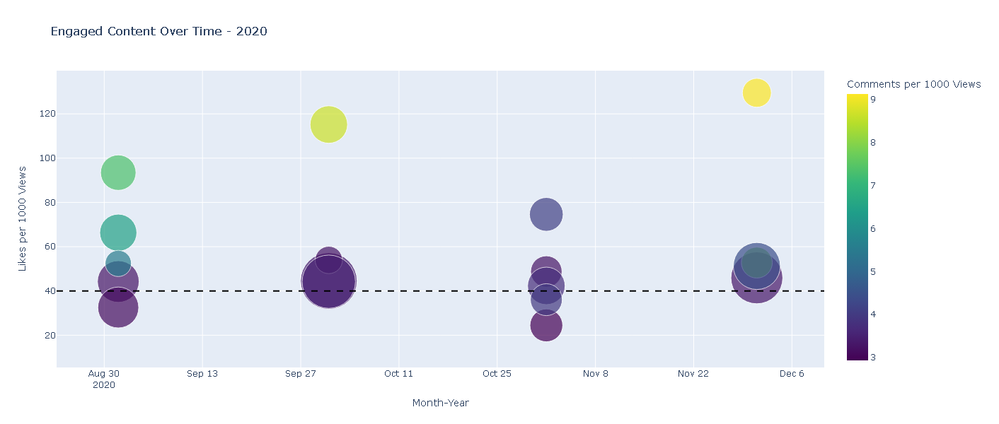

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\3723521857.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\3723521857.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



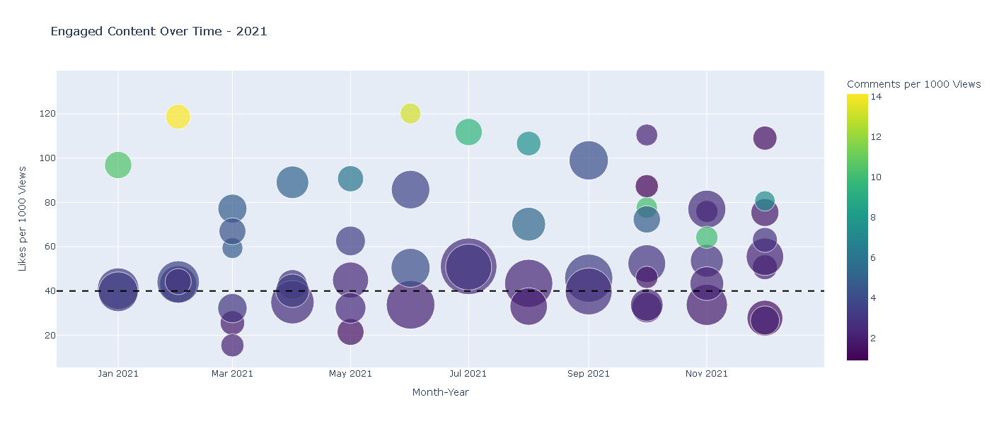

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\3723521857.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\3723521857.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



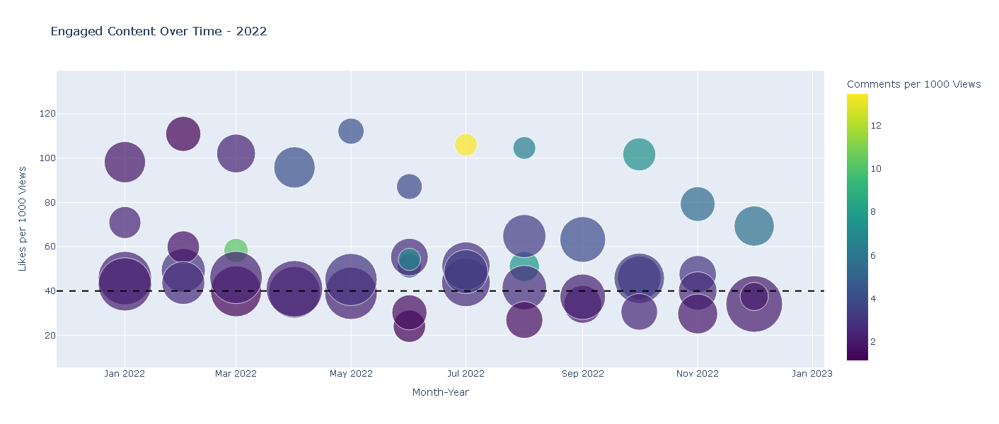

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\3723521857.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\3723521857.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



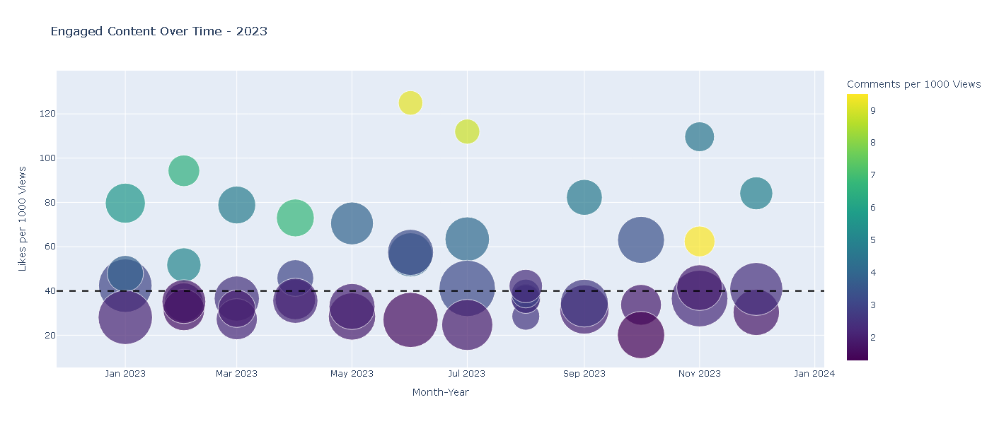

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\3723521857.py:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\salto\AppData\Local\Temp\ipykernel_3796\3723521857.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



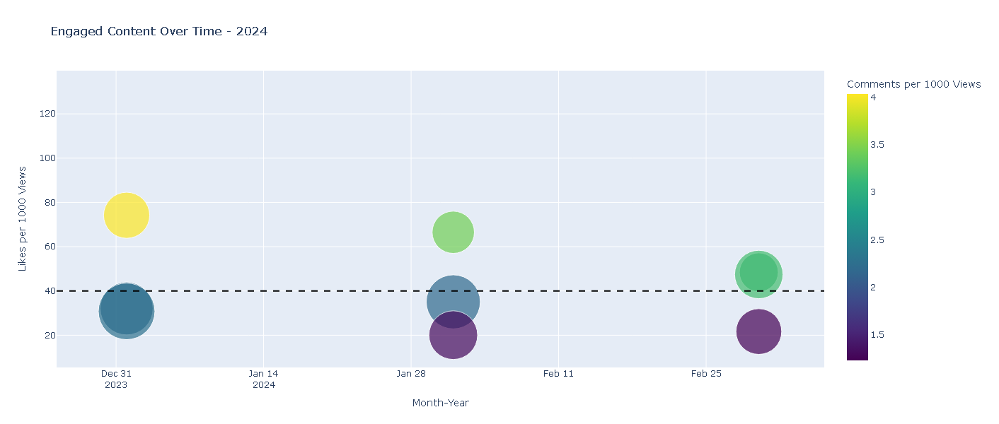

In [180]:
# Get unique years in the large_clusters DataFrame
unique_years = large_clusters['year'].unique()

# Determine the global y-axis range based on all data
global_y_min = large_clusters['LikeRatio1_mean'].min()-10
global_y_max = large_clusters['LikeRatio1_mean'].max()+10


for year in unique_years:
    # Filter data for the current year
    df_year = large_clusters[large_clusters['year'] == year]
    df_year['views_velocity_mean'] = df_year['views_velocity_mean'] / 1000

    # Convert Period objects to strings formatted as 'YYYY-MM'
    df_year['month_year'] = df_year['month_year'].dt.strftime('%Y-%m')

    # Create bubble plot
    fig = px.scatter(
        df_year,
        x='month_year',
        y='LikeRatio1_mean',
        size='size',
        color='CommentRatio1_mean', 
        hover_name='year',
        hover_data={'month_year': True, 'size': True, 'LikeRatio1_mean': False, 'CommentRatio1_mean': ':.1f', 'comments_polarity_mean': ':.1f', 
                    'views_velocity_mean': ':.0f', 'trending_duration_days_mean': ':.1f', 'top_10_words': True},
        title=f'Engaged Content Over Time - {year}',
        labels={'month_year': 'Month-Year', 'size': 'Titles', 'views_velocity_mean': 'Mean Views (K/trending day)', 'trending_duration_days_mean': 'Days Trending', 
                'top_10_words': 'Top 5 words', 'LikeRatio1_mean': 'Likes per 1000 Views', 'CommentRatio1_mean': 'Comments per 1000 Views', 
                 'comments_polarity_mean': 'Comments Polarity'           
               }, 
        size_max=70,  # Max size of bubbles
        width=1300,  # Overall figure width
        height=600,  # Overall figure height
        color_continuous_scale='viridis',
        range_color=[df_year['CommentRatio1_mean'].min(), df_year['CommentRatio1_mean'].max()],  # Ensure consistent color scale
        range_y=[global_y_min, global_y_max]  # Ensure consistent y-axis scale
    )

    # Add horizontal line at y = 40
    fig.add_shape(type='line', xref='paper', yref='y', x0=0, x1=1, y0=40, y1=40, line=dict(color='black', width=2, dash='dash') )

    
    # Customize layout
    fig.update_traces(marker=dict(sizemode='area', sizeref=0.5*max(df_year['size'])/(40.**2), line_width=1))

    # Update x-axis title
    fig.update_xaxes(title_text='Month-Year')

    # Update legend title
    fig.update_layout(
        legend_title_text='Year'
    )

    # Save the figure as HTML file
    html_file_path = f'../images/Leading_topics_{year}.html'
    pio.write_html(fig, html_file_path, auto_open=False)

    fig.show()